# Data Preprocessing

### Uncomment the df row

In [20]:
import pandas as pd

def custom_agg(series):
    total = 0
    divisor = 14 # number of particpants

    for value in series:
        if isinstance(value, (int, float)):
            total += value
        elif isinstance(value, str):
            total += 0
            divisor -= 1 # whenever a string is found reduce divisor by 1

    return total / divisor if divisor != 0 else 0

#Group by 'WORD_ID' and apply the custom aggregation function - set path to the correct datasets
# result_df = pd.read_excel("MonolingualReadingData.xlsx").groupby("WORD_ID", sort=False)["WORD_GAZE_DURATION"].agg(lambda x: custom_agg(x)).reset_index()
# result_df.to_excel("merger.xlsx", index=False)

In [25]:
#!pip install odfpy #install if not installed
row_to_delete = (32932, 40876)  # Monolingual and EnglishMaterial dataset have discrepencies on 2 words; "No", "These"

# specify the path to the files
df1 = pd.read_excel("merger.xlsx") #contains WORD_ID and their respective aggregated GAZE_DURATION - derived from MonolingualReadingData.xlsx
df2 = pd.read_excel("EnglishMaterial.xlsx").drop(index=row_to_delete[0]).drop(index=row_to_delete[1]).reset_index(drop=True) #contains at least WORD_ID, SENTENCE_ID and WORD


# Merge based on the "WORD_ID" column
merged_df = pd.merge(df1, df2, on="WORD_ID", how="inner")
# merged_df.to_excel("final_table.xlsx", index=False)

# Deleted three words, that didn't correspond to the readingmaterial dataset to ensure equal length when merging

In [1]:
from transformers import BertConfig, BertTokenizerFast, BertModel

model_name = 'bert-base-uncased'

config = BertConfig.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_attentions=True)
embedding_layer = model.embeddings.word_embeddings

print(model)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0): BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
          

In [2]:
tokenizer = BertTokenizerFast.from_pretrained(model_name)
print('vocabulary size: ', len(tokenizer.vocab))

vocabulary size:  30522


In [3]:
import pandas as pd
import numpy as np
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import Dataset, DataLoader


df = pd.read_excel("final_table.xlsx") #Path to your excel file
data = df.groupby("SENTENCE_ID", sort=False)["WORD"].apply(lambda x: " ".join(str(word) for word in x)).tolist()
print(len(data), data)

5284 ['The intense interest aroused in the public by what was known at the time as The Styles Case has now somewhat subsided', 'Nevertheless in view of the worldwide notoriety which attended it I have been asked both by my friend and the family themselves to write an account of the whole story', 'This we trust will silence the sensational rumours which still persist', 'I will therefore briefly set down the circumstances which led to my being connected with the affair', 'I had been invalided home from the Front and after spending some months in a rather depressing Convalescent Home was given a months sick leave', 'Having no near relations or friends I was trying to make up my mind what to do when I ran across John Cavendish', 'I had seen very little of him for some years', 'Indeed I had never known him particularly well', 'He was a good fifteen years my senior for one thing though he hardly looked his years', 'As a boy though I had often stayed at Styles his mothers place in', 'We had a

In [4]:
def min_max_normalization(df):
    gaze = df["WORD_GAZE_DURATION"]
    words = df["WORD"]
    
    min_val = gaze.min()
    max_val = gaze.max()

    normalized_column = (gaze - min_val) / (max_val - min_val)

    return normalized_column, words

# Assuming df is your DataFrame
normalized_gaze, words = min_max_normalization(df)
print(len(normalized_gaze), len(words))
for gaze_val, word_val in zip(normalized_gaze, words):
    print(f"{gaze_val:.4f}, {word_val}")

54362 54362
0.2299, The
0.2807, intense
0.2976, interest
0.2207, aroused
0.1739, in
0.2188, the
0.2370, public
0.2309, by
0.2913, what
0.2032, was
0.1966, known
0.2213, at
0.2390, the
0.1882, time
0.1569, as
0.2129, The
0.3199, Styles
0.2072, Case
0.2242, has
0.2232, now
0.2423, somewhat
0.3569, subsided
0.3227, Nevertheless
0.2279, in
0.2634, view
0.1885, of
0.2115, the
0.3529, worldwide
0.5821, notoriety
0.2132, which
0.2310, attended
0.2574, it
0.2130, I
0.2128, have
0.2248, been
0.2098, asked
0.2162, both
0.2302, by
0.2367, my
0.2086, friend
0.2092, and
0.2501, the
0.3124, family
0.2165, themselves
0.2150, to
0.1852, write
0.2437, an
0.1690, account
0.1596, of
0.1842, the
0.2024, whole
0.2587, story
0.1947, This
0.1833, we
0.2509, trust
0.2552, will
0.2485, silence
0.1878, the
0.2665, sensational
0.2650, rumours
0.1912, which
0.2585, still
0.2167, persist
0.2126, I
0.2134, will
0.2632, therefore
0.2793, briefly
0.2208, set
0.2246, down
0.1635, the
0.2650, circumstances
0.2880, whic

In [5]:
from typing import List, Tuple

def pooling(
    input_ids: List[int],
    tokens: List[str],
    word_ids: List[int]
) -> Tuple[List[int], List[str]]:
    new_input_ids = []
    new_tokens = []

    current_word_id = True
    current_token = None

    apostrophes = ["s", "t", "ll", "ve", "clock", "d"]
    save_next = False
    
    for input_id, token, word_id in zip(input_ids, tokens, word_ids):
        if current_word_id is True:
            current_word_id = word_id
            current_token = token
        elif token in ["'", "-"]:
            current_token += token
            save_next = True
        else:
            if word_id is not True and current_word_id == word_id:
                current_token += token
            else:
                
                if save_next and (token in apostrophes or current_token[-1] == "-"):
                    current_token += token
                    save_next= False
                else:
                    new_input_ids.append(input_id)
                    new_tokens.append(current_token.replace("#", ""))
                    current_word_id = word_id
                    current_token = token

    # Add the last token
    if current_word_id is not None or current_token is not None:
        new_tokens.append(current_token)
        new_input_ids.insert(0, 101)

    return new_input_ids, new_tokens

# Example usage
#inp = [101, 10000, 10001, 10002, 1998, 2065, 2009, 2910, 1005, 1056, 102]
#tok = ['[CLS]', "cold", "-", "blooded", 'and', 'if', 'it', 'hadn', "'", 't', '[SEP]']
#wor = [None, 0, 1, 2, 3, 4, 5, 6, 7, 8, None]

#wor = [None, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 15, 16, 17, None]
#tok = ['[CLS]', 'at', 'mary', "'", 's', 'an', 'hour', 'later', 'she', 'uses', 'almost', 'the', 'same', 'words', 'but', 'the', 'stand', '##point', 'is', 'different', '[SEP]']
#inp = [101, 2012, 1051, 1005, 5119, 2019, 3178, 2101, 2016, 3594, 2471, 1996, 2168, 2616, 2021, 1996, 3233, 8400, 2003, 2367, 102]


#new_input_ids, new_tokens = pooling(inp, tok, wor)

#print(new_input_ids)
#print(new_tokens)

from typing import Tuple, List

def pooling(
    input_ids: List[int],
    tokens: List[str],
    word_ids: List[int]
) -> Tuple[List[int], List[str]]:
    new_input_ids = []
    new_tokens = []

    current_word_id = True
    current_token = None
    
    

    for input_id, token, word_id in zip(input_ids, tokens, word_ids):
        if current_word_id is True:
            current_word_id = word_id
            current_token = token
        else:
            if word_id is not True and current_word_id == word_id:
                current_token += token
            else:
                new_input_ids.append(input_id)
                new_tokens.append(current_token.replace("#", ""))
                current_word_id = word_id
                current_token = token

    # Add the last token
    if current_word_id is not None or current_token is not None:
        new_tokens.append(current_token)
        new_input_ids.insert(0, 101)

    return new_input_ids, new_tokens

In [6]:
def pearson_correlation_coefficient(x, y):
    """
    Calculate the Pearson correlation coefficient between two arrays x and y.

    Parameters:
    - x: numpy array or list
    - y: numpy array or list

    Returns:
    - Pearson correlation coefficient
    """
    # Convert input lists/arrays to numpy arrays
    x = np.array(x)
    y = np.array(y)

    # Check if the arrays have the same length
    if len(x) != len(y):
        raise ValueError("Input arrays must have the same length.")

    # Calculate means
    mean_x = np.mean(x)
    mean_y = np.mean(y)

    # Calculate the covariance and variances
    covariance = np.sum((x - mean_x) * (y - mean_y))
    variance_x = np.sum((x - mean_x)**2)
    variance_y = np.sum((y - mean_y)**2)

    # Calculate Pearson correlation coefficient
    correlation_coefficient = covariance / np.sqrt(variance_x * variance_y)

    return correlation_coefficient

# Piping Sentences through BERT

In [7]:
print(f"inpt id\ttoken\n")
start = 0
layers = [[],[],[],[],[],[],[],[],[],[],[],[]]
longest_sentence = [[""], []]
medium_sentence = [[""], []]
rare_sentence = [[""], []]
rare_word = "phraseology"


for n, sentence in enumerate(data):
    encoded = tokenizer.encode_plus(sentence, return_tensors="pt")
    
    word_ids = encoded.word_ids()
    input_ids = encoded["input_ids"]
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])  # Assuming a single sentence
    
    len_input = len(input_ids[0])
    
    input_ids, tokens = pooling(input_ids.tolist()[0], tokens, word_ids)
    input_ids = torch.tensor([input_ids])
    #print(input_ids, tokens)
    
    len_input = len(input_ids[0])

    attention_mask = torch.ones(len_input).unsqueeze(0)

    model_output = model(input_ids=input_ids, attention_mask=attention_mask)       
        
    attention_scores = model_output.attentions
    
    if len_input > len(longest_sentence[0][0]): # extract longest sentence in the dataset
        longest_sentence = [[tokens], [attention_scores]]
    
    if len_input == 22: # extract a sentence of length 20
        medium_sentence = [[tokens], [attention_scores]]
        
    if rare_word in tokens:
        rare_sentence = [[tokens], [attention_scores]]

    for j in range(12):
        attention_avg = torch.mean(attention_scores[j][0], dim=0)
        queries_avg = torch.mean(attention_avg, dim=0)[1:-1]
        # print("avg", queries_avg)
        
        queries_list = queries_avg.tolist()
        gaze_list = list(normalized_gaze[start:start + len_input - 2])
        
        corr = pearson_correlation_coefficient(queries_list, gaze_list)
        
        if len_input > 4:
            layers[j].append(corr)
               
        print(corr) #nan if len(sentence) == 1, corr = +-1 if len(sentence) == 2
        
    print(f"sentence {n+1}\t{len(queries_list), len(gaze_list)}")
    #print(tokens)
    print(words[start:start + len_input - 2])
    start = start + len_input - 2

inpt id	token

0.5186162025910938
-0.2627283065844737
0.0011681864608755073
0.14932255868119393
0.1996589827097711
-0.21184652599735057
0.10066445441920861
-0.05087686656173079
0.3451763817256667
0.025649548730169506
0.22951037352088424
0.379382858633516
sentence 1	(22, 22)
0          The
1      intense
2     interest
3      aroused
4           in
5          the
6       public
7           by
8         what
9          was
10       known
11          at
12         the
13        time
14          as
15         The
16      Styles
17        Case
18         has
19         now
20    somewhat
21    subsided
Name: WORD, dtype: object
0.49158981163070253
-0.1708673295768601
-0.08460470958064491
0.19210871157863837
0.3084081161939345
-0.11923326678202652
0.04370252554911466
0.1559354262216889
0.08942121209986918
0.5500559112358354
0.20413746485995196
0.011198932672377182
sentence 2	(30, 30)
22    Nevertheless
23              in
24            view
25              of
26             the
27       world

0.6782798084032998
-0.043271077995616074
0.5441866522974833
0.14590943365973327
0.28392176914068845
0.30518309791514614
0.4564744120070221
0.20756939260775703
-0.3008901720736858
0.5012759764329701
-0.09313470039115294
-0.1929199207225051
sentence 18	(11, 11)
264          She
265    certainly
266        could
267          not
268           be
269            a
270          day
271         less
272         than
273      seventy
274          now
Name: WORD, dtype: object
0.2754846484855433
-0.4269971991325348
-0.2989532479505038
-0.2670827167643436
0.187470104300469
-0.14880718984444774
0.14457179006305937
0.002668382867182284
0.1855590826405898
0.38171116629503093
0.1916774574560624
-0.10833350557459537
sentence 19	(26, 26)
275              I
276       recalled
277            her
278             as
279             an
280      energetic
281     autocratic
282    personality
283       somewhat
284       inclined
285             to
286     charitable
287            and
288         social
28

-0.1612799090422649
0.08331219373365865
0.0654361805831167
-0.331658184853633
-0.08236766461888323
-0.04351624080931426
0.04075408398117565
-0.19344590484382226
-0.2356847233149098
0.08301669033177363
0.07666236256000539
0.41776906178300044
sentence 29	(14, 14)
542          John
543       noticed
544            my
545      surprise
546            at
547           the
548          news
549            of
550           his
551       mothers
552    remarriage
553           and
554        smiled
555        rather
Name: WORD, dtype: object
0.4065440138023516
-0.5758289393865547
-0.4349011003789215
0.23740356961579465
0.14886875724137677
-0.44424866879093344
-0.07309367938088839
-0.24476732063591897
-0.651497530282441
0.07851899095195485
0.10944730545116756
-0.3749794334282945
sentence 30	(7, 7)
556      Rotten
557      little
558     bounder
559         too
560          he
561        said
562    savagely
Name: WORD, dtype: object
-0.04031607487097119
-0.5092880161960456
-0.2036119100290508
-

C:\Users\Artem Shkabruk\AppData\Local\Temp\ipykernel_15096\551316942.py:30: RuntimeWarning: invalid value encountered in double_scalars
  correlation_coefficient = covariance / np.sqrt(variance_x * variance_y)


0.8012086686961007
-0.24646627774995045
-0.20163203362386856
-0.0669050115503578
0.09648779937471623
-0.5153667244923691
0.03959129484071877
-0.4827177832950992
0.6421375174967698
-0.09115922556512464
-0.32491991208827126
-0.5992683036637945
sentence 37	(12, 12)
597          Not
598    precisely
599        young
600          and
601    beautiful
602          but
603           as
604         game
605           as
606         they
607         make
608         them
Name: WORD, dtype: object
0.6171076339274256
-0.7079644936178111
-0.0470888153950738
0.6712694083526102
0.9347334086613799
0.9440540251431999
0.8403059370990501
0.8557002200114527
0.8718784891764155
0.6426232556951669
0.820607334015394
0.7804689892750135
sentence 38	(5, 5)
609      You
610     were
611    going
612       to
613      say
Name: WORD, dtype: object
-0.9999946111590744
0.7099352229019499
0.20739906198420888
0.9932330961418033
0.15042033440723276
0.9781212095252915
0.47210360806933005
0.987528739358694
0.99640751986

0.19090163653841294
-0.4148258915717212
0.4829719515429588
0.20747312338772622
0.022036534609439315
-0.11668131354612744
-0.22678561274803163
-0.05578318384189376
-0.14872877300544768
0.13251811940989913
0.19816084714750992
0.3368246457158155
sentence 56	(12, 12)
825         Got
826           a
827        drop
828          or
829         two
830          of
831      petrol
832       still
833         you
834         see
835          he
836    remarked
Name: WORD, dtype: object
-0.18005078319076492
0.11813196437007084
-0.3983348050004709
-0.17106028671876122
0.13608337047021932
0.08450267561892161
0.6348337102955832
0.3711805538039237
0.12698987184482605
0.387975187601207
0.5689846363096849
0.5287842601574966
sentence 57	(5, 5)
837        Mainly
838         owing
839            to
840           the
841    activities
Name: WORD, dtype: object
0.9119359379048638
0.34711811003529797
0.06575724917129519
0.43879607153128214
-0.22671863639421685
-0.16634934228829348
0.0504478218081491
-0.4010

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 73	(1, 1)
1042    Cynthia
Name: WORD, dtype: object
-0.7479776644528279
0.704056335802002
-0.6988893250638932
0.3811915401928902
0.8358836767391599
0.5413156733248974
0.5680075032911549
0.6225771667107456
-0.045723267665523495
-0.26560470067571984
0.5948544544197052
0.27915166304845207
sentence 74	(4, 4)
1043    Thats
1044      not
1045     your
1046     wife
Name: WORD, dtype: object
0.7201471209635288
-0.6821781750253338
-0.2416027845728259
-0.01319865295142624
-0.010827752807900885
0.17953760972063482
0.25669919705385613
0.34870280222785616
-0.21742497655585077
-0.12282059966122598
0.18336334149759215
-0.06964072579471392
sentence 75	(20, 20)
1047           No
1048      Cynthia
1049           is
1050            a
1051     protegee
1052           of
1053           my
1054      mothers
1055          the
1056     daughter
1057           of
1058           an
1059          old
1060           of
1061         hers
1062          who
1

-0.03555501539989656
-0.24154433158554084
0.8537232695108221
0.32000246614365563
-0.5717594092604942
0.28560493229823647
-0.2361076366518413
0.40428953194225714
-0.7432360324921614
-0.2796808600548332
-0.9113591164514191
-0.9561865195616748
sentence 94	(4, 4)
1248     Wish
1249      you
1250    hadnt
1251    later
Name: WORD, dtype: object
-0.4322691375313031
0.13494633234879205
-0.7444540070984276
-0.20173557748091636
-0.3829542965087895
-0.5145968577252109
-0.29093067983461407
-0.6585334024091428
-0.3971119001450832
0.6146759758911181
-0.1112806568330023
0.12650944310708176
sentence 95	(6, 6)
1252       Youre
1253           a
1254       cynic
1255        said
1256        John
1257    laughing
Name: WORD, dtype: object
0.040049173538719667
0.2268387200611663
-0.6361209374020955
0.9635559050456304
0.08909399590101545
0.28655061828235445
0.9720312755199525
0.5095381141924901
0.7698161486956161
0.8627141569764201
0.46151024624101306
-0.10530239990553768
sentence 96	(4, 4)
1258    Wheres


0.7796542137366065
-0.0957822763185651
0.03227589848553502
0.010770520240072388
0.14996732802412088
0.7611481205577627
0.4350610570051608
0.3479399565606114
0.3713500852895973
0.24512762411195504
0.5942384548014548
-0.11699284291728661
sentence 114	(9, 9)
1556       Ill
1557     write
1558        to
1559      Lady
1560       for
1561       the
1562    second
1563       day
1564    myself
Name: WORD, dtype: object
0.4874961998710425
-0.06439018184168495
-0.061073549103409154
0.09236513081250652
0.671105471521977
0.6487713390726697
0.9158840201518222
0.5961089534018952
0.6474749672808509
0.7344588515453346
0.8320439457701034
0.6938926154850416
sentence 115	(10, 10)
1565          Or
1566       shall
1567          we
1568        wait
1569       until
1570          we
1571        hear
1572        from
1573         the
1574    Princess
Name: WORD, dtype: object
0.26035495950384435
-0.32318549499719523
0.3482906158001525
0.5428282220867321
0.24353114954517618
0.2926057274698406
0.301081043871

-0.04950437654091567
-0.11020931611915838
0.1222318184380307
0.009387037098166793
0.019898251947217893
0.08691855403003684
-0.058791769736002746
0.2178311609386765
sentence 134	(15, 15)
1776       Then
1777    turning
1778         to
1779        his
1780       wife
1781      Emily
1782    dearest
1783          I
1784      think
1785       that
1786    cushion
1787         is
1788          a
1789     little
1790       damp
Name: WORD, dtype: object
0.6066455810978495
0.01767605962091779
0.10862742992602849
-0.019466822658901695
0.32860477567665947
0.17556323015037037
0.43615600967981616
-0.30735009534531454
0.06007670544353155
0.28308465419916123
0.1783004229283412
0.00790632429910821
sentence 135	(16, 16)
1791              She
1792           beamed
1793           fondly
1794               on
1795              him
1796               as
1797               he
1798      substituted
1799          another
1800             with
1801            every
1802    demonstration
1803               of

-0.24746389734358318
-0.13029692265598702
0.2079494931038876
0.3486272127091696
0.35120166971820005
-0.06952569095894696
0.07171392544116982
-0.09520281772158967
-0.08780993344368014
0.24146794362443955
0.24477278380041775
0.457254147001769
sentence 150	(15, 15)
1991           What
1992          would
1993            you
1994         really
1995         choose
1996             as
1997              a
1998     profession
1999             if
2000            you
2001          could
2002           just
2003        consult
2004           your
2005    inclination
Name: WORD, dtype: object
0.9864222720457567
-0.7641874702603566
0.6638106506237137
-0.9190884883426362
0.8041477497346897
0.9890886347823705
0.22245303379032383
0.259195457380738
0.544205227479023
0.7785909316505877
0.9885064573813502
0.9091963297959051
sentence 151	(3, 3)
2006       Well
2007       that
2008    depends
Name: WORD, dtype: object
0.27956837635070003
-0.24915221463485634
0.3248919878003543
0.9319223317231052
0.2637155

0.9294647079716918
-0.7037361342364858
-0.06613486763173312
0.4757707516730246
0.6808706039103202
0.694217908662772
0.132746235663778
0.5340811738897104
0.14215164942622827
0.06632235704069592
0.345831406698277
0.51772655725118
sentence 172	(4, 4)
2143    Real
2144    know
2145      at
2146    once
Name: WORD, dtype: object
-0.18166576617261032
-0.0074000520637345765
0.454664963443367
0.041418127906028335
0.06141690196866618
-0.18925725828514145
-0.1914805618318727
-0.22969466399200716
0.11212652833700623
0.09158021860270565
0.015043400477431718
0.36345028037973226
sentence 173	(11, 11)
2147           There
2148            have
2149            been
2150               a
2151           great
2152          number
2153              of
2154    undiscovered
2155          crimes
2156               I
2157          argued
Name: WORD, dtype: object
0.4914918186485178
0.29008334515910716
-0.5161349101661199
-0.1055586066541268
0.2825927060906355
0.18572577283182315
0.3955389897639146
0.0667687255

0.3986371354494384
-0.7447459495555443
0.9514994667423474
0.648686938777473
0.9811306619087509
0.9375717413945084
-0.9800877609760525
0.9956839142719389
0.16891876223222055
0.32335623583949813
0.9225374073662563
0.8850732332459041
sentence 192	(3, 3)
2316         Oh
2317     theres
2318    Cynthia
Name: WORD, dtype: object
-0.09175261722586489
-0.15467058139054846
-0.5657285625083874
-0.17658861141028842
-0.16939702033058973
0.12984465054701902
-0.25122619188204
-0.5172184344455429
-0.30459245209498303
0.18373310300283976
-0.6419238090238772
-0.3060057621096773
sentence 193	(5, 5)
2319        A
2320    young
2321     girl
2322       in
2323        V
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 194	(1, 1)
2324    A
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 195	(1, 1)
2325    D
Name: WORD, dtype: object
0.042244155331452066
-0.6350816550028134
-0.536309237496714
-0.17344347658338946
0.05083850294864592
0.15567

0.5740583809043797
-0.720369394748843
0.9716747346302974
0.4281611638880614
0.892720260025285
0.9174583166988443
0.7803509851569539
0.999524879792993
-0.08591871441485822
0.9413328265894089
0.2606454356439444
0.22086236818572752
sentence 218	(3, 3)
2490      They
2491    simply
2492       are
Name: WORD, dtype: object
0.5792678556714996
-0.40167789099059104
0.30903946588771636
0.905137303164155
0.9463102375589867
0.7600520223711246
0.5755833178356304
0.9911713092074802
0.3488237177109843
0.6012959160505478
0.9608659080408644
0.2674613075232987
sentence 219	(3, 3)
2493    Youve
2494       no
2495     idea
Name: WORD, dtype: object
-0.1660516636678286
-0.6562871571552193
-0.5641130456757093
-0.048393011935265566
0.041030669829390465
0.09867382564142879
-0.04832073494783667
0.22759737194558505
0.08757830211681798
0.2148625185797785
0.12191616833187316
0.22943394846763143
sentence 220	(12, 12)
2496           But
2497            Im
2498           not
2499             a
2500         nurse
25

0.25721916725876354
-0.29006926078869655
-0.24485150951744394
-0.06413019373425004
0.0038909269434048185
-0.04419429029892187
-0.06788853243435104
-0.34080213821505745
-0.4254115470515457
-0.11010281796897656
-0.005587597695312292
-0.11426515726324575
sentence 238	(21, 21)
2725           At
2726          the
2727         same
2728       moment
2729            a
2730          man
2731      stepped
2732          out
2733         from
2734          the
2735       shadow
2736           of
2737            a
2738         tree
2739          and
2740       walked
2741       slowly
2742           in
2743          the
2744         same
2745    direction
Name: WORD, dtype: object
-0.2507373007966792
-0.1269458361470892
0.15501655681161458
-0.040353615844921725
-0.5861967400395448
-0.4111743733079776
-0.7866066002456548
-0.5816592221786169
-0.42800621791706817
-0.44008011540653563
-0.1409586471567474
0.23604177391229128
sentence 239	(10, 10)
2746            He
2747        looked
2748         about

-1.0
-0.9999999999999999
-1.0
-1.0
0.9999999999999999
-0.9999999999999998
-1.0
-1.0
-0.9999999999999998
1.0
-1.0
-1.0
sentence 254	(2, 2)
2950      John
2951    nodded
Name: WORD, dtype: object
-0.09781787534612019
0.11156072379544502
0.7013624809934579
0.49370405227047487
0.65050884867126
0.659537810773187
0.23514299083370716
0.5517056990992826
0.2704809637217429
0.44050662074848707
0.4576577373877392
0.5817904831377828
sentence 255	(9, 9)
2952        Yes
2953        you
2954        see
2955        she
2956       went
2957         to
2958        the
2959      mater
2960    herself
Name: WORD, dtype: object
-1.0
1.0000000000000002
1.0
-1.0
1.0000000000000002
1.0000000000000002
1.0
1.0
1.0
1.0
1.0
1.0
sentence 256	(2, 2)
2961       Miss
2962    entered
Name: WORD, dtype: object
0.6259606054720681
-0.036630679180476605
0.22371394461773653
0.3316175958251882
0.6094604177614186
0.4528679279880881
0.3419745525936089
0.13598278351652227
0.554890030667443
0.5128262934959786
0.5823132317675558

0.6590633074689917
0.15484800563924644
0.12201221841738019
0.026181310571523935
0.21450077971873635
-0.4303938236112577
0.3791367998125375
0.05244268627069466
-0.13038865057830576
-0.118057233564259
0.08211446658052939
-0.2302435002446356
sentence 277	(14, 14)
3142         You
3143         can
3144         say
3145        what
3146         you
3147        like
3148          to
3149          me
3150         but
3151    remember
3152        what
3153         Ive
3154        told
3155         you
Name: WORD, dtype: object
0.26505119861404025
-0.37560938894046175
0.6226879780741108
-0.7192674810395574
0.4996202343587046
-0.2676315178501691
-0.48663325380978917
-0.32499914662097373
-0.6967016753429969
-0.7868523715626281
-0.908098525000546
-0.8093530489468099
sentence 278	(4, 4)
3156    Hes
3157      a
3158    bad
3159    lot
Name: WORD, dtype: object
0.2563920163533828
-0.49794301960548265
0.6475821703804657
-0.3652946507735381
0.9987974689035788
0.13723532901109756
0.14781075850137926
-0.

0.4873210260932751
0.06297005422446586
-0.45002623961842025
0.26354863467516176
0.5884334676393723
0.5733345420505075
0.8947186544845673
0.41940199786972965
0.35807021098305536
0.7002911322604208
0.1265144695557394
-0.11106460717719507
sentence 303	(8, 8)
3342    overwrought
3343            She
3344    interrupted
3345             me
3346             by
3347         slowly
3348        shaking
3349            her
Name: WORD, dtype: object
0.8369827674767393
-0.0862521891445174
0.4975963703974034
-0.8171217169590123
-0.39955608655322683
0.6208088326986448
-0.7041126151639854
-0.5667172353589758
-0.7725626537181196
-0.49722987056628326
-0.2105808642587069
-0.1572906654250021
sentence 304	(4, 4)
3350    forefinger
3351         Young
3352           man
3353         trust
Name: WORD, dtype: object
0.4645342227545739
-0.5698290159845956
-0.03939209158882756
-0.23165693851763208
0.37496555544449883
0.15579909913071435
-0.13886417214874575
0.42801797328863833
-0.07780453715412207
0.036522635452

0.29564277010132206
-0.6171852706390715
-0.42648287218446196
0.047436973699885095
0.13227061580629199
-0.2546637907298861
-0.3422880353059516
-0.05883710068433702
0.18298977425212132
0.77182476519743
0.2484182542517399
0.3576398894180368
sentence 322	(12, 12)
3546    believe
3547        And
3548        hes
3549          a
3550      great
3551     friend
3552         of
3553      Marys
3554        put
3555         in
3556    Cynthia
3557        the
Name: WORD, dtype: object
-0.3781318133412657
-0.7371096363553963
-0.7226091911547552
-0.004002577794862855
0.730019089131206
-0.42421376996516313
0.1987697538876656
-0.3597271470409076
0.5090694917535581
0.3869697374582473
0.1943204427943938
0.35132191263735046
sentence 323	(7, 7)
3558    irrepressible
3559             John
3560        Cavendish
3561          frowned
3562              and
3563          changed
3564              the
Name: WORD, dtype: object
0.38457558711762796
-0.629188569900967
-0.7034225357002131
0.3350119170824734
-0.5582

-0.5265514474969997
-0.002541900324001681
0.5020755388752782
0.5700438937453031
0.5691266335559043
0.5802379913927118
0.928842479619159
0.9235794177293499
0.4947087394291544
0.15801587461889674
0.3671760633017419
0.7588311156538547
sentence 343	(5, 5)
3772      money
3773    Couldnt
3774       your
3775    brother
3776       help
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 344	(1, 1)
3777    you
Name: WORD, dtype: object
0.05618732020483062
-0.28724739586650905
-0.21513659464377646
-0.20316965400273748
-0.3615279769726987
-0.05919563442966536
-0.008928243529973817
0.03133932651315024
0.4436417812383503
0.4117924696221124
0.30018726412750324
0.43739623294540547
sentence 345	(14, 14)
3778      Lawrence
3779           Hes
3780          gone
3781       through
3782         every
3783         penny
3784            he
3785          ever
3786           had
3787    publishing
3788        rotten
3789        verses
3790            in
3791         fancy
Name

0.3654653004390162
-0.5503478145610157
-0.3282634834385331
-0.11054690159494358
0.4405517505855859
0.17664604820315397
0.2479617218865726
0.21033798610337778
0.04851090044058991
0.11912572780709577
-0.05899404735562348
-0.1737553912732775
sentence 367	(21, 21)
4095         night
4096            We
4097          were
4098           all
4099          busy
4100        during
4101           the
4102       morning
4103     arranging
4104           and
4105    decorating
4106           the
4107          Hall
4108            in
4109           the
4110       village
4111         where
4112            it
4113           was
4114            to
4115          take
Name: WORD, dtype: object
0.738156384803623
-0.2184367804601964
0.2688251761962042
0.2738279697924902
0.12218441758375985
0.36277998944299933
0.036210612801999296
-0.006849029420398633
-0.18389238169877353
-0.06372451587404317
0.026611445541614966
-0.34645970102757484
sentence 368	(13, 13)
4116        place
4117           We
4118         

0.5290267732892768
-0.3754063778135632
-0.12284221525961056
-0.12190451892750938
0.22862801519596745
0.12157720415751672
0.21530962162421002
0.04043498804231238
0.09931221563458906
0.21409905274901836
-0.026719942911098995
-0.15026440840925903
sentence 383	(34, 34)
4324           We
4325          had
4326            a
4327     pleasant
4328     luncheon
4329          and
4330           as
4331           we
4332        drove
4333         away
4334     Lawrence
4335    suggested
4336         that
4337           we
4338       should
4339       return
4340           by
4341        which
4342          was
4343       barely
4344            a
4345         mile
4346          out
4347           of
4348          our
4349          way
4350          and
4351          pay
4352            a
4353        visit
4354           to
4355      Cynthia
4356           in
4357          her
Name: WORD, dtype: object
-0.024102322632769225
-0.016365123512215397
-0.14387082336499815
0.11444211599083957
-0.02834038

0.7535210471278928
-0.574836729390372
-0.11127480905728188
0.9999997740098169
0.9601002524786333
-0.13439520152349682
0.9241272016184642
-0.7482487084309876
0.996055025971322
0.9992967504294409
0.7119664262331707
0.6492218319237927
sentence 399	(3, 3)
4558    cupboard
4559         The
4560         big
Name: WORD, dtype: object
0.6020471733207894
-0.04690219888159516
0.20695917304132339
0.2772799350412132
0.21352677940156076
-0.04538376201557228
0.07875223609717678
0.0013029025498567533
-0.004933750920230161
-0.017307213787761247
-0.06302586038985229
-0.44786560178306956
sentence 400	(13, 13)
4561       right
4562          We
4563         had
4564           a
4565        very
4566      cheery
4567         tea
4568         and
4569    assisted
4570     Cynthia
4571          to
4572        wash
4573          up
Name: WORD, dtype: object
0.476591150197372
0.1854282931581894
0.17898757256301678
0.3650801407798932
0.6073495578437628
-0.06245425103869623
0.3326296376029169
-0.1568135749131055

1.0
-1.0
1.0
-0.9999999999999998
-1.0
-0.9999999999999999
-0.9999999999999999
0.9999999999999999
-0.9999999999999999
1.0
1.0
1.0
sentence 415	(2, 2)
4767    door
4768       I
Name: WORD, dtype: object
0.27483225228163016
-0.8851441630719723
0.10813353992998173
0.7811075291156018
-0.8469145549750465
0.06257779012705911
0.9693816764456804
-0.8715996476670538
0.8514462423731212
0.18710575290959647
0.4707910630783759
0.15539269352390794
sentence 416	(4, 4)
4769       laughed
4770    Discipline
4771          must
4772            be
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 417	(1, 1)
4773    maintained
Name: WORD, dtype: object
0.06962920540636591
0.1553685904176689
-0.12117264825109916
0.8311681244873786
-0.4498195188263378
-0.06008195071058985
0.14272699959452012
-0.012047338794046786
0.1259989266223337
-0.0604657126978483
0.20295293435409295
0.3125698547165153
sentence 418	(6, 6)
4774    Exactly
4775       Come
4776        out
4777         on
4778

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 439	(1, 1)
5020    I
Name: WORD, dtype: object
0.8616507271291406
-0.16298104722835374
-0.7612111640914427
0.6903959753527174
0.6831326892670132
0.11250699647605908
0.9665456244798672
-0.783636945039381
0.5997953502163015
0.6884371833550902
0.5603272159741666
-0.8859009842240629
sentence 440	(5, 5)
5021    exclaimed
5022            I
5023       turned
5024           to
5025          the
Name: WORD, dtype: object
0.5822658282986535
-0.09275481777218623
-0.6408429165437387
-0.21061227969838053
0.3512086205501126
0.3142234393605319
0.6428549548962539
0.4821672672166196
0.31556710997627513
0.514429286429906
0.2743262511095282
0.29180733202668246
sentence 441	(9, 9)
5026        This
5027          is
5028           a
5029        very
5030    pleasant
5031     meeting
5032         for
5033          me
5034        Miss
Name: WORD, dtype: object
0.06884429963877309
-0.24639980802750297
0.301756893892522
0.21922816980242174
0.2219992030263

0.5065369847670748
-0.2115857070342059
0.5311537852500868
0.11601319293458658
-0.08782303497730719
-0.2742226777095142
-0.3561210495171483
0.2170778122575028
-0.348363515698884
-0.13993445891214779
-0.23449928032900721
-0.34380261466748624
sentence 462	(8, 8)
5299             him
5300           Youve
5301            been
5302    entertaining
5303               a
5304       celebrity
5305        unawares
5306               I
Name: WORD, dtype: object
0.4699320920612733
-0.3997997555310348
-0.16306237978757426
0.17086651543002243
0.27796896582604425
0.48548050683281896
0.35162317736136006
0.2122735798085925
0.056356040713439526
0.396592735155928
0.3641576341691356
0.05066302177609651
sentence 463	(19, 19)
5307     replied
5308         And
5309         for
5310         the
5311        rest
5312          of
5313         the
5314         way
5315        home
5316           I
5317     recited
5318          to
5319        them
5320         the
5321     various
5322    exploits
5323         an

0.3366146902912495
0.3036931781656927
-0.06920533802877518
-0.2593318329021919
-0.19337308317545868
-0.05411778514520419
-0.012359847461763782
0.30105838169413535
-0.400196622675753
-0.24400487714286495
-0.2500721342240075
-0.34153335706724375
sentence 486	(14, 14)
5516     stairs
5517         It
5518        may
5519       have
5520       been
5521         my
5522      fancy
5523        but
5524        she
5525        too
5526        was
5527    looking
5528        odd
5529        and
Name: WORD, dtype: object
0.2968806559502266
-0.36698876086977095
-0.23690462445098864
-0.15119588600152278
0.44439611637327275
0.2560487536644633
0.2750191868918951
0.2635419910334877
0.2943378918952379
0.26739276478506113
0.143947283448931
0.17445610270344242
sentence 487	(16, 16)
5530      disturbed
5531            Had
5532              a
5533           good
5534           walk
5535           with
5536             Dr
5537              I
5538          asked
5539         trying
5540             to
5541  

0.24517150577754107
0.28706335176195724
0.43036711602198646
0.2885931072109846
0.31670908057449254
0.17413110100913262
0.17261513876272733
0.8738004447079225
0.41465059497323276
0.4209434570928204
sentence 509	(9, 9)
5767       I
5768      do
5769    wish
5770       I
5771    knew
5772    what
5773      it
5774     was
5775     all
Name: WORD, dtype: object
0.6421524384046912
-0.5139418242497895
0.09847611274238502
-0.1290258207429499
0.17066331207694055
-0.2448925677332242
-0.04689739033043447
-0.17905090289366687
0.16466478378338045
0.276436056601063
0.08683716700924567
-0.1369885358763981
sentence 510	(37, 37)
5776         about
5777             I
5778       thought
5779            of
5780           Mrs
5781         gipsy
5782          face
5783           and
5784      warnings
5785           but
5786        wisely
5787       decided
5788            to
5789          hold
5790            my
5791         peace
5792        whilst
5793       Cynthia
5794     exhausted
5795         every

0.42579822850717286
0.12185126928963486
0.12254794515411112
0.5443349312676126
0.15397029590882919
0.009515763274787807
0.8824068691585373
0.09115878896540423
0.1784691866335815
0.9784856206149518
0.7363775493087348
0.5253762447665227
sentence 525	(6, 6)
5977         Mary
5978    Cavendish
5979      brought
5980          our
5981       coffee
5982           to
Name: WORD, dtype: object
0.9251451380038657
-0.6571317864543438
-0.42299638064513984
-0.4586366241677477
-0.5704600222426245
0.9991074352922982
0.11921381278072549
0.8001192556731641
0.11038773066452653
0.39426294691814856
0.9876837360863682
0.8245302236468707
sentence 526	(3, 3)
5983        us
5984       She
5985    seemed
Name: WORD, dtype: object
0.3331835228056008
0.048809015122786265
0.0985437969475409
0.08669858748113513
0.18576009791608644
0.08171665185625748
0.11482318909931159
0.1699386307175211
0.10595107946340898
0.5386573341752725
0.35231972780951454
0.6174916842815497
sentence 527	(14, 14)
5986     excited
5987     

0.4312204225719308
-0.3700942746519226
-0.17710372333056065
0.19940316672410602
0.3246849475563944
0.2012157261601699
0.5370031926880416
0.30286885157277554
0.5464145323673876
0.5943735420408983
0.46676117675501283
0.9212585465921557
sentence 550	(13, 13)
6202     insisted
6203         Well
6204          you
6205          are
6206           in
6207            a
6208       plight
6209         said
6210         John
6211    strolling
6212           in
6213         from
6214          the
Name: WORD, dtype: object
0.3330688832956565
0.270004171997467
0.15748457054182677
-0.06689098497057311
0.06750415779805036
-0.24946550548148322
-0.16421239698545564
-0.1553169883579355
-0.11162034852039318
-0.29479096485404316
-0.40141362838846206
0.02567450875583769
sentence 551	(12, 12)
6215      hall
6216      Have
6217      some
6218    coffee
6219       and
6220      tell
6221        us
6222      what
6223       you
6224      have
6225      been
6226        up
Name: WORD, dtype: object
0.68561160821

0.2607658621513727
0.36127242288101163
0.17690271172144675
sentence 566	(4, 4)
6402    accounts
6403          He
6404      turned
6405          to
Name: WORD, dtype: object
-0.599139566909985
-0.1082069955182228
0.21609059466859773
0.4254987627999825
0.04012271081788408
-0.36713433166347076
-0.47232522471189464
-0.5272964295265049
0.018672163172028387
-0.41738701953992186
0.22832977185267858
-0.2006831182767896
sentence 567	(5, 5)
6406    John
6407      No
6408     one
6409    need
6410     sit
Name: WORD, dtype: object
0.24880672428252518
0.09253911536897007
0.26444866361839614
-0.3467825227941681
-0.3216440480373018
-0.6760872308726279
-0.15922383614740132
0.2522094260949489
0.4675508181201217
-0.07867086446059568
-0.09461801406582607
0.14178248516402867
sentence 568	(5, 5)
6411      up
6412       I
6413    will
6414    take
6415     the
Name: WORD, dtype: object
0.23792679552108484
-0.06975732819583581
0.04110917717808605
0.32691943099936455
0.2722607877522586
0.3122526187558857
0.2

-0.946696476202374
-0.8685977685726776
-0.8403754358312445
-0.14131687466173498
0.4609321955932192
0.06614598038228697
0.4838093349548373
0.19771634389117082
0.5837606595104293
0.5682884842423427
0.7232616359922731
0.7738440109292374
sentence 590	(4, 4)
6657    Dorcas
6658        Oh
6659       the
6660      poor
Name: WORD, dtype: object
0.042549385039948866
-0.028175014316782373
-0.1567153781946678
0.0011641789469469038
0.10255744053342238
0.14821712908417406
0.2597567205300872
0.3505927667236194
0.08228867328266477
0.14086200059518372
0.4060186039970089
0.4487635919411636
sentence 591	(17, 17)
6661    mistress
6662    Suddenly
6663           I
6664    realized
6665        that
6666      Alfred
6667         was
6668         not
6669        with
6670          he
6671       alone
6672         had
6673       given
6674          no
6675        sign
6676          of
6677         his
Name: WORD, dtype: object
0.41031886702614695
-0.13583853448847905
-0.27878718327060975
0.13580442706407425


0.4158161364729981
-0.25413315288227895
-0.19930924336839506
-0.23156330222948196
-0.06075710624221276
-0.04437907656611226
0.032863805152304464
0.01665605634151904
-0.09536702737621301
-0.08340727550207439
0.034927799144739244
0.032970970442195345
sentence 614	(36, 36)
6894      together
6895           The
6896     framework
6897            of
6898           the
6899          door
6900           was
6901         solid
6902           and
6903           for
6904             a
6905          long
6906          time
6907            it
6908      resisted
6909           our
6910       efforts
6911           but
6912            at
6913          last
6914            we
6915          felt
6916            it
6917          give
6918       beneath
6919           our
6920        weight
6921           and
6922       finally
6923          with
6924             a
6925    resounding
6926         crash
6927            it
6928           was
6929         burst
Name: WORD, dtype: object
0.5109194798698616


0.425164085157773
-0.17249085530355995
0.024188774540210775
-0.05676095234846438
0.08313869840585157
0.15438729248095204
0.12734818507507162
0.06987146359674437
0.040118866149207996
0.0006796907156401245
0.18116277886116974
0.16503378894939333
sentence 630	(22, 22)
7170           in
7171            A
7172       shadow
7173         fell
7174           on
7175          the
7176          bed
7177          and
7178      looking
7179           up
7180            I
7181          saw
7182         Mary
7183    Cavendish
7184     standing
7185         near
7186          the
7187         door
7188         with
7189          her
7190          arm
7191       around
Name: WORD, dtype: object
0.3306805694388477
-0.17457749756486898
-0.16821720111136582
0.4732437889040633
0.34665774372558217
0.44849479396615327
0.28367666892039733
0.14079249532420537
0.32887212553621414
0.32382261824565656
0.4819559043671122
0.311606557983591
sentence 631	(14, 14)
7192       Cynthia
7193           She
7194        see

0.2969216815113873
-0.40363591955226963
-0.18879935942488013
-0.0192082327164864
-0.13423334313363422
-0.09633707209376736
0.03491518607382852
-0.02809164145611182
-0.027028921874555245
0.020501528385326828
-0.22584022691113678
-0.04039590075848913
sentence 654	(20, 20)
7507      gravely
7508           At
7509         that
7510       moment
7511           we
7512        heard
7513    footsteps
7514      outside
7515          and
7516           Dr
7517          Mrs
7518          own
7519       doctor
7520            a
7521       portly
7522        fussy
7523       little
7524          man
7525         came
7526     bustling
Name: WORD, dtype: object
0.5010997164957093
0.09562440958893885
0.5225230057603336
0.3220798879566147
0.4931935253179434
0.43625684476849785
0.28342737507037535
0.27225837242576095
0.12863414396262446
0.33252405736409013
0.17240194985474833
0.13151302072200094
sentence 655	(41, 41)
7527           in
7528           In
7529            a
7530          few
7531        w

-1.0
1.0000000000000002
-1.0000000000000002
1.0000000000000002
1.0
-1.0000000000000002
1.0000000000000002
-1.0000000000000002
1.0
-1.0
-1.0000000000000002
-1.0000000000000002
sentence 676	(2, 2)
7690       object
7691    Certainly
Name: WORD, dtype: object
0.025637173471845486
0.047941638803747987
0.0973902438313652
0.20966067907057293
0.028775930253982212
0.1331934200199541
0.26044684255663214
-0.023345813256552224
-0.060659120644100825
-0.029167830000975645
0.007058854502556889
0.022528135084961595
sentence 677	(23, 23)
7692         not
7693          We
7694         all
7695     trooped
7696         out
7697        into
7698         the
7699    corridor
7700     leaving
7701         the
7702         two
7703     doctors
7704       alone
7705         and
7706           I
7707       heard
7708         the
7709         key
7710      turned
7711          in
7712         the
7713        lock
7714      behind
Name: WORD, dtype: object
0.5549401990359971
-0.9609956648763116
-0.2220462091493

0.493457808971878
0.2207928058776414
-0.257334549059287
-0.006787751085428394
0.4618079440814822
0.41835361029756796
0.19517877816851584
-0.23152901102731752
-0.9099285138470408
-0.5493478907617201
-0.2565775340722203
-0.6476908539345068
sentence 698	(5, 5)
7852     pale
7853      She
7854    waved
7855       me
7856     away
Name: WORD, dtype: object
-1.0000000000000002
1.0
1.0
-1.0
-1.0
1.0
-1.0
-1.0
-1.0000000000000002
-1.0000000000000002
1.0
1.0
sentence 699	(2, 2)
7857    impatiently
7858             No
Name: WORD, dtype: object
0.6302114784950817
0.07430312181320523
0.5948857919114666
-0.8842473485023213
0.2714329981536382
-0.006790316902914573
-0.3606234851023589
0.7318158111475845
-0.7893887814772105
-0.33083628725595887
-0.2872723521480923
-0.06643652103685405
sentence 700	(4, 4)
7859        me
7860        Id
7861    rather
7862        be
Name: WORD, dtype: object
0.4465195675531023
-0.301666279111628
-0.18675557820493746
0.31106274554309093
0.37815453906383395
0.3248535207423

0.5993171103020517
-0.26375162618136655
0.48927161433406957
0.658582843300055
0.9163777965986094
0.831414214996043
-0.35243384570351416
0.27304786272282466
-0.43003512528474425
-0.9177594708069645
-0.9093387980600129
-0.3631367662753226
sentence 723	(3, 3)
8035     You
8036    mean
8037      by
Name: WORD, dtype: object
0.20152295451949245
0.1520022899534652
0.10998182302355507
0.323176476142704
0.4697801532594485
0.31347357632814044
0.16317004216929415
0.16486856930594063
0.5503918767303153
0.47653906254638984
0.3132889697110566
-0.3675623155481255
sentence 724	(13, 13)
8038           that
8039           That
8040        neither
8041             Dr
8042            nor
8043         myself
8044          could
8045           give
8046              a
8047          death
8048    certificate
8049          under
8050            the
Name: WORD, dtype: object
0.33516419122107116
-0.37567186688628584
0.613207631969351
0.10380568548233775
-0.07919416748674932
0.7494473302916542
0.86940646191622


0.6581325200492305
0.057064850886942055
-0.36864717889729287
0.12267096182465763
0.35385218713169275
0.16140372703043415
0.5361525428623455
-0.08227689888198292
0.17494414449307666
0.6227124303793962
0.5725490447562581
0.47716845224621757
sentence 747	(12, 12)
8288            Yes
8289              I
8290           want
8291            you
8292             to
8293            let
8294             me
8295           call
8296            him
8297           into
8298    investigate
8299           this
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 748	(1, 1)
8300    matter
Name: WORD, dtype: object
1.0
1.0
-1.0
-1.0000000000000002
1.0
-1.0
1.0
-1.0
1.0
-1.0
-1.0
1.0
sentence 749	(2, 2)
8301    Before
8302       the
Name: WORD, dtype: object
-0.2737596008523615
0.4809245880063146
-0.2324931815830979
0.3971235035378343
-0.3707714933817363
-0.07102713672958685
0.7429874338614274
-0.2661017770375977
-0.2783702340103775
-0.04377258554838792
-0.3265734565810297


0.4759670965977737
0.14768601027632802
0.4870506131337869
0.49138666751613325
0.3115767900593334
0.7894684745103517
0.2713161803607514
0.6606284438903987
0.43338323137839796
0.5025597233287838
0.4257300648917677
0.41610483015282523
sentence 771	(7, 7)
8475       time
8476       Five
8477    minutes
8478      delay
8479    however
8480          I
8481    allowed
Name: WORD, dtype: object
-0.008821823391093933
-0.17858304525143098
-0.21877701086625567
0.22262058885074965
0.38926716253901567
0.5526125733250591
0.5392313382441807
0.5251352630173101
0.7315768798810777
0.6467405837827268
0.638978680757396
0.43615452255019305
sentence 772	(20, 20)
8482         myself
8483              I
8484          spent
8485             it
8486             in
8487     ransacking
8488            the
8489        library
8490          until
8491              I
8492     discovered
8493              a
8494        medical
8495           book
8496          which
8497           gave
8498              a
8499    des

0.5301102266470712
sentence 796	(7, 7)
8671            me
8672          What
8673             a
8674    consummate
8675     hypocrite
8676           the
8677           man
Name: WORD, dtype: object
0.46935558708631175
-0.13826503056903305
0.050742781517221086
0.49170882077633127
0.251846017098275
0.3300410514226679
0.3532194595309915
0.5613378679792036
0.6153448555988815
0.3736290733573186
0.3543481727292059
0.5088604152482042
sentence 797	(17, 17)
8678         was
8679           I
8680        must
8681       hurry
8682          on
8683           I
8684        said
8685    thankful
8686        that
8687          he
8688         did
8689         not
8690         ask
8691          me
8692     whither
8693           I
8694         was
Name: WORD, dtype: object
-0.2319573345822942
-0.3219721447647021
0.21433291036074253
-0.21634794573836144
-0.30417289119847796
-0.21825280380100837
-0.2634741880491654
-0.22747108339292313
-0.06485461231432459
-0.49944708137483784
-0.09640631388554727
0.159

-0.9753377526865118
-0.018768609972971036
-0.21920610778800392
0.97014876400972
0.5859307936959292
0.13594717648103272
0.32195507065813606
0.9668316946839179
-0.011667930092098122
0.9082752169020575
0.27950900405967843
-0.07757383437369791
sentence 812	(4, 4)
8904      so
8905    Take
8906    time
8907     mon
Name: WORD, dtype: object
-0.2920786675434748
-0.6132317611959179
0.16569201776690892
0.6143282454894202
0.1813943638843861
-0.059072795051000763
0.299073736822984
-0.31491630119780867
-0.4737052005783933
0.32445613746836155
0.27901863532512766
0.37593469635892973
sentence 813	(8, 8)
8908         ami
8909         You
8910         are
8911    agitated
8912         you
8913         are
8914          is
8915         but
Name: WORD, dtype: object
0.07741507437632275
0.061066393250896314
-0.27330183899145055
0.07958611201592988
0.049770663316853335
-0.3924890331362725
-0.2218367525545973
0.024837215372942412
-0.037231731830449054
0.2655556833949759
0.2002983458629086
-0.05778851954383

0.11359755538661725
-0.13309128646039392
-0.4751867668642536
-0.26951241123751823
0.09627703878896664
0.01140914961487595
0.2706853073015954
-0.03845271269892562
-0.11947696748832387
0.2870844282029042
0.17074399735912785
0.27853907168845826
sentence 837	(11, 11)
9072            Ah
9073         shook
9074           his
9075    forefinger
9076            so
9077      fiercely
9078            at
9079            me
9080          that
9081             I
9082        before
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 838	(1, 1)
9083    it
Name: WORD, dtype: object
0.04767523845397523
-0.023155620637040287
-0.39697322441824173
0.11445894104211606
0.11979345799292532
-0.26855903017828153
-0.16600186749779874
-0.7184109299691167
-0.2855374069830798
0.04229843183023155
0.2645224655599291
-0.16393204139557765
sentence 839	(12, 12)
9084       Beware
9085        Peril
9086           to
9087          the
9088    detective
9089          who
9090         says
909

0.3980094925464774
-0.16534792938868806
0.3069822381165475
0.8232114309111075
0.7178015387966984
0.5470493961269641
0.21326337818455574
0.2240089135282089
0.319217254793068
0.4489774092675187
0.6495329240209475
0.5054344350779026
sentence 863	(11, 11)
9275         much
9276          She
9277          was
9278    obviously
9279        upset
9280          and
9281           it
9282          had
9283        taken
9284          her
9285     appetite
Name: WORD, dtype: object
0.2763083703316074
-0.3311412902316812
0.09520432804692988
-0.8879139218839995
0.6874367636362022
-0.6398850341462546
0.0881360288473097
-0.6919811374248154
-0.7207556875662048
-0.5404546742533547
-0.47201689648695627
-0.76259784574858
sentence 864	(4, 4)
9286    away
9287    That
9288     was
9289    only
Name: WORD, dtype: object
-0.26853942773446265
0.5755156152118444
-0.05257868518968527
-0.3203549274148681
-0.6940489614230226
-0.1847725277942947
-0.40830107373699065
-0.24840145375468245
-0.5893345398220444
-0.5549

0.1950996874315302
-0.10860026907614159
-0.1552207387533171
0.26927312559392524
-0.07524754131161461
-0.14420785718689172
0.05825499090752736
0.038230837327299955
0.06627812239122483
0.12180584584356398
0.027079742785430645
0.03216400142998092
sentence 885	(16, 16)
9477    gravely
9478         No
9479        you
9480        are
9481      right
9482         he
9483       said
9484         it
9485         is
9486        not
9487         as
9488     though
9489      there
9490        was
9491          a
9492      blood
Name: WORD, dtype: object
0.047788129085825304
-0.21536496171982736
-0.2081251136144511
-0.21290088677836153
0.22178407728120816
0.13448582249337906
-0.2553431762865013
-0.117242346442558
0.16338483591230404
0.012028478566750184
-0.014824277374320382
-0.21276097455432627
sentence 886	(15, 15)
9493         tie
9494         She
9495         has
9496        been
9497        kind
9498         and
9499    generous
9500          to
9501       these
9502         but
9503         s

-0.3363175305289162
0.2154707398408028
-0.18895998262894603
sentence 905	(11, 11)
9737        it
9738        As
9739        we
9740    neared
9741       the
9742     house
9743      John
9744      came
9745       out
9746       and
9747       met
Name: WORD, dtype: object
0.7961858016645255
-0.7352806243686003
0.15320596827358676
0.25199924506627613
0.07523516154468385
0.20590941945623112
0.10018989403169073
-0.6397151624431523
-0.08757267946787163
0.26644866842677384
0.017155083733842787
-0.3477150365538806
sentence 906	(6, 6)
9748        us
9749       His
9750      face
9751    looked
9752     weary
9753       and
Name: WORD, dtype: object
0.23601310951775048
-0.16378894842475283
0.048712432074501516
-0.050604738097995844
0.3991133274419874
0.37504844779607394
0.05202462291160481
0.2638727135722124
0.1891088660127723
0.22487144389166638
0.5336309282461581
0.1713679530130707
sentence 907	(9, 9)
9754     haggard
9755        This
9756          is
9757           a
9758        very
9759  

0.1573989533122253
-0.06929123234520705
0.5435807690759061
0.08271831507522859
-0.012925609928953802
0.5022520039811322
-0.24468886225931333
-0.251124716702593
0.08776860005731778
-0.09315460602345356
0.2890307779739749
-0.43765763780902506
sentence 930	(10, 10)
9919          us
9920          We
9921        went
9922          up
9923    together
9924          to
9925         the
9926        room
9927          of
9928         the
Name: WORD, dtype: object
0.2825978467416201
-0.47755246135294266
-0.23586319745771392
0.2958182872977903
0.2572987101041174
0.3251624413047345
0.33342149629989287
0.17436041345028075
0.26255056343051747
0.2054427040953724
0.13217595897035866
-0.3635423128254039
sentence 931	(16, 16)
9929        tragedy
9930            For
9931    convenience
9932              I
9933              a
9934           plan
9935             of
9936            the
9937           room
9938            and
9939            the
9940      principal
9941       articles
9942             of
99

-0.09668386973468661
-0.48469573458199805
-0.4256781434764178
-0.15532426366230445
0.2690208409641107
0.17023625317161462
-0.020729006785139243
0.7148864853807487
0.3588223105982794
0.05218623410190737
0.27688490399277577
0.39224848863305084
sentence 954	(10, 10)
10199        shot
10200        Then
10201          he
10202        went
10203          to
10204         the
10205        door
10206    opposite
10207     leading
10208        into
Name: WORD, dtype: object
0.6823438363719897
-0.5761964329123024
-0.02980508090087815
0.3973920288021593
0.5089845966639549
0.4703815840674156
-0.04664090309286624
0.11568371064153322
0.10963506283682549
0.23040057763632235
0.12284114717711594
-0.39504909036145824
sentence 955	(9, 9)
10209      room
10210      That
10211      door
10212       was
10213      also
10214    bolted
10215        as
10216         I
10217       had
Name: WORD, dtype: object
0.5110943037475079
-0.05775295774826618
0.09475015633237702
0.2054538409618375
0.5948726348504861
0.3

-0.8856550131352494
-0.9995448487873498
0.21348998880639064
-0.05184151246616028
0.9903173607352449
0.9336972007081682
0.9719287685633874
0.9984494381300093
0.569020123698635
-0.20109717851628717
-0.5655914086842305
-0.9988345320415355
sentence 970	(3, 3)
10417     it
10418    You
10419     do
Name: WORD, dtype: object
0.307078032407273
-0.16720311672307417
-0.3264524069681705
-0.03737538334438328
0.15634235024794926
0.011517173811606331
-0.33152125002053495
0.15705316984884443
-0.06034105542264191
0.33509066665021964
0.5146377067005014
-0.09667527397211778
sentence 971	(14, 14)
10420        not
10421    Observe
10422        the
10423    chimney
10424         is
10425     broken
10426         in
10427        two
10428     places
10429       they
10430        lie
10431      there
10432         as
10433       they
Name: WORD, dtype: object
0.6695560068874257
-0.5719727572700806
-0.6260708252306009
-0.08300605135445908
-0.44224034495422565
-0.40168484171719715
-0.06697215013927346
-0.4190

0.6232322263431863
-0.3257737097029535
0.09800926557813197
0.5278265536694229
0.7763725582132602
0.6795311973735968
0.6479647143499858
0.6652291953016193
0.4087117020730382
0.7444202410287223
0.6516096454507458
0.26682738440256903
sentence 985	(13, 13)
10647           once
10648             He
10649           then
10650           made
10651              a
10652           very
10653        careful
10654    examination
10655             of
10656            the
10657        drawers
10658             of
10659            the
Name: WORD, dtype: object
0.6520254306542903
-0.5810386868126833
-0.4205956934907995
-0.33813100238276794
0.24188870530661205
0.20969227714927693
0.21702815500822478
0.016857099774349245
0.1899987912446357
0.46800749974975064
0.2773510087995193
-0.0014081967290322977
sentence 986	(21, 21)
10660    washstand
10661     Crossing
10662          the
10663         room
10664           to
10665          the
10666       window
10667            a
10668        round
10669        

0.33588490924153147
-0.3997378180058747
-0.5346905866960026
0.7248921904486906
0.892395775667875
0.8393082682531031
0.7246805897277013
0.6182107985331585
0.5756444652324206
0.686178078930064
0.09221975389449029
0.66975186857163
sentence 1007	(7, 7)
10893     point
10894        It
10895       was
10896      very
10897    likely
10898      done
10899      last
Name: WORD, dtype: object
-0.9985958610154142
-0.38081709811590253
-0.8574506510181449
0.3578238009388999
0.7894327334559932
0.7216752472202281
0.6786378602908414
0.7080220499889125
0.8739208750519669
0.8148879566205862
0.7057789737603076
-0.10802880440844771
sentence 1008	(4, 4)
10900    night
10901       We
10902     were
10903     very
Name: WORD, dtype: object
-0.324645335481843
0.15796993875363105
-0.21929519409485687
0.08319968433304274
-0.17245844459704882
0.32758462469172717
0.10345131676488047
0.635518065140052
0.7578222945808403
0.09669737186759891
-0.3552342802451131
-0.011440886828888757
sentence 1009	(7, 7)
10904    ag

0.18187426072916316
0.28258640181684624
-0.22245105642202626
0.7213858533028847
0.23512418877511446
0.0668679256658301
0.12658899835745827
-0.14827197478088935
-0.32492898110351304
-0.16439803671322853
-0.11873383428248703
-0.16774800970405504
sentence 1030	(6, 6)
11122     caution
11123    Suddenly
11124          he
11125        gave
11126           a
11127       faint
Name: WORD, dtype: object
-0.6921945961781935
-0.9878185565040756
-0.2724439937659438
0.9878713149439574
0.8102517893346415
0.7743851183617294
0.6193133647740023
0.9984092234163832
0.37420516716342295
0.9855955868763667
0.9996407676467355
0.9941333684138441
sentence 1031	(3, 3)
11128    exclamation
11129            The
11130        forceps
Name: WORD, dtype: object
0.04367064189418712
-0.04590627921484235
0.1405323071611271
0.1605919463088945
0.2878032375333673
0.2191495496529512
0.38810285148937596
0.36310599855308073
0.5798024054127572
0.6909160329563027
0.7166676505318053
0.5343914175595289
sentence 1032	(18, 18)
111

-0.18703145342617525
0.28231099085832434
-0.44129143578644037
0.1609590776761492
0.2844296169274578
-0.009402875507936871
0.09885323705918418
0.46719418233241927
0.13401093862085403
0.20758868715583811
0.5928289326002203
0.579031016417133
sentence 1053	(8, 8)
11283     inside
11284        Now
11285         my
11286     friend
11287       said
11288    briskly
11289         we
11290       will
Name: WORD, dtype: object
0.20061707682753666
-0.018860963748616618
-0.1935813236749785
0.22152869741559186
0.14595135816988772
-0.034506443078652055
0.02472020875386829
0.02561309092639712
0.10732034449424546
0.014080690769396454
0.22320464353526093
0.0213926642915367
sentence 1054	(16, 16)
11291           go
11292            I
11293       should
11294         like
11295           to
11296          ask
11297            a
11298          few
11299    questions
11300           of
11301          the
11302          her
11303         name
11304           is
11305           is
11306           it
Name: W

0.5085787233638536
0.21321049354094038
-0.3656892025007718
0.922489901398382
0.8903235287807674
0.8484865730591429
0.22817810196666796
-0.18156304354481076
-0.1582371545378488
0.10434686596703996
0.6524958022672223
-0.21995497142075213
sentence 1075	(4, 4)
11484    importance
11485             I
11486      shrugged
11487            my
Name: WORD, dtype: object
0.27718926363791474
-0.05366343998818765
-0.061099076606164295
0.11214391834164754
0.5283111237728558
0.5555079439393397
0.6878839881026267
0.35707916877260265
0.3814698890509684
0.41752365225959076
0.3409234881694637
0.281628020472498
sentence 1076	(14, 14)
11488    shoulders
11489        There
11490          was
11491       really
11492           no
11493      arguing
11494         with
11495          him
11496           if
11497           he
11498        chose
11499           to
11500         take
11501         that
Name: WORD, dtype: object
0.46666362960359137
0.5662893637522554
0.8395280865419715
-0.8370368506926574
-0.90077

-0.017338709096350973
-0.01933646305474695
-0.1339088906550943
-0.18900241495190936
sentence 1097	(9, 9)
11670       sir
11671       But
11672         I
11673      dont
11674      know
11675      that
11676         I
11677     ought
11678    Dorcas
Name: WORD, dtype: object
0.36266823077613647
-0.2005256059236342
-0.5931850636179417
0.6610161008239696
0.6132975244338541
0.18339167976015325
0.9098148125832415
-0.6593452451568476
-0.2667573942476862
0.8965133701172817
0.6134909088620486
0.7232704668837309
sentence 1098	(4, 4)
11679    hesitated
11680       looked
11681           at
11682          her
Name: WORD, dtype: object
-0.012878697416268658
-0.13908372397561147
0.02858172067056281
-0.038013420879754754
0.120534120308822
0.23459356418164062
0.3186108107022206
0.5312353531176084
0.2713194716467592
0.029434920911433203
0.0727764842175411
0.02049266714549492
sentence 1099	(19, 19)
11683       keenly
11684           My
11685         good
11686       Dorcas
11687           it
11688     

-0.2992893956121999
0.44737948805247163
-0.2847198994185866
-0.27092251562848124
0.0278835390472044
-0.00027501687768351684
0.2586946829157911
0.14805072190490828
0.44123222665908407
-0.215041949059598
0.0703796361933125
0.2633069867839281
sentence 1120	(5, 5)
11942           you
11943           You
11944           owe
11945    everything
11946            to
Name: WORD, dtype: object
0.5160058958926976
-0.4880911993293981
-0.07987195899701624
0.031557377284247005
0.273316105177007
0.3979278148866066
0.7659474076105199
0.3801364974614044
-0.04848145503988857
0.4367587249118415
0.45932463088420894
0.3487401647559268
sentence 1121	(7, 7)
11947       me
11948      And
11949     this
11950       is
11951      how
11952      you
11953    repay
Name: WORD, dtype: object
0.314690643691456
0.3331843361627877
0.14414726000964365
-0.3304330601942348
-0.5039315287178974
-0.5481853357586084
-0.80176807610945
-0.4948248665725893
-0.72385009768567
-0.7738355952537443
-0.8443581319919293
-0.5631743124

0.32742590007434536
-0.0805808890780247
-0.04531629273755822
0.11234872038541427
0.3773209753585812
0.4952678123509114
0.49813373750027506
0.4946063426554392
0.106913104576994
0.24295203494845183
0.19137023503836048
0.06726018450685084
sentence 1140	(15, 15)
12161    changed
12162        And
12163       then
12164        she
12165       says
12166         to
12167         me
12168      Never
12169      trust
12170          a
12171        man
12172     Dorcas
12173     theyre
12174        not
12175      worth
Name: WORD, dtype: object
0.3564177548637716
-0.05937422868146484
0.18248852724831546
0.3064730786493745
0.25481955589770844
0.0026514765772341574
0.2210251490407735
0.31852629780682734
0.12735099515296627
0.21665170395709904
0.3781136113733445
0.333449478619603
sentence 1141	(25, 25)
12176         it
12177          I
12178    hurried
12179        off
12180        and
12181        got
12182        her
12183          a
12184       good
12185     strong
12186        cup
12187        

0.1029989634172483
sentence 1162	(7, 7)
12379    things
12380        Is
12381      this
12382       the
12383       key
12384      that
12385       was
Name: WORD, dtype: object
0.1457641384652084
-0.28410550563419146
-0.5704135813615113
0.37052530213791546
0.4614165026002085
0.061229028113963316
0.08190216930203575
-0.06403564582505855
0.16110843089360902
0.4211281774002064
0.038648585030324326
0.19581191885860275
sentence 1163	(17, 17)
12386      lost
12387        He
12388      drew
12389      from
12390       his
12391    pocket
12392       the
12393       key
12394      that
12395        he
12396       had
12397     found
12398        in
12399       the
12400      lock
12401        of
12402       the
Name: WORD, dtype: object
0.43261672559448056
-0.3781713615306423
-0.23575903717539445
-0.2802702212378439
0.0705633425098373
-0.05062866280105459
0.31605507390037196
0.006427006095557369
0.4849086740394365
0.38343701061541796
0.0150374055800819
0.18635737396598118
sentence 1164	(11, 1

0.2680347183030071
-0.5496550371870241
-0.523959128664836
-0.38220998640275733
0.3019576203076114
0.20986065754336836
0.33354207805759756
-0.0009219495806371291
-0.0929888650430053
0.1314303954963528
0.1548934406060006
-0.04137995900088014
sentence 1188	(16, 16)
12592    empty
12593      She
12594     took
12595      the
12596     last
12597      one
12598      two
12599     days
12600      ago
12601      and
12602      she
12603    didnt
12604     have
12605      any
12606     more
12607     made
Name: WORD, dtype: object
0.056115794497299774
0.043429078134982334
0.3704929174265499
0.3398654344006023
-0.29278659622814046
-0.036505861776467655
-0.37734007445153994
-0.20844997004997037
-0.431555158237694
-0.28154865021144987
-0.49744912735802155
-0.09636417272754969
sentence 1189	(6, 6)
12608       up
12609      You
12610      are
12611    quite
12612     sure
12613       of
Name: WORD, dtype: object
1.0
-1.0
1.0
-1.0
1.0000000000000002
-1.0
-1.0
-1.0
-1.0
-1.0
-1.0
-0.9999999999999999


0.7451708734801926
-0.6418084765082348
-0.3888627332206464
-0.49298374716079274
-0.35231696912077287
-0.6667604911475837
-0.18633950063287996
-0.388368003860049
-0.4639298380657172
0.05895306360210101
-0.0074547432032357475
-0.5322385685376199
sentence 1216	(17, 17)
12814         was
12815         But
12816         now
12817      theres
12818        only
12819         old
12820     Manning
12821         and
12822       young
12823     William
12824         and
12825           a
12826       woman
12827    gardener
12828          in
12829    breeches
12830         and
Name: WORD, dtype: object
-0.8577435866881435
0.029303225307164185
-0.641144797122722
-0.4130856784073298
-0.9169222144062289
-0.023145913919765546
0.5978300610736701
-0.6920035305215205
0.8294270605712106
-0.002935120578424444
-0.00020762913952149212
-0.05997111416036664
sentence 1217	(5, 5)
12831    suchlike
12832          Ah
12833       these
12834         are
12835    dreadful
Name: WORD, dtype: object
0.258935989858404

-0.11086701922412517
-0.18898178468964313
-0.2276396917229057
-0.29641472730139784
0.02133856887501617
0.49865807156131065
0.14579428862161287
0.5577566288995165
0.17491701676302485
-0.25179760858336026
0.27024880015669167
0.08084754358962615
sentence 1239	(9, 9)
13002     unusual
13003         Not
13004         the
13005        fact
13006        that
13007       there
13008          is
13009          no
13010    chemists
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1240	(1, 1)
13011    name
Name: WORD, dtype: object
-1.0
1.0
1.0
-1.0
-1.0
1.0000000000000002
-1.0
1.0
1.0000000000000002
1.0
1.0
1.0
sentence 1241	(2, 2)
13012    Ah
13013     I
Name: WORD, dtype: object
0.29624327088723457
-0.7941977644358188
0.5781774644324987
0.4820778902178994
0.2479604701923136
0.605051454529678
0.1716641549834975
0.30183091341379636
0.1321849957630978
0.22372865911044176
0.43462681606252823
-0.12123964469308629
sentence 1242	(6, 6)
13014    exclaimed
13015       

-0.3054288024204237
-0.030548612985942657
-0.15508406458856372
-0.08779915444486398
0.05271085144317096
-0.035683972394658904
0.1661343392155818
-0.04086128922438643
-0.08958541224698383
0.008297202121253663
-0.3531564157054534
-0.2648051624509645
sentence 1262	(9, 9)
13223    disappointment
13224               Now
13225                 I
13226              want
13227                to
13228               ask
13229               you
13230             about
13231         something
Name: WORD, dtype: object
0.05824634601169294
0.4064709097969816
0.4259779255634984
0.6257557865358238
0.1212064673531106
0.019611291722408167
0.418203842305937
0.09251820545100009
0.10052507232763029
0.2594698194310105
0.3636603026538953
0.10949000255263071
sentence 1263	(12, 12)
13232        else
13233       There
13234          is
13235           a
13236    saucepan
13237          in
13238         Mrs
13239        room
13240        with
13241        some
13242       cocoa
13243          in
Name: WORD, dtype

-0.594253089927388
-0.5521758297300015
-0.3257579714127825
-0.7143488839107032
-0.623761168118277
-0.7737252537243028
-0.7658226435018629
-0.7387720144713966
-0.1580902755106227
-0.29107592523582465
0.08920389851816891
-0.2121863017782599
sentence 1285	(7, 7)
13433    room
13434    When
13435       I
13436    went
13437      to
13438    shut
13439      up
Name: WORD, dtype: object
0.06522607299219947
-0.7794401031586776
0.19803551434512626
0.957159180804313
-0.5277915374199978
-0.18198570328459665
0.027772577050744054
-0.33521481492158955
-0.7152976543001858
0.8013610521357433
-0.17094237702788598
-0.6097038822816244
sentence 1286	(3, 3)
13440      sir
13441    About
13442    eight
Name: WORD, dtype: object
0.7309556511577158
-0.22020600902705473
-0.08540235861852845
-0.242419464823102
0.0855090809734402
0.42062731253210495
0.416519498212515
0.28808802472418293
0.6400710780093726
0.5864739936829955
0.05580950263650768
-0.04207617349886666
sentence 1287	(8, 8)
13443    oclock
13444     

-0.051974654476034186
-0.4350963930751949
-0.1533391145922141
0.19401783224223343
0.34069630641932985
0.2658979734206084
0.10393448641879885
0.2021573511091771
0.2183525184885284
0.09326674675232419
-0.0496944560556681
0.07247821421594486
sentence 1303	(24, 24)
13637      evidence
13638           How
13639           she
13640         would
13641          have
13642            if
13643           she
13644           had
13645      realized
13646          that
13647           her
13648        coarse
13649       kitchen
13650          salt
13651           was
13652    strychnine
13653           one
13654            of
13655           the
13656          most
13657        deadly
13658       poisons
13659         known
13660            to
Name: WORD, dtype: object
0.899515413966732
-0.07928522869429562
-0.04165045218702568
0.8071123980222732
0.7511852728088849
0.9589803954965481
0.10560918901932527
-0.9118429230467938
0.3107947156999706
0.8637713864495314
-0.7678948504032072
-0.15224659142316

-0.20320271056409703
-0.02409331509350095
0.527554739375004
0.502843920250623
0.05725020308712179
0.09834447626906638
-0.23355390299043124
0.12367827547151175
-0.3590099153729741
-0.1613261957690554
-0.4196474455865188
0.1528511008951792
sentence 1327	(11, 11)
13863       sir
13864       Nor
13865         a
13866    mantle
13867       nor
13868         a
13869      cape
13870       nor
13871        do
13872       you
13873      call
Name: WORD, dtype: object
1.0
0.9999999999999999
-1.0
1.0
-0.9999999999999999
-0.9999999999999999
-0.9999999999999999
-1.0
-1.0
-0.9999999999999999
-1.0
-1.0
sentence 1328	(2, 2)
13874       ita
13875    sports
Name: WORD, dtype: object
0.8259716216730494
-0.2787658450125612
-0.758870740034447
0.9999749088859795
0.7411093457444726
0.6292152760201747
0.8457887086344805
-0.6724756429945868
-0.2329263549470407
0.9593950481611748
0.9297612021784811
0.9783233656894185
sentence 1329	(3, 3)
13876     coat
13877      Not
13878    green
Name: WORD, dtype: object
0.4

0.28182255921376953
-0.1550285563460683
-0.18556764638762197
0.33949030885257625
0.39471705758186165
0.11121262027647268
0.2565728602610709
-0.039707255904585056
0.04286022017596743
0.26470653528834914
0.17373746892515748
0.2719306966109443
sentence 1351	(17, 17)
14012    shoulders
14013           If
14014           he
14015          was
14016        going
14017           to
14018         take
14019          the
14020       matter
14021         that
14022          way
14023           it
14024          was
14025           no
14026         good
14027      arguing
14028         with
Name: WORD, dtype: object
0.14566012511234855
-0.19288341262515274
0.10765949178200852
-0.18895731285470016
0.44812840210521887
0.4611828600470373
0.1780637447080762
0.07637178789674003
0.34458271387432443
0.4118959268733093
0.4592988471198523
0.13946468535349732
sentence 1352	(16, 16)
14029        him
14030        The
14031       idea
14032    crossed
14033         my
14034       mind
14035        not
14036  

-1.0
-1.0
-1.0
1.0
1.0
1.0
1.0000000000000002
1.0
1.0000000000000002
1.0
1.0
1.0
sentence 1374	(2, 2)
14292    much
14293    Only
Name: WORD, dtype: object
0.1251055248680757
0.12860282783696392
0.22495624196652986
0.5186504936076596
0.43093017268671724
0.351560786527499
0.2796449078073645
0.43075766658296066
0.00503532555543051
0.3392026945793202
0.020795978390280932
0.2424993518502698
sentence 1375	(15, 15)
14294        this
14295          He
14296      pulled
14297           a
14298    crumpled
14299    envelope
14300         out
14301          of
14302         his
14303      pocket
14304         and
14305      tossed
14306          it
14307        over
14308          to
Name: WORD, dtype: object
0.6808049204209567
0.11473661892323085
-0.21441129562252403
-0.11216655030654624
0.0639061151229318
-0.7438643029675187
-0.12090909381759642
-0.031834149785185235
0.11161661567457438
0.1603651558687381
-0.11074721216363159
0.34024508959243366
sentence 1376	(6, 6)
14309         me
14310     

0.1597323291668675
0.43588209482216134
0.8669296971503772
-0.5883369713896731
-0.5648849542308053
-0.7843528656304757
-0.9069774066879018
-0.9138785378532395
-0.960875409836072
-0.7828232656573116
-0.962483595604161
-0.7729352802830196
sentence 1398	(4, 4)
14526        was
14527    sobered
14528         at
14529       once
Name: WORD, dtype: object
-0.227031148040366
-0.018133591517910736
0.19915293110831334
0.5590577391516744
0.46303283102558307
0.2076624193569339
0.6935087511476803
0.38432229369733945
0.2091553920911707
0.37153628730388694
0.36132924250039644
0.22386113825179826
sentence 1399	(11, 11)
14530        Come
14531        come
14532          my
14533      friend
14534          he
14535        said
14536    slipping
14537         his
14538        arms
14539     through
14540        mine
Name: WORD, dtype: object
1.0000000000000002
1.0
1.0
1.0
1.0
1.0000000000000002
-1.0
1.0
-1.0
1.0000000000000002
1.0
1.0
sentence 1400	(2, 2)
14541     Ne
14542    pas
Name: WORD, dtype: obje

0.045927550610017895
-0.6583110032938047
-0.2846989703789286
0.8172316984045662
0.4824232536463275
-0.03835721056492224
0.6359378571513525
-0.2323578907872292
-0.1061776283825346
0.7529454126599613
0.828712962778595
0.9239517014670666
sentence 1423	(5, 5)
14741    Bien
14742      he
14743    said
14744      at
14745    last
Name: WORD, dtype: object
0.9998963363706719
-0.8983481898233326
0.8076694292613597
0.9917965391484221
0.9876558237235603
0.9836234750559513
0.996825195867304
0.9992612389186005
0.9503775962669763
0.9470799327979827
0.9119556735381174
0.9739173567942814
sentence 1424	(3, 3)
14746         It
14747         is
14748    evident
Name: WORD, dtype: object
0.42402750687827084
-0.3690383842821365
0.2774336320514158
0.5201303704157199
0.799538954223797
0.6549731931107813
0.4506481352528259
0.680761715883299
0.7005129700527692
0.6280765497050521
0.6500318502742676
0.7020287003554867
sentence 1425	(7, 7)
14749           I
14750         had
14751          an
14752     clearly
1

0.7972218396640287
-0.5757396852838709
-0.03107457067382882
0.17461825325442293
0.7589836584863741
0.21639509707139554
0.4847591862635617
0.409975509243016
0.6355526047481067
0.3156736479122106
0.2631358554608643
0.6777835289014607
sentence 1447	(6, 6)
15027           That
15028             is
15029           very
15030    interesting
15031       murmured
15032         softly
Name: WORD, dtype: object
-0.03383603318972212
-0.45828300887866164
0.8497246816739242
-0.9141226933462185
-0.3267351589441216
-0.9898736703389954
-0.9503223032586572
-0.9831767166970579
-0.23293448653581875
-0.3879777797776396
-0.5002657009288154
-0.32032788560068054
sentence 1448	(3, 3)
15033          And
15034          Mrs
15035    Cavendish
Name: WORD, dtype: object
0.44325636097275933
-0.2289407728757433
0.06884125566821428
-0.38090015514304076
-0.5100717065653956
-0.07303537835774684
-0.5920324949664353
-0.44620505175464437
-0.11860973366943055
0.02960664160272187
-0.016569405438836015
0.43761217272034725
se

0.6640959972219448
0.9218723413408109
-0.8594929594198908
0.7043079713894663
0.6056712003804133
-0.07472240709377356
-0.6532155693770365
-0.09829414090862171
-0.11262845487231837
-0.2337470629826685
-0.7940484178934172
-0.6839667795150381
sentence 1472	(4, 4)
15248      But
15249       do
15250      you
15251    think
Name: WORD, dtype: object
0.5985188253066228
0.2503747610760257
0.9112978812770441
0.998206858117554
0.9935595746885532
0.5860750405668022
0.7760999245142423
0.99099835928937
0.9973277810997864
0.9675176720692269
0.9517582148286373
-0.07941757871991359
sentence 1473	(3, 3)
15252          I
15253      think
15254    nothing
Name: WORD, dtype: object
0.24988597020961673
-0.021973567578242727
0.0980396705556002
0.28269489113009877
0.5789976309833068
0.5251654915307554
0.4824358479584314
0.45817090562965035
0.34186145899969556
0.22899220712109658
-0.22992786388552527
0.25888187489541864
sentence 1474	(25, 25)
15255          If
15256      anyone
15257         had
15258     cha

-0.13214252110899694
-0.16919698404894007
0.39718436887357034
0.11699302807004805
0.46914980745846674
0.7064814878345648
0.65967075421044
0.5287269971741251
0.38678730210150253
0.08181475323561391
0.2773858245044857
sentence 1488	(14, 14)
15440     Surely
15441         he
15442      could
15443        not
15444         be
15445    unaware
15446         of
15447        the
15448       fact
15449    conceal
15450         it
15451         as
15452         we
15453      would
Name: WORD, dtype: object
-0.022322659557701262
-0.5714736492637519
-0.45837773692395767
-0.2762629286534411
0.41233709374301125
-0.10811001375420753
0.35718185636793903
0.36440926132388124
0.2355951711481231
0.31551384572586166
0.10432069282680158
-0.19591057946386956
sentence 1489	(18, 18)
15454           Did
15455            he
15456          feel
15457          some
15458        secret
15459      stirring
15460            of
15461          fear
15462            or
15463           was
15464            he
15465     

0.8535818458546122
-0.6465943023753039
-0.5851674571596414
-0.19440291111432065
0.6852714212537665
0.7053505101203016
0.6750963612570481
0.562210692175702
0.8344721485165096
0.8260967478810758
0.6774029740421545
0.19219323576507585
sentence 1511	(10, 10)
15667       murmured
15668             to
15669        himself
15670             as
15671             he
15672        brought
15673           back
15674            the
15675    replenished
15676            cup
Name: WORD, dtype: object
0.5918475102588769
-0.2836367285262871
0.2276295417960898
0.05504731962771067
0.3675083971473156
0.2600210017345523
0.2629482095757537
0.19521453986205917
0.28366481889210704
0.2477658524703055
0.03890399131934494
0.09772155269974786
sentence 1512	(31, 31)
15677          Only
15678             I
15679         heard
15680           him
15681           and
15682      glancing
15683            up
15684     curiously
15685            at
15686           the
15687        little
15688           man
15689       

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1534	(1, 1)
15887    What
Name: WORD, dtype: object
0.49771611557032985
-0.2348279179913324
0.869803187795501
0.7278011035448219
0.818079276650103
0.7462518418199748
0.21286577642443089
0.7495782136102626
-0.5094396627950365
0.3236949485155825
-0.749099256799575
0.6572514379896559
sentence 1535	(4, 4)
15888        You
15889     cannot
15890         be
15891    serious
Name: WORD, dtype: object
-0.826382004530534
0.33646358070012067
-0.23626606351629006
-0.466708186096732
-0.13556301521232259
-0.036427889185994176
-0.5218495211001196
-0.513078196718033
-0.5304699271535865
-0.2368419046724522
-0.2755635832026081
0.37733643719210347
sentence 1536	(5, 5)
15892        But
15893          I
15894         am
15895       most
15896    serious
Name: WORD, dtype: object
-0.037245571289168285
-0.43111021598846944
-0.2964644082491348
-0.18297277505892384
-0.2735717199668202
-0.014636622226600006
-0.27731387232404164
-0.2280798408580033
-0.210

0.4381136200072208
0.1976455925272848
0.01651246685519107
0.15890163186539735
0.14911834900488452
-0.2631773863406857
-0.12866898842651317
-0.2673148296204413
-0.4834923715582402
-0.0844060749475783
-0.0034374817863520478
-0.18674311014945874
sentence 1558	(9, 9)
16095             A
16096         faint
16097    expression
16098            of
16099        relief
16100         swept
16101          over
16102         Johns
16103          face
Name: WORD, dtype: object
0.518080271062559
0.1011670509093631
0.44163433279263997
0.2587724566916034
0.09126576385191398
0.043998176301361325
0.424833368601936
0.38286325147218264
0.06614517345510273
-0.11626418378618808
-0.25994272683311476
-0.11482599105491186
sentence 1559	(10, 10)
16104          It
16105     puzzled
16106          me
16107         for
16108           I
16109         saw
16110          no
16111    occasion
16112         for
16113          it
Name: WORD, dtype: object
0.009070105766413896
-0.325719651871568
-0.0837752636455548
-0.

0.1237839675556268
0.15585080929567297
0.20385027187254498
-0.07755109282102654
0.2619805604737631
0.2290490510215442
0.2380056643864243
0.13636681404945375
0.022819612534177858
0.00256830266034699
0.12924832520639043
0.10925519126722626
sentence 1581	(18, 18)
16288           Wells
16289           there
16290              is
16291             one
16292           thing
16293               I
16294          should
16295            like
16296              to
16297             ask
16298              is
16299              if
16300              it
16301              is
16302             not
16303         against
16304    professional
16305       etiquette
Name: WORD, dtype: object
0.5452266301764203
-0.13189050837347432
0.3753459593455068
0.2598767410718451
0.36854706718637525
0.40755212725398693
0.19765965691810417
0.19780672979131084
-0.11399950887663908
0.3500464144593443
0.4267198826273819
0.10500520083515594
sentence 1582	(11, 11)
16306         In
16307        the
16308      event
16309 

0.19663394293333877
-0.28792179557846037
0.19310147172273084
0.23195484602450947
0.3280108423799867
0.12084595268070619
0.13498877400839815
0.029027078705359578
0.06857177032600109
0.29677580276420706
0.4239626547329588
0.8244523798263848
sentence 1597	(14, 14)
16489          As
16490           I
16491         was
16492       about
16493          to
16494     proceed
16495    Monsieur
16496        that
16497    document
16498          is
16499         now
16500         NaN
16501         and
16502        void
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1598	(1, 1)
16503    said
Name: WORD, dtype: object
0.6067551476631747
-0.4063493504741467
0.3546143417870333
0.3025005547641675
0.3164162025593135
0.34524964432850724
0.42504480027937874
0.3119324482097757
0.31441504144303495
0.22951985017193757
0.12055419599250286
0.1297907186190205
sentence 1599	(15, 15)
16504           He
16505    reflected
16506          for
16507            a
16508       moment

0.4822197060007871
-0.46193116387502275
-0.5198443103112378
0.041266561198311215
0.6694132826661416
-0.32909454031705393
-0.29162251056075056
-0.28620166900836724
-0.09275301634073373
0.10639860645557438
-0.28461681736166816
0.2744888046002327
sentence 1620	(5, 5)
16696         John
16697    Cavendish
16698          had
16699       turned
16700           to
Name: WORD, dtype: object
0.5680257529250761
-0.819166976906922
-0.6409239099100842
-0.023444579313535
-0.11191545285184713
0.21060758361963475
0.16865064556243656
0.3725883302042682
0.9400476017124939
0.8151676940921535
0.513828428018295
0.513179656171138
sentence 1621	(6, 6)
16701        Will
16702         you
16703        come
16704        with
16705          us
16706    Monsieur
Name: WORD, dtype: object
0.2490634969928689
0.807821060329331
0.21118531929921458
0.5596295749381198
0.6471428332339358
0.12773391998595554
0.1757965264609873
-0.05768109255536999
-0.23749602351261315
0.03633430662504086
0.08954701660854068
0.4362305360

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1644	(1, 1)
16903    What
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1645	(1, 1)
16904    Impossible
Name: WORD, dtype: object
0.6480745801070865
-0.752869589680216
-0.11029045288855009
-0.4733556930244903
-0.29983064943587134
-0.6911198525368786
-0.019599074496173916
-0.3378578092335841
-0.1307325583630949
-0.24840073697798648
-0.30178061600346745
-0.35742947058773566
sentence 1646	(5, 5)
16905             broke
16906    simultaneously
16907              from
16908              both
16909               men
Name: WORD, dtype: object
-0.9996058974047259
-0.03556576140310391
0.9948623264423736
-0.8268904022036591
-0.7952918457198144
-0.7071715495936273
-0.6649243648742114
-0.6704935870243748
-0.8170732040274014
-0.9354114122002583
-0.6406712046338905
-0.9850555271255786
sentence 1647	(3, 3)
16910    turned
16911        to
16912      John
Name: WORD, dtype: object
0.5437151859077607
0.04951266

0.3327290126228523
-0.9506739045757312
-0.6952405242236144
0.3562520543353878
-0.11854308443089387
-0.9794607624922054
-0.295730633082942
-0.3088411685161048
-0.5999239995330599
0.3907867715052776
-0.4576105706351283
-0.54423924132161
sentence 1673	(4, 4)
17144    Yes
17145    sir
17146     me
17147    and
Name: WORD, dtype: object
0.09727364611860909
-0.3192996036831313
-0.07869113739938771
-0.7008432332914664
-0.3574144639055998
-0.44961586595128866
-0.05894976347155316
-0.2602110553820673
0.08321680753708836
-0.05221685930374163
-0.0032153316450950183
-0.4396096819245033
sentence 1674	(12, 12)
17148       And
17149       Mrs
17150      came
17151        to
17152       the
17153    window
17154       and
17155    called
17156       you
17157       did
17158       she
17159       not
Name: WORD, dtype: object
-0.6184154977437746
-0.9034898898057488
0.2290926788936217
-0.9218927112923722
-0.32394210784235017
0.9668447982569417
0.6699380702103335
0.7286130746864319
0.7197468975444516
0.

-1.0000000000000002
-1.0
1.0
1.0
1.0
1.0
1.0000000000000002
1.0000000000000002
-1.0
1.0
-1.0
1.0
sentence 1695	(2, 2)
17341        Not
17342    earlier
Name: WORD, dtype: object
0.3722118667265967
0.5876502952136139
-0.6067049689843904
0.7365514494083203
0.5918589476740482
0.6324550538986354
0.2876682242512238
0.632063338565915
0.0796021537341314
0.37295378424813547
0.3519541142497234
-0.08475750373554966
sentence 1696	(6, 6)
17343    Couldnt
17344         it
17345       have
17346       been
17347      about
17348      three
Name: WORD, dtype: object
-0.17941428126955064
-0.1429118907847601
0.127150680503486
0.05459998105217887
0.5954923441448352
-0.1415830763895639
-0.023330029199859437
0.22148920897626934
0.41012042826978296
0.4579093670329395
0.6130816846279105
0.06731130559681385
sentence 1697	(6, 6)
17349          No
17350           I
17351    shouldnt
17352         say
17353          so
17354         sir
Name: WORD, dtype: object
0.2812417498817777
0.2172142301305597
-0.08891070

0.5456138220643912
-0.48815121505726905
-0.3157190901745555
0.2863947056870614
0.7001958068222769
0.814301088227052
0.6052717976381672
0.5467397561792815
0.29234186206191887
0.6754017100138545
0.5160679435708111
0.3719930847772777
sentence 1718	(14, 14)
17552      Monsieur
17553             I
17554            am
17555          sure
17556           you
17557         agree
17558          with
17559            me
17560          that
17561           the
17562         facts
17563           are
17564          very
17565    suggestive
Name: WORD, dtype: object
0.26904766603546443
-0.040622803935392686
-0.29202425325335246
0.17565494166753384
0.6048116123505806
0.26582404893382233
0.17613251259937948
0.22193444340621404
0.36199545046050613
0.37922724430360577
0.07062870622670887
-0.44292899157271537
sentence 1719	(14, 14)
17566     Suggestive
17567             or
17568            not
17569    interrupted
17570           John
17571             we
17572            are
17573           most
17574 

0.40680409992931776
-0.46107087033262517
-0.017879135653452064
-0.18173193369254112
0.5400436396699342
0.4881716618399204
0.25707775349663514
0.1638886821257984
0.30485379426566045
0.046076615501699086
-0.06915303115593899
-0.15795316540364296
sentence 1738	(24, 24)
17794           I
17795    wondered
17796     whether
17797          if
17798         she
17799         had
17800    remained
17801          at
17802      Styles
17803         the
17804     tragedy
17805       would
17806        have
17807       taken
17808       place
17809          or
17810       would
17811         the
17812         man
17813        have
17814      feared
17815         her
17816    watchful
17817        eyes
Name: WORD, dtype: object
0.32954724132877156
-0.21657250016528062
-0.4873872909664531
0.012809300629732873
0.12986072750983704
0.032663334992792684
0.10329274277719788
0.38105021931589644
0.4870930509246805
0.02863272655374132
0.190206793852555
0.0019511286600651047
sentence 1739	(16, 16)
17818     

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1760	(1, 1)
17971    Who
Name: WORD, dtype: object
-0.22121576658178008
0.23239075893088101
0.7542166012751604
0.42702729640489684
-0.20439221992946505
0.9539213998208587
0.9993277156945186
0.9532118739961861
0.5354017755843629
0.5348902135443183
0.9643384310187938
0.5504615847918752
sentence 1761	(3, 3)
17972    Alfred
17973        of
17974    course
Name: WORD, dtype: object
0.6139343115530637
0.34019912710773476
0.9028141325934307
0.6103924834625295
0.6010604962744984
0.7486958037950663
0.6826174175398186
0.8157280739458299
-0.10424874975435885
0.6670835698631381
0.38446780701660865
0.6726135995984731
sentence 1762	(5, 5)
17975         My
17976       dear
17977         do
17978         be
17979    careful
Name: WORD, dtype: object
-0.27357227084918234
0.024615589827646854
0.0470271780589751
-0.13555647371486482
0.0724095252622304
0.1968995165409961
0.425391033027061
-0.018164232998244694
-0.33522101644864555
-0.353595872020574

0.3399908719028216
-0.36899434222873334
-0.324354054735928
0.09803627575489425
-0.009179639824595742
0.3390760862542824
0.567559776620608
-0.11173960057738394
-0.04444239957239884
0.1447822703338208
-0.09008031528006416
-0.25970630899564673
sentence 1787	(17, 17)
18167        And
18168        all
18169        you
18170        can
18171         do
18172         is
18173         to
18174     murmur
18175      silly
18176     things
18177      about
18178      heart
18179    seizure
18180        and
18181    inquest
18182         on
18183     Friday
Name: WORD, dtype: object
0.5367697667213392
-0.2786400500970631
0.3122880605908201
0.2347645539191168
0.5811945804313333
0.5137023963639228
0.6245726650501976
0.5388537747143795
-0.16713219144298627
0.23535182121540527
0.1794601599594522
0.013648608640856739
sentence 1788	(9, 9)
18184          You
18185        ought
18186           to
18187           be
18188      ashamed
18189           of
18190     yourself
18191         John
18192    Caven

-0.9361277006378348
0.2881108484658181
0.7786143673514689
0.7045584059805311
0.2509144870466147
0.6393338099527973
0.9914706607009361
0.9015416367232659
0.9796199991201958
0.9415813057341041
sentence 1810	(4, 4)
18421          No
18422    question
18423          of
18424     another
Name: WORD, dtype: object
-0.18609781694376828
-0.2814400790175695
-0.20170124729694103
0.48607120757060457
-0.16951553821058724
-0.3126190663527946
0.5494283013320359
-0.3404329471542834
0.2788402294508833
0.4877699517767146
0.5140301576769187
0.47892770027464876
sentence 1811	(9, 9)
18425        Poor
18426       Emily
18427         was
18428       never
18429    murdered
18430       until
18431          he
18432        came
18433       along
Name: WORD, dtype: object
-0.34360380411074093
0.349490299749368
0.548698076687583
-0.06201215176359021
0.5472759778832694
0.6782907061780442
0.743057171421254
0.3247840498564568
0.2495393181772323
0.23572500874767657
0.6241019458477639
0.8675393210246652
sentence 181

0.4912409861159331
0.34109289601833653
0.2109356477639986
0.31178634905642805
0.6275067994325455
0.4124067507869795
0.4335049952145986
0.0021176360291970766
0.10868025822635265
0.5329474519412913
0.36248599989685404
0.13643803546429822
sentence 1831	(7, 7)
18614        I
18615     took
18616       my
18617    stand
18618     from
18619      the
18620    first
Name: WORD, dtype: object
0.28486245868436294
0.18267616719705382
0.5664263623937942
0.19902736336597524
-0.12393636050144007
0.3817913688629329
-0.1890549853939311
-0.04889401150385434
0.2571306279802166
0.06159201112551667
0.33361882275471927
0.045167745295224306
sentence 1832	(9, 9)
18621        So
18622      many
18623    pounds
18624         a
18625      year
18626        Im
18627     worth
18628        to
18629       you
Name: WORD, dtype: object
0.999992241214089
0.9556501660417487
0.8521437057776762
0.9011195914345794
-0.5555533563478392
-0.47030678655973995
-0.3355985941527287
0.5888025095283356
0.12237275455175052
-0.292

-0.5706930253150737
0.20581586553266962
-0.06212896278949532
-0.5551473196528943
-0.753771967737005
-0.9459618681326601
-0.7399288624195747
-0.6506154570000438
-0.6314843713461488
-0.6926512699140276
-0.47112666651111146
-0.32506260782032964
sentence 1851	(7, 7)
18817    Will
18818     she
18819      be
18820    able
18821      to
18822      do
18823      so
Name: WORD, dtype: object
-0.825268864818568
0.949885323971957
-0.6746580899262845
-0.9509438834618499
-0.830046571853134
-0.3454775023048494
-0.31562730999641586
-0.6535619878769452
0.45253364744255714
-0.04529324842565891
-0.709328898786183
0.06390341152688893
sentence 1852	(4, 4)
18824      The
18825     Lord
18826     only
18827    knows
Name: WORD, dtype: object
0.5363860261049175
-0.04716903318241991
-0.4639270177853282
-0.045781850005438565
0.19908820511061306
0.32821619337574054
0.6700750085272069
0.02801421172758467
0.4008429883609745
0.2644758120713697
-0.015281010575181171
0.004852942785800988
sentence 1853	(11, 11)
1882

nan
nan
nan
nan
sentence 1881	(1, 1)
18985    Why
Name: WORD, dtype: object
-0.38654520232806144
-0.04182180555710071
-0.12343510470722803
-0.5046574691538945
0.20109280678162986
0.13612212598407872
-0.1091710741587642
-0.4541849471378284
0.2868851854841281
0.9651585948680043
0.5781465818772976
0.33920825706775926
sentence 1882	(5, 5)
18986      Ah
18987      if
18988       I
18989    only
18990    knew
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1883	(1, 1)
18991    When
Name: WORD, dtype: object
-0.12899015740852557
0.030802559227668565
-0.7582033945691652
0.0848062024392498
-0.32530772603050206
-0.20989273420810187
0.2391981281840976
-0.10325860585750417
0.25822616725505526
-0.0627699651814641
0.04013712418016971
0.17409338758421927
sentence 1884	(7, 7)
18992    Since
18993        I
18994      was
18995     here
18996       an
18997     hour
18998      ago
Name: WORD, dtype: object
-0.6417388434133199
0.35378377200973776
-0.1599091624007478
0.0

-0.09891321639403473
0.08643374407638756
-0.23391020203873428
-0.04519352104320207
-0.15767419831329557
-0.34997074531871447
0.16199898176546434
-0.2936313838974901
-0.03979033285218221
0.12123281453816206
0.4051739120574609
-0.05287099609343218
sentence 1904	(8, 8)
19216          I
19217     should
19218       have
19219    carried
19220         it
19221       away
19222       with
19223         me
Name: WORD, dtype: object
0.7957882088381365
-0.40268264508163015
0.38965793523783976
-0.9585299961121154
0.1682158757601599
0.5983000918529393
-0.5506876707142853
-0.3969001634244843
0.8843664023196075
0.3966522421737456
-0.2977921357463691
0.7264497190610933
sentence 1905	(3, 3)
19224        Ah
19225    triple
19226       pig
Name: WORD, dtype: object
-0.5584538583296387
0.33283434404069834
-0.9881318040644983
-0.4224095782478109
-0.24080135306328812
-0.7427750146425111
-0.21719330549635643
0.14032588228713816
-0.23889113013083624
-0.7062709635359042
-0.8394874167940771
-0.539484759021916

-0.14641969161317483
-0.25724167385688984
0.031048166618928553
-0.14674881318583663
-0.11590704568337207
-0.4971495027748663
-0.36916089530576224
-0.09184067815031156
-0.4758861186574577
-0.23108356246027165
-0.47934941065872533
-0.4283332443658585
sentence 1927	(12, 12)
19429          At
19430     present
19431          we
19432         are
19433         all
19434    thinking
19435          so
19436        much
19437         and
19438      saying
19439          so
19440      little
Name: WORD, dtype: object
0.4455560096051566
-0.1687463710067981
-0.08413532243186364
0.2861503090067498
0.08949335614337145
0.11881596651567299
0.7156834471272165
0.1435262338765166
-0.16162279921702916
-0.0995757910970888
0.5973620819666726
0.7697405735952604
sentence 1928	(6, 6)
19441        John
19442      doesnt
19443       think
19444          so
19445           I
19446    remarked
Name: WORD, dtype: object
0.5009744183669246
-0.8561302906131623
0.6728697998493055
0.9743069412831754
0.9332227266261566

-0.08158730740915217
0.5058708605332255
0.28957210403413913
-0.3439173505077954
-0.15046510628580853
0.12543130485740128
0.3008164485388433
0.1788054323025617
0.2393405101536487
0.40785941286613125
-0.39483954775384056
-0.253088035946363
sentence 1949	(6, 6)
19681          I
19682    stepped
19683    briskly
19684       down
19685        the
19686     stairs
Name: WORD, dtype: object
0.8013970891017189
-0.6083393453374629
0.012003764712277746
0.26100189004985613
0.6624847857361776
0.22992595717697809
0.45679782883484243
0.6696980875424938
0.15166430917956172
0.3143043588658539
0.1623090325151552
0.29312119992236707
sentence 1950	(7, 7)
19687            The
19688          sight
19689             of
19690             me
19691         calmed
19692         almost
19693    immediately
Name: WORD, dtype: object
0.5084709263805778
0.11410607664711465
0.9616942440981262
-0.06484134256738028
0.5351568533995343
0.8846633119245402
0.30435045790125287
0.4378717073970653
-0.6384619320499578
-0.7127

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 1970	(1, 1)
19838    Yes
Name: WORD, dtype: object
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
1.0
1.0
1.0
sentence 1971	(2, 2)
19839       she
19840    turned
Name: WORD, dtype: object
0.5878391920163938
-0.6137905953657564
0.30094321631199106
-0.1365274913343631
-0.5818341588634168
0.06452676810668488
0.10981785154473181
0.133493632387969
0.673305156507939
-0.22819462792692063
0.8487773279580204
0.8108628056011471
sentence 1972	(7, 7)
19841          Did
19842          you
19843         ever
19844         make
19845           up
19846          Mrs
19847    medicines
Name: WORD, dtype: object
0.2708095623920235
-0.12807167783973353
0.07315014385766898
-0.02435652621915002
0.05730099869985109
0.19730566828680215
0.18755592957002046
0.2747893897524355
-0.060134345928797996
0.07081144833396602
0.19929693478410382
-0.13948034534220938
sentence 1973	(12, 12)
19848           A
19849      slight
19850       flush
19851        ros

0.2417155811931469
-0.09495840478428207
-0.12964944207563317
-0.3375273181106592
0.1761534375549642
-0.007786456518867073
-0.7070552211094833
-0.6365815213643057
-0.599199386576927
-0.5893267903495559
0.16683379206313825
-0.573795822733809
sentence 1993	(5, 5)
20015      Very
20016    simple
20017        as
20018       you
20019      said
Name: WORD, dtype: object
0.39660311637690476
-0.5685818245383094
0.1243221353614579
-0.3149422027169056
0.13557403246909328
0.24324241012950337
0.01766829611933998
-0.22151324274246084
-0.11704544330154716
0.02873011071061897
-0.03322593219819551
-0.5628188388283905
sentence 1994	(11, 11)
20020         I
20021    really
20022    wonder
20023      that
20024         I
20025       did
20026       not
20027     think
20028        of
20029        it
20030    myself
Name: WORD, dtype: object
0.7430516793457512
-0.859301584291816
0.3053362104449417
0.5606962297357487
0.723144872754713
0.8395454230390877
0.5432372513824311
0.6050834615344327
0.2290832951206

0.36137593713670313
0.47366383064410356
0.20212397403618207
0.05979511330794406
0.07198434657495986
-0.3693026547206401
0.34241833576956765
-0.3755580097598758
-0.3530664643823387
-0.7405579603523731
-0.8074147577283969
-0.9572339931020589
sentence 2014	(6, 6)
20245    Well
20246    that
20247      is
20248    what
20249     Mrs
20250     did
Name: WORD, dtype: object
0.2354368351787004
-0.24806988063884106
0.06742314425191293
0.3576708077572195
0.3582009252694016
-0.1435794507959237
-0.027796369825194085
-0.4937073693751078
-0.2941644721514919
0.45704887928925525
0.3022267134301349
0.12860196671136337
sentence 2015	(16, 16)
20251             You
20252            will
20253          notice
20254            that
20255             the
20256            word
20257       possessed
20258              is
20259           spelt
20260           first
20261            with
20262             one
20263               s
20264             and
20265    subsequently
20266            with
Name: WORD, dty

-0.27670267271191545
-0.3818475304738496
0.1192435339707469
0.5714143169240693
0.30705528356747114
0.09731628748019398
0.43857659616561956
0.37512215299304497
0.514677283261874
0.2787329164672607
0.6098529642924329
0.732383125733636
sentence 2028	(16, 16)
20521              I
20522           must
20523        confess
20524           that
20525            the
20526    conclusions
20527              I
20528           drew
20529           from
20530          those
20531            few
20532      scribbled
20533          words
20534           were
20535          quite
20536      erroneous
Name: WORD, dtype: object
0.9999999999999999
1.0
1.0
1.0000000000000002
1.0
1.0000000000000002
1.0000000000000002
1.0
1.0000000000000002
1.0
1.0
1.0
sentence 2029	(2, 2)
20537        He
20538    smiled
Name: WORD, dtype: object
0.4640177000030413
0.7846013948778008
0.38037611431782387
0.7010773030859102
0.7130628916841988
0.831254063798556
0.6454323539905338
0.6434267577092562
0.05559728156862399
0.396535

0.2761567992309692
0.058832079935342375
-0.2797870219458673
-0.4861640309438404
-0.5193018294486156
-0.3341729964174971
0.023158073347094462
-0.3414801677321775
0.1943746728527077
0.1340251331227158
0.21513671082131575
-0.2999381042506263
sentence 2049	(9, 9)
20722     That
20723       he
20724      was
20725      not
20726       in
20727      the
20728    house
20729     last
20730    night
Name: WORD, dtype: object
1.0
-1.0
1.0
1.0000000000000002
-1.0
1.0
1.0000000000000002
1.0000000000000002
-1.0000000000000002
1.0
1.0000000000000002
1.0
sentence 2050	(2, 2)
20731     Bad
20732    shot
Name: WORD, dtype: object
0.9132262812707437
0.4550192304374261
0.0684737597172935
-0.5539736504794509
-0.7280709372168008
-0.7769874271405073
-0.7599265180906982
-0.6040293063290038
-0.7664295182215962
-0.30835522828797984
0.464761344633008
-0.9179210590613146
sentence 2051	(4, 4)
20733         as
20734        you
20735    English
20736        say
Name: WORD, dtype: object
0.13335988060773837
-0.1212

-0.300480117407478
0.5381945247599078
0.7506631345131132
0.5259133682643383
0.5397243650024819
0.7966278271854595
0.3122638627416991
0.4772581209175278
-0.6627265228641086
-0.24796050729890845
-0.7590103518941389
-0.3039419207044938
sentence 2073	(4, 4)
20944      You
20945    agree
20946       so
20947      far
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2074	(1, 1)
20948    Perfectly
Name: WORD, dtype: object
-0.09001683900908065
-0.7000926998986624
0.8637175292999895
-0.015428618145901097
-0.78635071799785
0.15218591460017203
-0.5779981852859183
-0.31805840084957393
-0.9772143819216597
-0.021369158766576087
0.11513825097290496
0.4041500178714879
sentence 2075	(4, 4)
20949          Put
20950         with
20951    admirable
20952    clearness
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2076	(1, 1)
20953    Proceed
Name: WORD, dtype: object
0.4127945215316824
-0.22466581764918278
-0.31971825166407014
-0.04724

0.5171875581895553
0.14711231977898157
0.43547629196285115
0.1170840125681339
sentence 2097	(4, 4)
21205        A
21206    groan
21207    burst
21208     from
Name: WORD, dtype: object
0.14956789896160588
-0.05036102693203033
-0.26102808178363973
-0.719044331935386
-0.6217952057388519
-0.7276633319693361
-0.38526701300445493
-0.4563284970481149
-0.8085842843197258
-0.41634196956126024
-0.5430128596404842
-0.2933671706120593
sentence 2098	(6, 6)
21209      What
21210      have
21211         I
21212    always
21213      told
21214       you
Name: WORD, dtype: object
0.38682909578876584
-0.530986903774743
-0.13529693629440762
0.42006239950310403
0.5029616930569089
0.09077961842962297
0.68251657914869
0.1798990800428841
0.4767912976646944
0.18274105631555942
0.00994248103332188
-0.06302628193040063
sentence 2099	(6, 6)
21215    Everything
21216          must
21217            be
21218         taken
21219          into
21220       account
Name: WORD, dtype: object
-0.058219636217711986
0.302

0.3034855236600338
-0.577443381084779
0.30145454829540175
0.049600602165588585
0.4339410559974141
-0.5210604496362284
-0.4320584096968549
-0.8587849934407003
-0.47741999080318065
-0.4000134608882929
-0.22977704189046974
-0.4019324341187037
sentence 2121	(4, 4)
21425       Mr
21426     Mace
21427    began
21428       at
Name: WORD, dtype: object
0.40773091131627526
0.06595194864742158
-0.0994282497817718
0.049116750274895524
0.17333860764825573
0.007044594913506767
0.02841141155571604
0.15966020912668108
-0.0378682237616828
0.19338264515398437
-0.112483500242568
-0.4907029953015959
sentence 2122	(17, 17)
21429               Mr
21430               Im
21431            sorry
21432              for
21433              the
21434    inconvenience
21435              but
21436                I
21437            heard
21438             that
21439             youd
21440             just
21441             come
21442             back
21443             from
21444              the
21445             Hal

0.9031739243559442
-0.38953133137191037
-0.17749676572203982
0.8542616088831344
0.009939993837412866
-0.2391180269703014
0.3523737727902544
0.003624438081050786
-0.2132489212308839
0.3176180691925559
-0.25239185122680063
-0.5728579547073465
sentence 2146	(5, 5)
21645       The
21646       bad
21647    moment
21648       has
21649    passed
Name: WORD, dtype: object
0.07089875529186877
-0.4455364060249084
0.4369385518177817
0.20966736782255146
0.6155795059662647
-0.09158860710432587
0.7021023214800409
-0.008278334974936493
0.14396419517974512
0.2689479123598199
0.6545031203353523
0.322824957044493
sentence 2147	(6, 6)
21650           Now
21651           all
21652            is
21653      arranged
21654           and
21655    classified
Name: WORD, dtype: object
-0.6471958235706983
0.2527030923016588
-0.5783144881576756
-0.2733083986346719
0.752103870562014
0.4676875125690222
0.2430648006840589
0.3640158176915372
0.6903059256394312
0.7298913861222271
0.7696009982432269
-0.523110211546820

0.012872521134193824
0.13741834343061865
-0.4701277129967742
0.6545492467684638
0.014817254116617919
-0.16064862348786654
-0.2554171874000348
-0.5363953640111071
0.72226797360429
0.04286820887802821
0.16053288307179173
0.5023602701553224
sentence 2171	(6, 6)
21792        What
21793     becomes
21794          of
21795        your
21796    theories
21797        then
Name: WORD, dtype: object
0.6034782545601386
-0.10248083217732654
0.5549601292148797
0.1364335190250844
0.40019455778712465
0.2933278448008011
0.47645223081795185
0.31195041275180324
0.2266669249095892
0.4621345001275215
0.6549081103052181
0.14649990049684972
sentence 2172	(15, 15)
21798        They
21799       would
21800         not
21801          be
21802      shaken
21803     because
21804      twelve
21805      stupid
21806         men
21807         had
21808    happened
21809          to
21810        make
21811           a
21812     mistake
Name: WORD, dtype: object
0.4574638304559074
-0.6269987493468823
0.1839227679356

0.303325675684628
-0.26043854067307753
0.2923237237065849
0.15814636329654388
0.32379982920526185
0.4009363745867706
0.3668975880016771
0.3355379240742986
0.2708789799391648
0.42964641043076146
0.22479404242344217
0.3650728811815162
sentence 2195	(37, 37)
22029           It
22030     occurred
22031           to
22032           me
22033         that
22034           he
22035        might
22036         have
22037         been
22038       making
22039    inquiries
22040           at
22041         farm
22042           so
22043      finding
22044          him
22045          out
22046         when
22047            I
22048       called
22049           at
22050    Leastways
22051      Cottage
22052           on
22053    Wednesday
22054      evening
22055            I
22056       walked
22057         over
22058        there
22059           by
22060          the
22061       fields
22062       hoping
22063           to
22064         meet
22065          him
Name: WORD, dtype: object
0.0542167212329

0.033625373824112834
-0.08117089625856615
-0.08319755328472767
0.4603554729139382
0.33531002645690794
0.4216360947299707
0.3254554633444286
0.19489813963216784
0.23869888975692455
0.22265258328553433
0.19081453258939646
sentence 2219	(20, 20)
22237           Had
22238          that
22239       piquant
22240         gipsy
22241          face
22242          been
22243            at
22244           the
22245        bottom
22246            of
22247           the
22248         crime
22249            or
22250           was
22251            it
22252           the
22253         baser
22254    mainspring
22255            of
22256         money
Name: WORD, dtype: object
0.40967813909655393
-0.2740028719585097
-0.5813285054342316
0.21431753972673226
0.4640354536244581
0.41537195258067
0.7726301591229515
0.37051393604976374
0.036437120033370254
0.7868359681618926
0.2520602493554392
-0.36122149829078987
sentence 2220	(6, 6)
22257     Probably
22258            a
22259    judicious
22260      mixture

0.3545462262511318
-0.3382226926168165
-0.1370926522931037
0.15560070226772793
0.30411984463427394
0.005147454083072899
0.09559359726513975
0.29840615388737524
-0.002180727797427687
0.4634324023079637
0.4216754597419997
0.3063253952552778
sentence 2235	(24, 24)
22454             Shorn
22455                of
22456               its
22457           medical
22458       phraseology
22459               and
22460    technicalities
22461                it
22462          amounted
22463                to
22464               the
22465              fact
22466              that
22467               Mrs
22468               had
22469               met
22470               her
22471             death
22472                as
22473               the
22474            result
22475                of
22476        strychnine
22477         poisoning
Name: WORD, dtype: object
0.5955398745691022
-0.3450103973307353
-0.5263147327208438
0.1201779477501934
0.4607001596861495
0.12615475729126888
0.14936135039808174

0.36705016000751617
-0.2121637012260662
0.5958713048883308
0.5223084042461564
0.4993820667038501
0.24140920930107485
0.3111227320273092
0.6369244254911948
0.6551769154517165
0.6599769757999133
0.6442880388947491
0.35129206637674004
sentence 2251	(13, 13)
22643          The
22644     symptoms
22645       appear
22646         from
22647          one
22648           to
22649          two
22650        hours
22651        after
22652           it
22653          has
22654         been
22655    swallowed
Name: WORD, dtype: object
-0.02376824316981745
-0.15378775684868157
0.10785525259912446
0.08247496478540228
0.31512219518333884
0.20581388421839159
0.2635540879694703
0.018029562600667928
0.38799465803619065
0.20379622624105054
0.34860849736243665
0.2646702468679874
sentence 2252	(18, 18)
22656            It
22657            is
22658      retarded
22659         under
22660       certain
22661    conditions
22662          none
22663            of
22664         which
22665       however
22666   

0.6459456622078187
-0.20495222605898886
0.20170992336372162
0.1396801920749791
0.24317973933771045
0.1472061859097378
0.3409618883742384
0.07936580396016431
0.33484688456471
0.2017196432034172
0.23348416829699287
0.14315438132034208
sentence 2275	(21, 21)
22917            The
22918       deceased
22919             he
22920           said
22921       suffered
22922           from
22923              a
22924           weak
22925          heart
22926            but
22927      otherwise
22928        enjoyed
22929        perfect
22930         health
22931            and
22932            was
22933             of
22934              a
22935       cheerful
22936            and
22937    disposition
Name: WORD, dtype: object
0.3084339216176313
0.13860044255285595
-0.1058418367977089
0.5241005364882305
0.4193118866417789
0.002994091299305078
0.3349469461939535
0.2550047307846719
0.5906814216242586
0.3281724330152755
0.4916256170808664
0.6075222690514739
sentence 2276	(13, 13)
22938       She
22939 

0.7218715505590616
-0.15301720943805286
0.317707222369853
0.6291343821721498
0.6833312003838471
0.5054248786493458
0.6464759278843207
0.54850702662538
0.42833439283043817
0.6320583969354104
0.6003999093408974
-0.35277080234308233
sentence 2291	(7, 7)
23162           Dr
23163          was
23164     recalled
23165          and
23166    ridiculed
23167          the
23168         idea
Name: WORD, dtype: object
-0.3378615997538132
0.15643364428046733
-0.09721790179513838
-0.018066910348125208
-0.15478492862403154
0.0826706793078752
-0.21177016774251578
-0.23806725953829191
-0.23860347646527477
0.5305044913347541
0.4994002369367658
0.3718819204223648
sentence 2292	(7, 7)
23169          What
23170            Mr
23171     Cavendish
23172      suggests
23173            is
23174         quite
23175    impossible
Name: WORD, dtype: object
0.10969131111000929
-0.5218349330739994
-0.3139100350808897
0.2067216328001121
0.28424546690794145
-0.17400042328672638
0.2737375240840162
-0.29453061365166977


-0.39718129924760487
-0.3954217308500054
-0.17499275341127668
0.05490397443015543
0.3206545914172789
-0.3465148659993504
0.07210065123729839
-0.3263097857480984
0.2558079075641536
0.40786570266107236
0.18109066481388522
0.2599118125112922
sentence 2307	(12, 12)
23355            But
23356         Dorcas
23357            who
23358            was
23359            the
23360           next
23361        witness
23362         called
23363      dispelled
23364           even
23365           that
23366    possibility
Name: WORD, dtype: object
0.13963907997815458
-0.049245619730616155
0.5647368373165969
0.5978097159208862
0.2849567672810717
0.008970936102784233
0.3199110877123022
-0.6078411570321408
0.49939590365632297
0.4426639425670293
0.5913680431116978
0.5985054282753534
sentence 2308	(8, 8)
23367         The
23368    medicine
23369         had
23370         not
23371        been
23372       newly
23373        made
23374          up
Name: WORD, dtype: object
0.3275109554032613
-0.07446677988

-0.2628850303484745
-0.4588170594820653
-0.2914153455960856
0.11494842730233816
0.25499727029849295
-0.29868622430598657
-0.3394474136282461
-0.1319250761026045
-0.2712312729745756
-0.22578248202798484
-0.35131642071439895
-0.36031132065658544
sentence 2323	(13, 13)
23562          I
23563     really
23564         do
23565        not
23566      think
23567         we
23568       need
23569    trouble
23570        you
23571    further
23572         on
23573       that
23574      point
Name: WORD, dtype: object
-0.04160754434532755
-0.15938887002190844
-0.15015666797520255
-0.008308554304653576
-0.177817773020818
0.30274046168547064
0.038957436184815626
-0.13336408972019834
0.12953726870600268
0.07111981632648728
0.27007008691542966
0.14303038707332433
sentence 2324	(11, 11)
23575            We
23576          know
23577           all
23578          that
23579           can
23580            be
23581         known
23582            of
23583           the
23584    subsequent
23585    happenin

0.9992990467413675
0.9086058045110187
0.03137895500734683
0.998149497686951
0.8409473284694213
0.8983068726777866
-0.12272045011990707
-0.08593407672160822
-0.67561066679474
-0.9739930467183361
0.6849095726906606
0.8228826132001775
sentence 2348	(3, 3)
23838      Nothing
23839          Mrs
23840    Cavendish
Name: WORD, dtype: object
0.3665319715907973
-0.6565951856592713
-0.38147054660505564
-0.026738588836933093
0.6523096140552531
0.17097947419113313
0.28734862973980757
-0.1922558927385645
-0.09987903445292096
-0.1805577797788612
-0.12300911101887707
-0.21786720211232763
sentence 2349	(16, 16)
23841             Not
23842             one
23843           stray
23844            word
23845              or
23846          phrase
23847              to
23848            make
23849             you
23850         realize
23851            that
23852              it
23853             was
23854               a
23855         private
23856    conversation
Name: WORD, dtype: object
0.80140225397233
-0

0.1119557547711141
0.07631629158671875
-0.1881311502713872
-0.5380066792102053
-0.13171030769822176
-0.21629457050680198
0.049580846947087094
0.1630386393992617
0.6670416726935909
0.6860898583747722
0.4319125650999452
0.396350665222387
sentence 2372	(12, 12)
24073          She
24074          had
24075        known
24076      nothing
24077           of
24078          the
24079      tragedy
24080        until
24081     awakened
24082           by
24083          Mrs
24084    Cavendish
Name: WORD, dtype: object
0.26061341312612485
-0.11647771462857899
-0.6832202083759326
0.1609478809927334
0.1489736287917069
0.286059514274346
0.18011290914161274
0.02303716583359249
0.16483746797248447
0.7337653032639276
0.3788551236608875
0.22884904265194278
sentence 2373	(7, 7)
24085      You
24086      did
24087      not
24088     hear
24089      the
24090    table
24091     fall
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2374	(1, 1)
24092    No
Name: WORD, dtype: 

-0.06923778523113767
0.9336108495865416
0.11209333801284334
-0.16913924552718773
-0.10887453366964453
-0.5193560099236099
-0.31171777684759344
-0.7367177730866958
-0.6190631375809967
-0.6918297331770907
-0.8054655200550853
-0.6101562675065698
sentence 2396	(5, 5)
24307       Dont
24308    believe
24309         in
24310         it
24311     myself
Name: WORD, dtype: object
0.2108013307843473
-0.5223504817236447
0.7154849009810194
-0.5861078543301018
-0.32157624643144767
0.936620166471253
0.6219388447414025
0.4707191097971712
-0.6019221949478035
-0.6961604214844372
0.14243079365362835
-0.691988681710934
sentence 2397	(4, 4)
24312         Mr
24313      Wells
24314     smiled
24315    faintly
Name: WORD, dtype: object
0.8417570866276072
0.11856828813404352
0.6698289120931108
0.5287882943545735
0.49193301998556493
0.3579544203205161
0.5728017736331472
0.5700862463230257
0.6930821444462129
0.5015193450471838
0.2264599374717289
0.5033723045622482
sentence 2398	(8, 8)
24316         So
24317   

0.47241410066575873
-0.37630816031769815
-0.13019431752127356
0.2067282709759145
0.3302970369977366
-0.13817306466053875
0.5823786955687951
0.06003189590811179
0.10560747067223411
0.1791836009478272
0.193857447842327
0.258846402160678
sentence 2421	(13, 13)
24513          He
24514     started
24515    slightly
24516          as
24517         the
24518     damning
24519       words
24520        fell
24521        from
24522         the
24523       young
24524        mans
24525        lips
Name: WORD, dtype: object
0.3248017836375921
-0.2667263003003644
-0.1391633069641972
-0.07578625112375745
0.03335058721395532
0.09972121024389635
0.3824143362360236
0.1362708611560566
0.30478454932308935
0.3223351954006191
0.3658994907178213
0.11733088023646615
sentence 2422	(27, 27)
24526               I
24527            half
24528         thought
24529              he
24530             was
24531           going
24532              to
24533            rise
24534            from
24535             his
245

-0.15632727051803524
0.4204819425325352
0.5744154277585415
0.09710287365578986
-0.0319220095014491
-0.6055846981678935
-0.08291892677370924
-0.2360427444460167
0.13192873069243477
0.31255496079612566
0.06361902415505004
-0.22312725191171562
sentence 2438	(15, 15)
24695         Did
24696          he
24697     realize
24698           I
24699    wondered
24700         how
24701     closely
24702         the
24703      halter
24704         was
24705       being
24706       drawn
24707      around
24708         his
24709        neck
Name: WORD, dtype: object
0.45774348075476484
-0.4510828795564007
0.6378883674211485
0.6023307208900606
0.06603285141824822
-0.004223108488596679
0.0699260063586012
0.07265714278231297
0.10538605531159478
0.2371059109516059
0.31341646155711106
0.5926993200550036
sentence 2439	(7, 7)
24710         The
24711     Coroner
24712        went
24713    straight
24714          to
24715         the
24716       point
Name: WORD, dtype: object
0.3526186329751828
-0.67109294

-0.5915477558125926
-0.07990430144213385
-0.7531727577923782
0.030277850661051896
-0.006235130236261257
-0.47553698530009536
0.6197742289201861
-0.18286477743307844
0.8452992837156517
-0.09968456632864596
0.6518753851446429
0.030776698805322474
sentence 2463	(5, 5)
24907         The
24908    Coroners
24909        face
24910        grew
24911      graver
Name: WORD, dtype: object
-0.3358895584464538
-0.2951409542542528
0.5362118879301603
-0.39812646018569875
0.41664534213137416
-0.07455399354123686
-0.6351405651364209
0.386408471795354
-0.01920435403713065
-0.5197970395456872
-0.16174803847107552
0.2133691530694979
sentence 2464	(6, 6)
24912       Were
24913        you
24914         in
24915    company
24916       with
24917     anyone
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2465	(1, 1)
24918    No
Name: WORD, dtype: object
0.07282454507043128
0.25739694549365755
0.30288489002022656
0.8847601112937963
0.39603231416022916
0.5252954986148634
0.71

0.6251163594693543
-0.9639566926360409
-0.5503960093798737
0.9064296847309368
0.2466193607900802
-0.21311590604612923
0.0020601777443195863
-0.2816986659486453
-0.1640584196714372
-0.26250252811766056
-0.09554489845845213
-0.8512454640401163
sentence 2488	(4, 4)
25098        Those
25099    witnesses
25100         were
25101     mistaken
Name: WORD, dtype: object
-0.6211613723574931
0.6860437329699652
0.6463069360603385
-0.2095487421395253
0.03385068615184555
0.19691195969820774
-0.18969374472870557
-0.16942167387046914
0.32049936802743123
0.7550043712039927
-0.08147035321494327
0.295084587517209
sentence 2489	(3, 3)
25102          I
25103        was
25104    puzzled
Name: WORD, dtype: object
0.5692512204768531
-0.6769800911041625
-0.4623826844465358
0.607045480421301
0.46490965837010273
0.07872623264667832
0.2820819345276877
0.05891853422547992
0.15067852955817027
0.254074948761259
0.8058879762036293
0.6490418630281535
sentence 2490	(11, 11)
25105          The
25106          man
25107 

0.13043699317024957
0.16455399865498077
0.23720129938238074
0.24814443742682205
0.14214192692017208
0.02828551386188284
0.011791772012917371
0.15384869489295724
0.003122594863129738
0.050690855729266716
0.09676462595880611
0.010154307295279415
sentence 2513	(27, 27)
25292         I
25293     meant
25294        to
25295        do
25296        so
25297       but
25298         I
25299       was
25300      told
25301      that
25302         a
25303    friend
25304       was
25305        at
25306       the
25307      hall
25308      door
25309        so
25310         I
25311      laid
25312      down
25313       the
25314    coffee
25315        on
25316       the
25317      hall
25318     table
Name: WORD, dtype: object
0.5880868476882606
0.004525714517951122
-0.26132121622450544
-0.2882668994624913
-0.21426978287915407
-0.17056936142395138
-0.06695819478491126
-0.49726660189223965
-0.37870410747042094
-0.15631250234475
-0.15043479864499987
-0.3222984825246286
sentence 2514	(14, 14)
25319  

0.28871404588284666
-0.06547536177086383
0.503967182601548
-0.8348019261757443
-0.11025649204086432
0.11048774374693097
-0.19468587769302229
0.37562657005007377
0.15927648080214704
0.1076907026593082
0.2718053782126162
0.7000498854666977
sentence 2537	(6, 6)
25555    Youve
25556    heard
25557       me
25558    speak
25559       of
25560       Mr
Name: WORD, dtype: object
0.41349068123080923
-0.39157590382090246
0.2509092914649808
0.019672826991749968
0.2998818925951108
-0.01674091858396899
0.1125783425861594
0.22271364551573578
-0.18199143794410952
0.4651193313357286
0.5410369808999755
0.46102858935670304
sentence 2538	(15, 15)
25561          It
25562         was
25563          in
25564          he
25565         and
25566           I
25567      worked
25568     forgery
25569    remember
25570          he
25571         was
25572         run
25573        down
25574          in
25575    Brussels
Name: WORD, dtype: object
0.2187150386847565
0.002341801575272284
0.4729657143244134
0.476348

0.3705407809145134
0.057470603446576236
-0.028803241193278692
0.49587204484626973
0.4379983816025889
0.4216240158461115
0.36096205254825925
0.3127143249508597
0.2827991919537365
0.38078671407777137
0.4322892367271356
0.2798295041564097
sentence 2562	(15, 15)
25751        Its
25752       this
25753        way
25754         he
25755       said
25756         so
25757        far
25758       weve
25759       only
25760       seen
25761        the
25762       case
25763       from
25764        the
25765    outside
Name: WORD, dtype: object
0.25792908352666455
0.19869630356634238
0.12468466096934878
0.10773464836134523
0.16208387907384472
-0.03888317165599177
-0.32164277910717914
-0.30337194480470825
-0.08393811546756672
0.1160596349623798
0.13424940950559397
-0.2305833522182994
sentence 2563	(24, 24)
25766           Thats
25767           where
25768             the
25769           Yards
25770              at
25771               a
25772    disadvantage
25773              in
25774             

0.1169748268028415
-0.04195378982318333
0.03318038819596803
-0.14072899041300244
-0.13194229803404564
-0.0890531826463458
-0.21343109793777432
-0.15609113668937513
-0.39385157905893
sentence 2577	(7, 7)
25984       Cant
25985        you
25986         go
25987          a
25988     little
25989    further
25990         Mr
Name: WORD, dtype: object
0.0703825800982291
-0.14361657861705435
0.34841035868302256
-0.52331518187558
0.3766139924051196
0.14928123235398916
-0.07827288511768447
0.06178835820570717
-0.3553776378468848
0.1585073696626756
-0.22524808522227435
-0.24812992080546614
sentence 2578	(7, 7)
25991        A
25992    winks
25993       as
25994     good
25995       as
25996        a
25997      you
Name: WORD, dtype: object
0.08685900194229833
0.28712228654595967
0.5773174461798599
0.4712318174787172
0.1948660092246426
0.19335192740175314
0.09077932147830163
0.21692242648459706
-0.09681388743661024
0.31899126330106375
0.29778147394371424
0.08169051735086665
sentence 2579	(14, 14)


-0.3485000280056236
-0.036045144514295246
-0.28504373021529966
-0.27011748728535445
-0.3650899975366179
sentence 2601	(10, 10)
26190       See
26191      then
26192        my
26193      good
26194       you
26195        go
26196        at
26197      once
26198        to
26199    Styles
Name: WORD, dtype: object
-0.2567263096818819
-0.3249972366207662
0.09002681808542183
-0.7541249500864371
-0.8346002061679472
-0.8707942607505863
-0.6000949794727922
-0.8668713789465681
-0.42268495842839965
-0.8537780839574208
-0.9039495488872551
-0.9228148755271022
sentence 2602	(6, 6)
26200     Well
26201       in
26202    about
26203     half
26204       an
26205     hour
Name: WORD, dtype: object
0.6523418320356789
0.09363104147399812
-0.26284999761185307
0.38767658395517185
-0.09182137909000654
0.29952758767282717
0.40780164206110586
0.10990957716064113
0.1318784665165864
0.26989924585586195
-0.16833506187146619
-0.4075123715975756
sentence 2603	(8, 8)
26206       Were
26207     seeing
26208        

0.3791498392522056
-0.2448690352294931
-0.24619226098169558
0.03038385839030983
0.2120169899886291
0.40777256855892924
0.3749028380090858
0.5212555551009468
0.19962426347051654
0.5255447332103725
0.22253435206932304
0.27144474124346485
sentence 2625	(24, 24)
26446            But
26447      seriously
26448             in
26449          spite
26450             of
26451           what
26452              I
26453          heard
26454            you
26455            say
26456             to
26457            the
26458     detectives
26459            you
26460         surely
26461         cannot
26462          still
26463        believe
26464             in
26465            the
26466    possibility
26467             of
26468         Alfred
26469      innocence
Name: WORD, dtype: object
0.18914734656507537
-0.6024308036759455
0.4032201145463999
-0.40037035260284
-0.25533728342879064
-0.637466562481482
-0.07361781916986028
0.11118393740727324
0.027578653639968975
0.394196420192478
-0.16633036605

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2650	(1, 1)
26736    Bah
Name: WORD, dtype: object
0.784299919587365
-0.4690345995312892
-0.11423427072935176
0.2945730986543355
0.5839963280878435
0.47439936108262737
0.4888264312955104
0.22199886481468992
-0.11360335423046393
0.28296460841422866
0.36251628077834774
0.3425136124813014
sentence 2651	(13, 13)
26737         do
26738        not
26739        ask
26740         me
26741         to
26742    believe
26743       that
26744        any
26745        man
26746      could
26747         be
26748         so
26749    idiotic
Name: WORD, dtype: object
0.468528419418727
0.42371147797008496
0.21294079349665765
0.38779892101629665
0.23969728981002988
-0.11765952385701024
0.07226681207365941
-0.14332416305655982
0.04441193835999231
0.4143687433503764
0.33850691501974794
0.28513332592109114
sentence 2652	(17, 17)
26750       Only
26751          a
26752    lunatic
26753        who
26754     wished
26755         to
26756     commit
26757

0.42888528647457586
-0.21547162615533896
0.5606235730020691
0.6060243805543346
0.4780690839893808
0.5907901834548236
0.5748306588071036
0.48322657548667586
0.575727842220716
0.06975893745343553
0.34036697794946724
0.14067560775328264
sentence 2674	(10, 10)
26987        But
26988         in
26989        the
26990       case
26991         of
26992     Alfred
26993        all
26994       that
26995         is
26996    changed
Name: WORD, dtype: object
0.3798742843143787
0.3693567204031004
0.018708224434640177
-0.10743878980340138
-0.23072187114271384
-0.017777147002738167
0.026329459299311384
-0.01217710269862006
-0.0943005345126218
-0.12951809777516657
-0.08439090226743995
-0.1510330222586503
sentence 2675	(17, 17)
26997           His
26998       clothes
26999           his
27000         beard
27001           the
27002       glasses
27003         which
27004          hide
27005           his
27006           are
27007           the
27008       salient
27009        points
27010         abo

0.18610838389863185
-0.7256538537282821
-0.4468050423790383
0.07470274595799706
0.006595894970045758
-0.019976961879164073
-0.11135138847504936
-0.1943554375532526
0.02853010662653944
0.030246980347340913
0.03303975666689089
-0.18176058433911998
sentence 2690	(9, 9)
27199            There
27200               is
27201               of
27202           course
27203        something
27204    discreditable
27205           behind
27206              his
27207          silence
Name: WORD, dtype: object
0.0061338586877666005
-0.0714996362755284
0.22467793353495508
0.22373688929469304
0.370506811184934
0.05923636108471699
0.30548324425586476
0.053040912219845394
0.14802999150571364
0.24231424912291985
0.23449800652507444
0.2909236709618926
sentence 2691	(25, 25)
27208              If
27209              he
27210             did
27211             not
27212          murder
27213             his
27214            wife
27215              he
27216              is
27217    nevertheless
27218            

0.35790322918387935
-0.2649494764441634
-0.059012273538008614
0.035065764791590875
0.6301123387142733
0.5254865321168717
0.37156256555078704
0.378782787485528
0.6821155776716176
0.4994885004233943
0.5951438335710769
0.5533959430407205
sentence 2707	(12, 12)
27385           My
27386     thoughts
27387         flew
27388           to
27389         Mary
27390    Cavendish
27391          and
27392            I
27393       hedged
27394           In
27395         what
27396          way
Name: WORD, dtype: object
-0.11248705895098515
-0.5202773512595364
-0.25560940265622295
0.11291879934462115
0.3308982494440267
0.22464012778486403
0.8202598299758479
0.679374053553346
0.6506830936043632
0.3937696119511209
0.16077052679178355
0.1733629680431032
sentence 2708	(6, 6)
27397        Well
27398          Mr
27399    Lawrence
27400    evidence
27401         for
27402    instance
Name: WORD, dtype: object
0.6469309893208822
-0.5467919474337324
0.7076312372616292
0.8667243652517819
0.9868521396083745
0.

0.12389531880651046
-0.36327508861478736
0.17281863330049596
0.18768467925520838
0.5473724978648692
0.6025101408645541
0.6687385929248753
0.6558522823362019
0.5446480965892906
0.16864107539296305
0.24733736563384812
0.11014266076514184
sentence 2731	(5, 5)
27600          Its
27601         very
27602    confusing
27603            I
27604       agreed
Name: WORD, dtype: object
0.5823498319261496
-0.5673663290113657
-0.2660447602774769
-0.37609778887356843
0.6371067490158311
0.6864208727125845
0.5087347134041117
0.5304790987314356
-0.06458080436054188
-0.0897522116392587
-0.15422381613081318
-0.33839153644948744
sentence 2732	(6, 6)
27605         Then
27606        there
27607           is
27608          Mrs
27609    Cavendish
27610    continued
Name: WORD, dtype: object
0.19201023958954794
0.5353317675227564
0.32425676292393935
0.16600716484249922
0.007265946122472541
-0.09211933822902721
0.10276610345686747
-0.12055922701657247
0.050450961405582126
0.00473587018422662
0.2645665099081033


0.3266991987053927
-0.046695186607735674
0.23566214882149483
0.6265320976870743
-0.24025855158931828
0.12481412099063247
-0.6045351232221283
-0.5588100096836695
-0.06208975058417902
0.005435164883867168
-0.19262496628815595
-0.5651530087039277
sentence 2756	(8, 8)
27808         Any
27809        more
27810      faults
27811          to
27812        find
27813        with
27814         the
27815    evidence
Name: WORD, dtype: object
1.0
-1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0000000000000002
1.0
1.0
1.0
sentence 2757	(2, 2)
27816           I
27817    inquired
Name: WORD, dtype: object
0.02150078881620511
-0.016857786749620064
-0.18037244019872462
0.29023964469934416
-0.04715397306378399
-0.3127263173578242
-0.08956596494518042
-0.04620442029260758
0.15229625616658982
-0.06339826122832784
0.015230158013426302
-0.09329620679178952
sentence 2758	(15, 15)
27818        Mon
27819        ami
27820    replied
27821    gravely
27822       when
27823        you
27824       find
27825       that
27826     

0.4073800200698446
-0.24477065160656686
-0.046175683505162976
-0.007234926824154044
0.2517496681290945
0.1563453283463811
0.259572247523994
0.20281380296271753
0.14710841684402481
0.14140568306471732
0.03548933346128929
0.0005595682432071575
sentence 2780	(39, 39)
28066        seized
28067           his
28068           hat
28069          gave
28070             a
28071     ferocious
28072         twist
28073            to
28074           his
28075     moustache
28076           and
28077     carefully
28078      brushing
28079            an
28080     imaginary
28081         speck
28082            of
28083          dust
28084          from
28085           his
28086        sleeve
28087      motioned
28088            me
28089            to
28090       precede
28091           him
28092          down
28093           the
28094        stairs
28095         there
28096            we
28097        joined
28098           the
28099    detectives
28100           and
28101           set
28102          

0.667160968960306
0.08816472083461721
0.01650242645386223
0.22612805235269914
-0.05778292807103209
-0.3513420526254706
-0.30199437270357765
-0.06589386069205115
-0.3178769640313633
-0.29420707764849036
0.10703078702684203
-0.21592999292134357
sentence 2796	(10, 10)
28358          And
28359          now
28360           in
28361         this
28362        house
28363            a
28364       murder
28365          had
28366         been
28367    committed
Name: WORD, dtype: object
0.46184425311064853
-0.061906393930423353
0.1656951895987221
0.3236806690339454
0.46736093089500463
0.46467409623259975
0.4307697123901427
0.36008812169522014
0.4724192944037175
0.5554173530489772
0.29694602498227257
0.30469505392095414
sentence 2797	(12, 12)
28368            In
28369         front
28370            of
28371            us
28372          were
28373           the
28374    detectives
28375            in
28376        charge
28377            of
28378           the
28379          case
Name: WORD, dtype:

-0.4551377651941701
0.580577561301296
0.5284097843852569
0.8732291799985107
-0.8784917679520414
0.4219573426906267
0.3838751699381637
0.7921884623313429
0.9915520657439783
-0.8139375002579295
-0.6653738821288322
-0.3376693971973903
sentence 2819	(3, 3)
28608         my
28609    dearest
28610      Emily
Name: WORD, dtype: object
0.38868088815025414
-0.4754367038099998
-0.34339442277749277
-0.26680082426351975
0.359514770527673
0.03066348671712494
-0.049957422563640504
0.18102143134684015
-0.007469170892282678
0.38242925504714126
0.10358268659958725
0.18761127336532835
sentence 2820	(17, 17)
28611               I
28612              do
28613             not
28614         watched
28615             him
28616             you
28617           quite
28618         realize
28619             the
28620    unfavourable
28621          nature
28622              of
28623            your
28624        evidence
28625              at
28626             the
28627         inquest
Name: WORD, dtype: object
0.1

0.2591668189235984
-0.9528979667343779
-0.40314120137264337
0.5910764877924677
0.70294890504767
0.35850221196942267
0.22923516468146574
0.5163073238135452
0.7309862704792334
0.8746020948043951
0.5125187935548567
0.483143816629516
sentence 2844	(6, 6)
28852        There
28853          was
28854            a
28855      moments
28856    stupefied
28857      silence
Name: WORD, dtype: object
0.6518921248775259
-0.016336160976738987
-0.05929570718482906
0.6466143539263287
0.2798877906960896
0.053937207607299566
0.21012276221720533
-0.09167617230407925
0.054571527534156776
0.2155291453737686
0.1526979014846095
0.03343669849684152
sentence 2845	(14, 14)
28858          who
28859          was
28860          the
28861        least
28862    surprised
28863           of
28864          any
28865           of
28866           us
28867          was
28868          the
28869        first
28870           to
28871        speak
Name: WORD, dtype: object
0.2540173914181609
0.6379048306803149
0.3132831684034

0.0462971205861233
-0.3701261315307108
-0.04205165588357992
-0.03816461001447339
0.20195393820895166
0.601252132471252
0.12650574123220892
-0.06968246671334226
-0.09663989807580561
0.21526634287348884
0.013063450622649134
0.34176865477606816
sentence 2869	(19, 19)
29046         And
29047          if
29048          it
29049      hadn't
29050        been
29051         for
29052          Mr
29053        here
29054    arrested
29055         you
29056       would
29057        have
29058        been
29059          as
29060        sure
29061          as
29062        eggs
29063          is
29064        eggs
Name: WORD, dtype: object
0.6288344754206179
-0.4606140432775543
0.05291403441007824
0.8582641808140511
0.6994326189443358
0.675167977774691
0.8006134063502508
0.6084656015169053
0.07624010346649271
0.5586609689081727
0.10032064173876926
0.3574974911325811
sentence 2870	(6, 6)
29065           I
29066         was
29067     foolish
29068          no
29069       doubt
29070    murmured
Name: W

0.4947551690232285
-0.4822188718887013
-0.04536020285376936
-0.2784082354352554
0.04657731996058871
-0.2941300537765821
-0.010521423080405587
-0.2028068931797003
-0.23893858549999294
-0.18165218245306194
-0.3482305761871417
0.042757305152226865
sentence 2893	(10, 10)
29270          It
29271        must
29272        have
29273        been
29274       quite
29275      twenty
29276     minutes
29277      before
29278    rejoined
29279          me
Name: WORD, dtype: object
0.6663828127279681
-0.31551301067866505
0.7578725492923746
0.567891874305029
0.491543515119825
0.34244942585233257
-0.11886304474250503
0.41527501297112207
-0.24932773143238798
-0.5733462229400506
0.12307350400918288
-0.7521374251900103
sentence 2894	(4, 4)
29280        You
29281       have
29282        not
29283    stirred
Name: WORD, dtype: object
0.47521433647385297
-0.10991540246416766
-0.2100672293625663
0.8401286914075535
0.6519132055112257
0.39467687670532847
0.8192530287940893
0.5285559761190691
0.710629916013455

0.7792525130240086
-0.9602454629373653
0.460567495490725
0.4878649697041274
0.9835723630653773
0.9661770250527405
0.7024820920111623
0.49394236971701944
-0.12790551990052315
0.9946744156779342
0.7807839741838811
0.8159305310481386
sentence 2918	(4, 4)
29431               I
29432              am
29433    disappointed
29434              in
Name: WORD, dtype: object
0.6911111929332725
-0.38861659700152174
0.9999355013201715
0.9631023995905069
0.6881474469537129
0.5598554944701379
0.48648333375178465
0.5137655168824279
-0.0818771954750364
-0.26665803715643815
0.03177516187253544
0.6078168782851785
sentence 2919	(4, 4)
29435        He
29436       has
29437        no
29438    method
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2920	(1, 1)
29439    Hullo
Name: WORD, dtype: object
0.5669514449172623
0.1723211179357402
0.44847928934089487
0.4575368192686094
0.6228198976405037
0.5005855713747411
0.473463351953504
0.7206365606455388
0.2664480771885449
0.67034

0.35030761109973485
0.42239270250856
0.7170622373429109
0.004538402261356068
0.5155067064827128
0.7343893047125098
0.726268741330048
0.6841031340234621
0.49248827534576795
0.5446625536332478
0.036383202377547844
0.0961243906426957
sentence 2945	(8, 8)
29573             I
29574         didnt
29575          know
29576            it
29577           was
29578            of
29579           any
29580    importance
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 2946	(1, 1)
29581    Importance
Name: WORD, dtype: object
0.6452124753560541
0.04766501522132543
0.3523985669928528
0.6495129107076802
0.5090633204124635
0.5736583591202435
0.49847740739767293
0.5251049593595966
0.792485017401546
0.2075866476991718
0.6835101008950134
0.3328598577567526
sentence 2947	(6, 6)
29582            It
29583            is
29584            of
29585           the
29586         first
29587    importance
Name: WORD, dtype: object
0.12300240022085179
-0.6903227186746317
-0.09400637

0.28806993884873294
-0.2146373259361333
0.2066285644258292
-0.04061800581837098
0.15448981481274585
sentence 2971	(14, 14)
29760        We
29761      know
29762       now
29763      that
29764     there
29765        is
29766       one
29767    person
29768       who
29769       did
29770       not
29771       buy
29772       the
29773    poison
Name: WORD, dtype: object
0.8241115938431961
-0.3520860134572015
-0.26771270818029413
-0.25608036743270896
-0.08355663692574092
0.048287324928630825
-0.07528004617483516
0.22218959182890285
-0.2261796809737388
0.48514552911235165
0.23158440410019482
0.024926136576088238
sentence 2972	(7, 7)
29774              We
29775            have
29776         cleared
29777            away
29778             the
29779    manufactured
29780           clues
Name: WORD, dtype: object
-0.05761113196024265
-0.38151543547201117
-0.033688931364837124
-0.2136996172078936
-0.6086657133045038
-0.7149064737916526
-0.19650741983058043
-0.8691539828717844
-0.6930659871255

0.5765655816369952
0.20803961077822536
0.03321940581586237
-0.012252871622358401
-0.33068469009112783
0.5026423053193855
0.20295266021958044
0.06917184056790825
-0.06694578883833761
-0.9872073253547953
-0.34815565325684966
0.2720755751802587
sentence 2995	(3, 3)
30015    Speak
30016     your
30017     mind
Name: WORD, dtype: object
0.2770066156248851
-0.41281371717473625
0.38210423756210793
-0.027641605912410553
0.2211054498984075
0.20913051771745755
0.1342057570560825
0.26800516168941946
0.17109558954753584
0.4005541808571208
0.25772054434340086
0.08653642338336348
sentence 2996	(8, 8)
30018          You
30019       should
30020       always
30021          pay
30022    attention
30023           to
30024         your
30025    instincts
Name: WORD, dtype: object
0.7535930403080455
-0.23827966677199056
-0.36916444016726685
0.05031788523539227
0.2342053659843891
-0.07012166106096711
0.014238485516837302
0.16859087858644853
-0.2093900078892322
0.1480079792560761
0.043038449359529975
-0.352

0.4165579728094026
0.0895463383417071
0.44260040282203583
0.6919064800924091
0.6503140826736513
0.7848650383454994
0.13510804523290365
0.291003512331259
-0.07110268636131821
-0.2620988553632619
-0.22607153532696617
0.2523481514321202
sentence 3019	(11, 11)
30244           I
30245    wondered
30246      really
30247     whether
30248         she
30249          is
30250       quite
30251        sane
30252          on
30253        that
30254       point
Name: WORD, dtype: object
-0.10220009178098449
-0.9622849031993004
0.8985931666839377
0.44949762605903265
0.33805444512963
0.6664931218087308
0.3397954259448364
0.7230363156305664
0.007581412448140345
0.5070895246885283
-0.4803393203124967
-0.4470448049920181
sentence 3020	(4, 4)
30255            shook
30256              his
30257             head
30258    energetically
Name: WORD, dtype: object
-0.34722643382086443
-0.7763050431751861
-0.3093242438194386
-0.5109101353325742
0.6471589262021271
0.1507235493520178
0.3349919829407248
0.565502

-1.0
-1.0
1.0000000000000002
1.0
-1.0
1.0
1.0000000000000002
1.0
1.0
1.0000000000000002
1.0
1.0
sentence 3044	(2, 2)
30512            I
30513    reflected
Name: WORD, dtype: object
0.2185931342117627
0.37325190144272286
-0.06386959658330434
-0.12614918890472945
0.10154265670405148
-0.2266056444381469
0.012837860193971231
-0.04741104407170499
0.6849717251707239
0.21081577967618767
0.43321802973844376
0.16625530956836945
sentence 3045	(10, 10)
30514     Could
30515       not
30516       Mrs
30517      have
30518      made
30519         a
30520      will
30521        in
30522       her
30523    favour
Name: WORD, dtype: object
0.450489434145486
-0.5075211752782086
-0.8852669751760245
0.15791519840039664
0.6781831080954518
0.02527256071053759
0.8606537601795341
0.5482304841223599
0.945316923715959
0.95208315165438
0.34341370798353354
0.6356821377967316
sentence 3046	(3, 3)
30524    shook
30525      his
30526     head
Name: WORD, dtype: object
0.17313991712050442
-0.32811885087255743
-0.435

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3068	(1, 1)
30730    Certainly
Name: WORD, dtype: object
-0.8983545316344076
-0.972649149894037
0.32491989985636976
0.6747646130580189
0.26926038291194676
-0.27239081754097016
0.046940619761139085
0.9980390356676694
0.6122831319846312
0.9943474470275709
-0.07011267195626292
0.9359934515438186
sentence 3069	(3, 3)
30731    What
30732      is
30733      it
Name: WORD, dtype: object
0.258615607872301
-0.4784801624245519
0.06622514622883577
0.023670097866551918
-0.188901333577132
0.01144726855666532
0.12383519117640494
-0.05293952163469798
-0.029215017058721447
0.1994750725950339
-0.012766835824554384
0.14841391778717528
sentence 3070	(18, 18)
30734         Next
30735         time
30736          you
30737       happen
30738           to
30739           be
30740        alone
30741         with
30742     Lawrence
30743    Cavendish
30744            I
30745         want
30746          you
30747           to
30748          say
30749         

0.31549858941702147
-0.2912094370448601
0.14643730116436854
-0.024871017458366118
0.28545314881118294
0.24125756111666738
-0.13986207832635097
0.07695364582019934
0.20449343825339836
0.24732870075399702
0.5666253578568948
0.2905373938175181
sentence 3093	(17, 17)
30901             Dr
30902            had
30903             it
30904         tested
30905            and
30906            you
30907       yourself
30908        laughed
30909             at
30910            the
30911    possibility
30912             of
30913          there
30914          being
30915     strychnine
30916             in
30917             it
Name: WORD, dtype: object
0.6811502558285069
-0.21164572540304272
0.34280971316023223
0.2221895043362437
0.1590258607296653
0.2659286504223909
0.4823907181809175
0.6993517344536861
0.5939432452031547
0.35823469269714103
0.3902193438023017
0.6203560793275805
sentence 3094	(8, 8)
30918          I
30919       know
30920         Dr
30921        had
30922         it
30923     teste

0.4541765418888235
0.12799969394441135
0.49834698576622294
0.5134821491943019
0.42432851428078416
0.35583656586185947
0.31066726795765975
0.1392164943557248
-0.11825081487256016
-0.00572495472245376
0.2089978987924892
-0.26032989899301684
sentence 3113	(11, 11)
31204       be
31205     able
31206       to
31207     keep
31208       up
31209      the
31210    place
31211      all
31212    right
31213        I
31214    asked
Name: WORD, dtype: object
0.9999999999999998
-0.9999999999999999
-1.0
-1.0
0.9999999999999999
-1.0
1.0
-1.0
-1.0
-1.0000000000000002
-1.0
-1.0
sentence 3114	(2, 2)
31215     Oh
31216    yes
Name: WORD, dtype: object
-0.026471538847740124
-0.19636318212631518
0.15060256469441027
0.052597514378877275
-0.08374483431439356
0.14774371612533418
0.0427809548736355
-0.011934950367386793
-0.05377414186210345
-0.059533552462747594
0.0964528835594685
0.12493709407784452
sentence 3115	(32, 32)
31217       There
31218         are
31219         the
31220       death
31221      dut

0.3531229022517516
-0.14657261021760606
0.26316681807338926
0.112052974522781
0.5742971513602299
0.2342300870500692
0.5604861611525169
0.24401618984996906
0.35789998808773776
0.5395902100879049
0.3311090125787142
0.426396793292446
sentence 3131	(20, 20)
31496           After
31497       breakfast
31498          Dorcas
31499            came
31500              up
31501              to
31502              me
31503          rather
31504    mysteriously
31505             and
31506           asked
31507              if
31508             she
31509           might
31510            have
31511               a
31512             few
31513           words
31514            with
31515              me
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3132	(1, 1)
31516    Certainly
Name: WORD, dtype: object
-0.9212868142641338
-0.9340777629216099
0.4711301254183929
-0.5330517233783196
0.46944859435320724
0.3291531080383518
-0.20756541661130865
0.7825193518202874
-0.28760

0.47673876197136383
-0.008570120142407647
-0.005013011724437658
0.2000795601177854
0.09180181925959828
0.09173023359618657
0.10685957682121199
0.2419108411456008
0.14311943548024025
0.2867774030945496
0.21533199863212812
0.17923346117477093
sentence 3153	(28, 28)
31709          As
31710         she
31711       stood
31712       there
31713        with
31714         her
31715      honest
31716        face
31717    upturned
31718          to
31719        mine
31720           I
31721     thought
31722        what
31723           a
31724        fine
31725    specimen
31726         she
31727         was
31728          of
31729         the
31730     servant
31731        that
31732          is
31733          so
31734        fast
31735       dying
31736         out
Name: WORD, dtype: object
-0.06781292689378592
-0.05806616184056953
-0.12889749519439625
0.10004612128453923
0.23727034816225312
0.2856767822241267
0.3823332224219545
0.46910705385139534
0.04073801358075506
0.029494798169894754
0.04

0.5720941568896674
-0.14654363359209546
-0.15401190869984596
0.2592034551748486
0.12628612855146162
0.10599761956721385
0.13241114644366836
-0.24872511809245354
0.17191013262335825
0.6352882506049223
0.1340092477991084
0.2731355240785709
sentence 3174	(18, 18)
31963        wished
31964           her
31965          good
31966       morning
31967          with
31968        Gallic
31969    politeness
31970           and
31971          went
31972            on
31973            We
31974          have
31975          been
31976       looking
31977       through
31978          that
31979         chest
31980        Dorcas
Name: WORD, dtype: object
0.6434593703918783
-0.36285760908061676
0.5346047656337028
0.5576822591296021
0.6699056545542044
0.5805303260822038
0.577538607456301
0.3009971135440074
0.28326643851855726
0.6699858920935508
0.09953832634812737
-0.1863382405185352
sentence 3175	(9, 9)
31981             I
31982            am
31983          much
31984       obliged
31985            to


0.47705506933109876
-0.7007414813108925
-0.4551312533416723
-0.28343247758658596
0.31569013529969475
-0.3858107900690838
-0.20412094849992587
0.08912678098922774
0.028253212743931982
0.4060966162082911
0.5295874971757639
0.4474892870398088
sentence 3198	(12, 12)
32259       Miss
32260    Cynthia
32261        was
32262          a
32263     nigger
32264       once
32265        and
32266         oh
32267        the
32268    trouble
32269        she
32270        had
Name: WORD, dtype: object
-0.13854982572604335
-0.3261269419469311
-0.47466433613259984
-0.2737766350643214
-0.028684053011344236
0.05657860256260051
-0.0464765748932168
0.16826329145488575
-0.10218026595571529
-0.09506859359029056
-0.09590876902476687
-0.16114799930741372
sentence 3199	(18, 18)
32271              So
32272          Dorcas
32273           knows
32274         nothing
32275           about
32276            that
32277           black
32278           beard
32279            said
32280    thoughtfully
32281           

0.7350445922105815
-0.3968344790461263
-0.9541680851294522
0.8187537687420007
0.956733934602634
0.8436860425893034
0.868463815735614
0.760100940003222
0.8327401532449551
0.780178878758905
0.8683483302090566
0.9268057365707447
sentence 3225	(4, 4)
32480    hurried
32481         to
32482    explain
32483    himself
Name: WORD, dtype: object
0.4602238365849765
-0.24709143646011647
0.1651748773019632
0.2362882753094042
0.2789226126164647
0.1985464674660774
-0.36540182200829646
-0.5236001926511414
-0.5518502548152836
-0.4779649734086148
0.11322965819895332
0.48132166326705467
sentence 3226	(7, 7)
32484        You
32485         do
32486        not
32487      quite
32488       take
32489         my
32490    meaning
Name: WORD, dtype: object
0.9048468041556892
-0.2077683451737567
0.21283041075999842
0.522644155574476
0.7460794674444522
0.7987209083115402
0.616252096825519
0.6760840166772397
0.3550937484861913
0.5919181950583795
0.03234642313407447
0.36982394819593944
sentence 3227	(8, 8)
32491

0.28314819507978245
-0.38818244405868313
0.8372238697567772
0.6219514255530144
0.0692678104792184
0.06450060845792506
-0.20647057042893732
-0.14556717222856402
-0.12015697474839042
-0.05501412943626815
0.40062334207804906
-0.1875231265155866
sentence 3250	(5, 5)
32642      Never
32643       tell
32644       lies
32645    replied
32646       Miss
Name: WORD, dtype: object
0.9510690770989788
0.33364134218001884
0.5967741744169688
0.023310494186570163
0.29191979567672305
0.15057097354013235
0.09017815271000205
-0.01141951858460251
0.7233249923282569
0.8277237099214887
0.7871956810128331
0.45553360074650817
sentence 3251	(3, 3)
32647      It
32648      is
32649    this
Name: WORD, dtype: object
-0.062359443091111466
-0.09576236476266574
0.3407147219105806
-0.16094543009134818
0.07612304238548033
0.39182638046386054
-0.16818249795359927
-0.047814023498986745
-0.2103037277926279
-0.006808354617417605
-0.11107497594912545
-0.07047661920352613
sentence 3252	(11, 11)
32650          Do
32651    

0.6776216634287081
0.27335662479097916
0.031324079519447975
0.1706091925740168
0.47941189292562014
0.2957071015643405
0.4926042213254828
0.0849697495614073
0.10821468767803814
0.47409989957781
0.22136843417074786
0.011879293629994415
sentence 3274	(18, 18)
32844           He
32845     repeated
32846           it
32847           to
32848           me
32849          and
32850        there
32851           is
32852            a
32853     sentence
32854           of
32855        yours
32856         that
32857          has
32858    impressed
32859           me
32860         very
32861         much
Name: WORD, dtype: object
0.32148755758245623
-0.08376776694382547
-0.08777539237533984
0.1433856524325555
0.12064468262909545
-0.08295060662730157
-0.01134059545605328
-0.11357165923931051
-0.10711083402436021
0.3430437051918748
0.20206499806742512
0.21852888569849527
sentence 3275	(40, 40)
32862           Do
32863          you
32864     remember
32865    affirming
32866         that
32867        

0.16088323127254633
0.3051402050125164
-0.09273035186208728
0.3262563707340023
0.06917763048471419
0.13411011918036472
-0.04190371766895573
0.030148532686634293
-0.4589666849510739
-0.6004553098596231
-0.44647395617555047
0.1342317615923062
sentence 3298	(11, 11)
33056       I
33057    dont
33058    know
33059    what
33060     put
33061    such
33062       a
33063       a
33064    into
33065      my
33066    head
Name: WORD, dtype: object
-0.37384415329540294
0.1035645655772361
0.4803120996339711
0.3082889814132198
0.3416713215104759
0.33801195134486356
0.1052528753445934
0.08223628360486686
0.05237036551675286
0.08692390071161407
0.3585732734227951
0.17783495715598568
sentence 3299	(7, 7)
33067        I
33068       am
33069    right
33070       am
33071        I
33072      not
33073    asked
Name: WORD, dtype: object
0.6543074562774825
-0.0019928143208360087
-0.09407410971544279
0.2544281006721013
0.799962130991584
0.48916985519995765
0.7465376780017592
0.2533973792340956
0.716824293

-0.41788251874774934
0.33015942892070316
0.39418417279540685
-0.12008973217282327
-0.6703290280571564
-0.4600464484259195
-0.2274013599453811
-0.1639908815044952
-0.6049473217737839
-0.6757288365813248
-0.6676849532616747
-0.6788384610163142
sentence 3324	(8, 8)
33239       If
33240       we
33241      are
33242    wrong
33243     well
33244      and
33245     good
33246     said
Name: WORD, dtype: object
0.3164336955936985
-0.2809648318165343
0.06531659579958186
0.1594978829269232
0.38640781987772965
0.1707573241227428
0.05290684021636081
-0.29920701134382216
0.07087682667919261
0.44474854198528174
0.48836796471245564
0.28702747105243803
sentence 3325	(9, 9)
33247         No
33248        one
33249       will
33250         be
33251       more
33252    pleased
33253       than
33254          I
33255      shall
Name: WORD, dtype: object
0.26947064407503285
0.10316890188375064
-0.7459739576681705
-0.7990388237891153
-0.05605435772732176
-0.36433218392160716
-0.5925433039407916
-0.36039193

0.25130033267767077
0.24381530840760807
0.5192012706195422
0.47804733445766295
-0.7421433327998831
-0.2907437652172425
-0.5615703214740982
-0.48287453005903436
-0.621817940849277
-0.6933367843756948
-0.5964419531897528
-0.5617181199759441
sentence 3349	(5, 5)
33420      Is
33421    that
33422      so
33423     mon
33424     ami
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3350	(1, 1)
33425    Yes
Name: WORD, dtype: object
-0.8997528169799601
-0.7944192844634536
-0.8742418854870818
0.7368050868300786
0.837525208284305
-0.5409726236662997
0.7940301845939927
0.29033329265812496
0.9812283148745677
0.45414586851761496
-0.6256907011706534
0.9359610817186336
sentence 3351	(4, 4)
33426    Enlighten
33427           me
33428         will
33429          you
Name: WORD, dtype: object
-0.03753710867513659
0.5034968881443869
-0.47868826933113157
0.32254619135471313
-0.011841323760227772
0.14705280953634423
0.28936487888544393
0.5134361122162794
0.707893942300267

-0.30408722661882526
-0.5679998049009721
-0.34948801589480705
0.4603036567708255
0.0859522944748794
-0.37064851760006656
-0.2254099432891045
0.35946537235887194
0.14723524921737885
-0.21360891691341832
0.0026432420888365506
0.14931239112664776
sentence 3373	(7, 7)
33667    Otherwise
33668      himself
33669        might
33670      relieve
33671           me
33672           of
33673           it
Name: WORD, dtype: object
0.3648076240587984
-0.3204083319251093
-0.27855526169294864
0.03116823228686159
0.07135705014919846
-0.11761887703202448
-0.03607938420409923
-0.024618795608940095
0.04557332516882813
0.25857744160034996
0.3382127764965822
0.3307222710404993
sentence 3374	(32, 32)
33674              It
33675             was
33676            true
33677            that
33678               I
33679             did
33680             not
33681           quite
33682          gather
33683             its
33684         purport
33685             but
33686               I
33687       flattered
336

0.7579530388744984
-0.6339912172332671
-0.02065111755266604
-0.612534658529365
0.3980095825557772
-0.4288370924873386
-0.7030487603959633
-0.3579126331340389
0.5088986847406308
-0.6807461680368703
-0.7112874507329003
-0.8732399741912619
sentence 3398	(5, 5)
33864         Its
33865       their
33866    business
33867         not
33868        mine
Name: WORD, dtype: object
0.39137736191836553
-0.22053432178951304
0.18101371276967376
0.3832949167377937
0.39718235818795516
0.3276856357814802
0.31942714535373634
0.39640356098344665
0.1985422047407611
0.348903555290988
0.23840629578392583
-0.04720009325815447
sentence 3399	(20, 20)
33869           I
33870        dont
33871        know
33872    anything
33873       about
33874         the
33875      except
33876        that
33877        weve
33878         got
33879        some
33880        that
33881         are
33882       never
33883        used
33884       which
33885         are
33886           a
33887     perfect
33888       dream
Name: 

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3424	(1, 1)
34108    Certainly
Name: WORD, dtype: object
-0.05776153108349437
-0.5791560008381391
0.3820389071779317
0.43641512353343487
0.3671301699779404
-0.26641899931388485
-0.8287306790874737
0.12246833265271237
0.20135348082488505
-0.36537545428223134
-0.14504949460831834
0.5459514328590399
sentence 3425	(5, 5)
34109        You
34110        are
34111        too
34112    amiable
34113     madame
Name: WORD, dtype: object
0.043213404594962646
0.05796911917919136
0.26205019505256716
0.020401496711911306
-0.04536599288594372
0.1786458530011837
0.2749611847446243
0.03300510126865378
-0.06672341446319313
-0.03602283964712658
-0.08231744687202994
0.123729297710992
sentence 3426	(23, 23)
34114            What
34115               I
34116            want
34117              to
34118             ask
34119              is
34120            this
34121             the
34122            door
34123         leading
34124            into
34125 

-0.5201493928220362
-0.7566723058491485
0.9902869180570085
0.8358843017165491
0.7703007776844866
0.686400127195899
0.5618214680799472
0.8883356058507468
-0.17457661826623397
0.35296780821871426
0.35306999996685134
0.435401632906208
sentence 3449	(4, 4)
34299            I
34300    consented
34301       rather
34302      stiffly
Name: WORD, dtype: object
0.21425306812835135
-0.42781443823234283
-0.14030328652115612
-0.2635807033772088
0.21623108705998548
0.17306110771403713
0.19824056268858423
-0.003647804974969586
0.02348783617414148
0.1550496721151838
-0.22411050273311298
0.010350756818972164
sentence 3450	(16, 16)
34303          You
34304          are
34305      annoyed
34306           is
34307           it
34308          not
34309           so
34310           he
34311        asked
34312    anxiously
34313           as
34314           we
34315       walked
34316      through
34317          the
34318         park
Name: WORD, dtype: object
-0.03972228973869641
-0.30387157885710175
-0.18

0.44580333036632874
-0.09646826011272219
-0.15904115574428854
-0.06438038658156735
0.3720193143715853
0.7602837377086529
0.4618093558224881
0.4786686328702219
-0.13359072622786827
0.5857916313374446
-0.10623755778884938
-0.45631449223097537
sentence 3474	(9, 9)
34488       Do
34489      you
34490    think
34491      she
34492    would
34493     show
34494       it
34495       to
34496       me
Name: WORD, dtype: object
0.5037364671212582
0.03922472022593684
0.07103333598314669
0.6229881572039657
0.33663414845946027
0.18351468370446847
0.5106066198209847
0.8514956349109997
0.44491813874253633
0.6966848642479602
-0.30956533185469126
0.307495215668093
sentence 3475	(7, 7)
34497            I
34498           am
34499         sure
34500          she
34501        would
34502           be
34503    delighted
Name: WORD, dtype: object
0.9734201796960296
0.04635484192690811
0.40409665086639435
-0.40410073108119243
-0.38552073683983523
-0.21332333908655896
-0.29538020298436646
-0.26483725837929056

0.7644003049024715
0.11514244336047752
0.9823329651531807
0.9258316488252298
0.5944410298393951
0.5275514576586192
0.19679432231743688
0.07090699989329761
0.5977418782685007
0.004127711246838782
0.9047017388414561
0.9308337744452437
sentence 3499	(5, 5)
34642         We
34643        had
34644    reached
34645        the
34646    cottage
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3500	(1, 1)
34647    No
Name: WORD, dtype: object
0.6384722158018135
-0.22450218205409822
-0.6163661859001076
-0.36958706091373694
0.12198164576835308
-0.04081986742505457
0.03745218244128158
0.14151508099976953
0.0632290603989557
0.1629950595017067
0.03052615840088593
0.17729338528065955
sentence 3501	(6, 6)
34648          I
34649      think
34650        Ill
34651         be
34652    getting
34653       back
Name: WORD, dtype: object
0.5845589047749286
-0.08274472372190783
0.5769677427640587
0.3920005678333295
0.5019822658648269
0.5981133093318203
0.24385377657036805
-0.

-0.34523774901051457
0.10385732458289576
-0.4588043969246888
-0.28832157829717886
-0.23670758092486155
-0.12043204864206547
-0.4766818593378484
-0.342978820135499
0.005702455794569913
-0.024601710173928242
0.08675133690411983
0.41047366206048275
sentence 3523	(8, 8)
34915         It
34916       will
34917         be
34918        the
34919       talk
34920         of
34921        the
34922    village
Name: WORD, dtype: object
0.04155946942891684
-0.2648741350010865
-0.14133316838075888
-0.21737746816300163
-0.04202733818183629
0.16161182729895537
-0.012081221362749176
-0.1679099122342927
-0.2010769993685728
0.19251012406943024
0.004139338681797837
0.08334680379554538
sentence 3524	(16, 16)
34923          My
34924      mother
34925         was
34926        only
34927      buried
34928          on
34929    Saturday
34930         and
34931        here
34932         you
34933         are
34934     gadding
34935       about
34936        with
34937         the
34938      fellow
Name: WORD, dt

-0.483425390531091
-0.6553823911000035
-0.3514999784368657
-0.3902125302589671
-0.10506512496869728
0.30592385095993796
-0.509347648396085
0.22015128746374513
-0.27565603443891734
0.10168675459825245
0.3263905990421621
0.07548326206531371
sentence 3549	(8, 8)
35122          Have
35123             I
35124            no
35125         right
35126          Mary
35127            he
35128          said
35129    unsteadily
Name: WORD, dtype: object
0.6802560668518989
0.5560497156059345
0.6990159273356527
0.008270340132464301
0.3003067030574003
-0.15991391291160562
0.48718775583931007
-0.13038981022853602
-0.3754252952607596
0.04078721661180346
-0.19535095268909075
-0.40447858643571777
sentence 3550	(5, 5)
35130           He
35131    stretched
35132          out
35133          his
35134        hands
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3551	(1, 1)
35135    Mary
Name: WORD, dtype: object
0.3280285813565423
-0.6281063986842367
0.24428315484070423
0.4

0.17807116332527814
-0.09516633981924538
-0.6623152941642235
-0.07120570560543957
0.3081355501107821
0.12178096232935119
0.5137985609164234
0.11014354997352663
0.8441062304818628
0.774804915273058
0.871940084921732
0.6238281081993801
sentence 3574	(8, 8)
35360    Never
35361     know
35362    where
35363     they
35364     wont
35365     turn
35366       up
35367     next
Name: WORD, dtype: object
0.6329522890187899
-0.7593963636559852
-0.5010117225604551
0.2819970329006648
0.3379234251659519
-0.1533611417632164
0.311400387267573
-0.24444709862925967
-0.10635836332133518
0.31378485542146517
0.2370322926063435
-0.3918669414551112
sentence 3575	(11, 11)
35368      Screaming
35369      headlines
35370             in
35371          every
35372          paper
35373             in
35374            the
35375            all
35376    journalists
35377              I
35378            say
Name: WORD, dtype: object
0.09681182325325756
-0.2576867064151085
0.13848751545225876
-0.2115070007114873
0.1

0.7186785517518269
0.41491735945194397
-0.005676679828203697
0.7469716124820697
0.0913396743592687
0.7439074492611162
0.32794747574384464
sentence 3599	(4, 4)
35589      How
35590    could
35591       it
35592       be
Name: WORD, dtype: object
0.42611680115495437
-0.07600248357361065
-0.41790920484620153
0.5944238992227703
0.26277604790357717
-0.08269835420501997
-0.5128596265621419
-0.2979535594959362
-0.5336436462691893
0.7197431133925788
0.5787681677518297
0.06659978307257083
sentence 3600	(8, 8)
35593        I
35594     know
35595      but
35596    still
35597      who
35598     else
35599       is
35600    there
Name: WORD, dtype: object
0.6939205549379585
0.18901827350846265
0.9974221339112531
0.8146469193057568
0.5519369148253185
0.1959436102469603
0.4693080104670137
0.5039142059949036
0.0041339288115894175
0.7729526786555637
0.8111386690930612
0.9066124674395223
sentence 3601	(3, 3)
35601     Cant
35602      you
35603    guess
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan


0.405234191203189
0.23389067041199543
0.11917043303552086
-0.4199292374448182
-0.2725584734471641
-0.06077049607202478
-0.07177155212856746
-0.17458286601156706
-0.17634689663351988
-0.03719982749914954
0.216659646027226
-0.4591704880571735
sentence 3624	(6, 6)
35760     That
35761    wasnt
35762      how
35763       it
35764      was
35765     done
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3625	(1, 1)
35766    Listen
Name: WORD, dtype: object
-0.08387248493078685
-0.18556267569385626
0.135764456069774
-0.026172915007060992
0.39111449975316326
0.2701440630696668
0.4098329166499549
0.3819041683093289
0.4013643767442945
-0.3465248338020875
0.1979589512187269
-0.2313539129218412
sentence 3626	(15, 15)
35767         And
35768           I
35769        then
35770        told
35771         him
35772          of
35773         the
35774       cocoa
35775      sample
35776       which
35777         had
35778       taken
35779          to
35780          be

0.2612013815790649
-0.28795043193452335
-0.2781322093387312
0.039977093575791545
0.19817708526022648
0.2902923463709499
0.35836568678562714
0.09565916649035679
0.7069376464541162
0.025167323973405483
0.029517854125081695
0.3004348964187846
sentence 3650	(11, 11)
35991         I
35992     hoped
35993       and
35994    prayed
35995        it
35996     would
35997       not
35998     occur
35999        to
36000      John
36001      also
Name: WORD, dtype: object
0.5925282852733266
0.12841758965157082
0.2652702017294964
0.8208005767984
0.7347885567265219
0.5830447498656303
0.82177410198063
0.5271008954177255
0.7449993871466413
0.8947317306773591
0.058308575027735406
0.4944507944933786
sentence 3651	(5, 5)
36002           I
36003     glanced
36004    sideways
36005          at
36006         him
Name: WORD, dtype: object
0.24167631375116683
-0.20367190468667073
-0.253583356626051
-0.022673624075787248
0.24862753597675424
0.1664586904708188
0.2599422783358325
0.19792374356769743
0.2976133104

0.6674584917933775
-0.058689933282082565
-0.49081164585227827
0.8702081478874456
0.7894621957421027
0.5929826756805033
0.9681934583844518
0.7946553095391253
0.7159145801009424
0.9676050992909102
0.9658540887679843
0.8999674176760588
sentence 3674	(4, 4)
36280           Yes
36281             I
36282          said
36283    doubtfully
Name: WORD, dtype: object
0.7531911953858518
-0.38272355687480586
-0.12121625811701174
0.32139287295430746
-0.4235017561738916
0.3525590744217798
0.4556091476676531
0.5561442143236627
-0.1810388129472854
0.11890634073264963
0.6814259838258031
0.3245398674018621
sentence 3675	(4, 4)
36284     But
36285      we
36286    dont
36287    know
Name: WORD, dtype: object
0.30153345845471274
0.061859092272197026
0.0005504198951622719
0.3619917831582318
0.24242422362774235
0.06076110530541259
0.21735332746478758
-0.07442167259379348
-0.5509660026088204
-0.4400601509998021
-0.2433638490704148
-0.23952992238213772
sentence 3676	(9, 9)
36288    Perhaps
36289         he
36

-0.2311991079202323
-0.3948792751248343
-0.3470804902345049
-0.2191490040456569
-0.21737940192031208
-0.2269897800808342
-0.19972053444864557
-0.12750933873216508
-0.1907154400601264
-0.05936203148022151
0.06945099449547582
-0.06457680338655755
sentence 3699	(25, 25)
36521           We
36522         were
36523       silent
36524          for
36525            a
36526       minute
36527           or
36528          two
36529          and
36530         then
36531     glancing
36532           in
36533          the
36534    direction
36535           of
36536         Mary
36537    Cavendish
36538          and
36539     dropping
36540          her
36541        voice
36542      Cynthia
36543         said
36544           Mr
36545     Hastings
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3700	(1, 1)
36546    Yes
Name: WORD, dtype: object
0.04155813766418913
0.46127708871101364
-0.5036057871620301
-0.10845946818255536
0.22611033947353346
0.07875796884338307
0.

0.37729869898902185
-0.36156469080197684
-0.07223056842250448
-0.196918558342572
0.16019033316491518
0.18346849172909466
-0.22438385254216392
-0.029284577368055075
-0.15694563432151157
-0.08810462423817444
0.1297802508352538
-0.005897216903981473
sentence 3723	(11, 11)
36784        Mr
36785       are
36786    always
36787        so
36788      kind
36789       and
36790       you
36791      know
36792      such
36793         a
36794       lot
Name: WORD, dtype: object
0.00938373690113371
-0.15279468064800372
-0.22362179282895778
-0.274771073247036
-0.1949726150313307
-0.29290325284641344
0.002130307298752529
0.21921411259264115
-0.022595834558669696
0.1777663590329745
-0.05992163776930787
0.04781467522853958
sentence 3724	(14, 14)
36795          It
36796      struck
36797          me
36798          at
36799        this
36800      moment
36801        that
36802     Cynthia
36803         was
36804      really
36805           a
36806        very
36807    charming
36808        girl
Name: WO

-0.20179221039635264
0.416653912347929
0.4605502733936272
0.132695301486811
0.09705799356087366
0.3296216096271181
-0.2638462438936335
0.20498497348316017
0.013644010837737407
-0.32792263840342933
-0.38326125226312346
-0.43013445008488
sentence 3748	(12, 12)
36961         Not
36962          of
36963      course
36964        that
36965           I
36966        care
36967     whether
36968    Lawrence
36969       hates
36970          me
36971          or
36972         not
Name: WORD, dtype: object
-0.5469940832137039
0.1908260481251644
0.1001709944114878
0.08756847774475641
0.027636700498643505
0.48403290558078266
0.42335111502129974
0.5321082617307396
0.46746117360620426
0.014270781883217691
0.2982074716072266
0.5578618722336484
sentence 3749	(11, 11)
36973     Still
36974       its
36975    rather
36976    horrid
36977      when
36978        no
36979       one
36980     loves
36981       you
36982      isnt
36983        it
Name: WORD, dtype: object
0.07134578290691489
-0.56629301276636

0.048619444222051014
0.6124454929373312
0.5127387514192493
-0.9777585020733448
-0.9083343099559327
-0.5683881655306452
-0.9386457423554212
-0.9631031641361961
-0.8985407474085899
-0.9741453545570649
-0.9954378179632197
-0.8203128321530655
sentence 3764	(4, 4)
37166       Im
37167      not
37168    being
37169    silly
Name: WORD, dtype: object
0.25975555991081134
-0.12733564362777494
-0.2836124189323678
0.20820661235553764
0.21597825918656083
-0.18334766362589727
0.02845898864570443
0.13200201670213924
-0.028856142899036562
0.04513280284454214
-0.15838150840350756
0.09953591552738608
sentence 3765	(13, 13)
37170           I
37171          am
37172      asking
37173         you
37174          to
37175          do
37176          me
37177         the
37178      honour
37179          of
37180    becoming
37181          my
37182        wife
Name: WORD, dtype: object
0.5394000627300208
-0.4778053463993797
-0.2105994154781676
-0.41325495576238247
0.14156834895864548
0.251168319383642
0.179196

0.6023529056432696
0.885430682135888
0.01920341973011392
-0.8450400319525009
-0.19016121732763086
-0.14113514647575556
0.402482295152439
-0.14097031446478944
0.08804023890858254
-0.3218425864347707
-0.3561018797309802
0.3594428274403793
sentence 3788	(4, 4)
37386       She
37387    stared
37388        at
37389        me
Name: WORD, dtype: object
-0.9343060069608982
0.3801738565431425
-0.8226540792762655
-0.7833001994860548
-0.4510519582404891
-0.7781785042693177
0.21793625459159574
0.0400622734741935
-0.1819979488977171
-0.38123104706623917
-0.842578527169485
-0.3612758744984431
sentence 3789	(3, 3)
37390    Havent
37391       you
37392     heard
Name: WORD, dtype: object
-1.0
-1.0
1.0
1.0
-1.0
-1.0
-1.0
1.0
-1.0
-1.0
1.0
-1.0
sentence 3790	(2, 2)
37393    Heard
37394     what
Name: WORD, dtype: object
1.0
1.0
-1.0
1.0
1.0
1.0
1.0
0.9999999999999998
0.9999999999999998
0.9999999999999998
1.0
1.0
sentence 3791	(2, 2)
37395    About
37396      him
Name: WORD, dtype: object
0.4494701436036

0.2598374454672311
-0.27893296809258783
-0.38114420465349125
-0.15115233369997516
0.38620842244085085
0.5180896464268618
0.5625436685746033
0.6704067763101547
0.2976672821849233
0.6622502506868776
0.4024267235683429
-0.0413841224367038
sentence 3813	(9, 9)
37572       Would
37573          it
37574         not
37575          be
37576           a
37577    terrible
37578       shock
37579          to
37580         her
Name: WORD, dtype: object
0.31878778690981213
-0.332125384505323
-0.12040697460641432
-0.24074471862934677
0.1396849857154742
0.16610494409949264
0.42455630448370996
0.3498913700357743
0.037991693873450916
-0.2268828882302202
-0.3119862083438093
-0.5383566758249461
sentence 3814	(11, 11)
37581           For
37582           the
37583        moment
37584             I
37585           set
37586         aside
37587       utterly
37588           any
37589    suspicions
37590            of
37591           her
Name: WORD, dtype: object
-0.058929790010114634
-0.0841510452822195
-0.1

0.004147386700270201
-0.2624616930804464
-0.06474104682498816
-0.15368485705218443
-0.06591644869944281
-0.28464772056011306
-0.03369594814158118
sentence 3837	(15, 15)
37833        There
37834          was
37835            a
37836       column
37837           of
37838         mere
37839      padding
37840        about
37841          The
37842       Styles
37843    Poisoning
37844         Case
37845          but
37846      nothing
37847      further
Name: WORD, dtype: object
0.1925887000515833
0.08777225194702822
0.02070095386588321
0.27444599065294323
0.20970071384911884
0.10016906475174754
0.059241889390770026
0.08317268899422249
-0.06321066230381181
0.37641548659512597
0.12395582285509317
-0.25124318284750713
sentence 3838	(21, 21)
37848              It
37849             was
37850          rather
37851    inexplicable
37852             but
37853               I
37854        supposed
37855            that
37856             for
37857            some
37858          reason
37859        

0.970281023715201
-0.5408817005608301
0.07490329420147765
0.8774936156934092
0.714923926502549
0.9571200633167016
0.6724915167669281
0.9953694997343632
0.6118936980896283
0.4067650288014009
0.9022465413106641
0.8791867315390776
sentence 3854	(3, 3)
38028     shrugged
38029          his
38030    shoulders
Name: WORD, dtype: object
0.04468279764296043
-0.30361927088204305
0.19956422366503446
-0.08453039180766464
-0.28518299860084917
-0.5376061292138705
0.011795389552481201
-0.35646491567470473
-0.38172345477299535
-0.47795486045675734
-0.9002998211217285
-0.41614726078950615
sentence 3855	(4, 4)
38031     Surely
38032         it
38033         is
38034    obvious
Name: WORD, dtype: object
-0.9329625455112124
0.7771032277710942
0.7757040952265047
-0.999509584517157
-0.5240922917320578
0.8485110157205734
-0.7180460862251595
0.5997334682613172
-0.902499646721062
0.24139019627234118
-0.79667483568961
0.5475960606759324
sentence 3856	(3, 3)
38035    Not
38036     to
38037     me
Name: WORD, dt

0.40849822817850134
0.680137454205361
-0.19349390272703243
0.1768282577196973
0.22438014588512684
0.5220930541545551
0.2754069692260203
0.3929937154457323
0.33765714288472226
-0.09241436906429022
-0.673135631007832
-0.5558099505150341
sentence 3880	(5, 5)
38203         Have
38204          you
38205        never
38206    suspected
38207           it
Name: WORD, dtype: object
-0.18389545422191783
-0.32021377413820046
-0.8374974291296526
-0.15042895871170514
-0.42092565849273705
-0.1756916612253078
0.28785718385599085
0.22586906455315317
0.4630656917571953
0.48790790544770296
0.9351987679018379
0.630481814905291
sentence 3881	(5, 5)
38208         It
38209      never
38210    entered
38211         my
38212       head
Name: WORD, dtype: object
0.3770511922534764
-0.4494775157224248
-0.19334868254219995
-0.3092246012710212
0.19322179803418726
0.06335387084776485
0.14391943448137826
0.14289443655023157
0.256772028514883
0.07367926103963575
0.09147438870478243
0.03207654661068884
sentence 3882

-0.31808458199711065
0.6941958465244495
0.781221766359177
0.5949503612872356
0.3543614134806957
0.487925510996968
0.18839836222512032
-0.17540230386603603
0.015433818681513622
0.05100689111701068
0.26404865137543043
0.4299564721213379
sentence 3904	(6, 6)
38458     And
38459       I
38460    will
38461    tell
38462     you
38463     why
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3905	(1, 1)
38464    Yes
Name: WORD, dtype: object
-0.06768835024860366
-0.4343031252510296
0.5443717245392539
-0.04135040250582925
-0.03654532479495464
-0.39837828985465734
-0.39828696606426023
-0.1238716951813435
0.1839695695715057
-0.054462656707787216
0.3087792258690423
0.13163965587044013
sentence 3906	(9, 9)
38465    Because
38466        she
38467      cares
38468        for
38469       some
38470        one
38471       else
38472        mon
38473        ami
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 3907	(1, 1)
38474    Oh
N

0.7917339057037381
0.18355439700656903
0.023067466537164464
0.6533720832352903
0.5607714721140964
0.1531131073825542
0.6434283449640358
0.7494935310902637
0.815495575948883
0.7133799253034219
0.8309936563587804
0.7676503329482767
sentence 3928	(11, 11)
38670           I
38671        said
38672       after
38673    studying
38674         the
38675       thing
38676         for
38677           a
38678      minute
38679          or
38680         two
Name: WORD, dtype: object
0.045669970474208496
0.21913722146166761
0.7953283469754051
0.711988650974561
0.9156736611256768
0.8466691338657273
0.3635131353894926
0.4115060293551015
-0.10163221842361256
0.7458695690386666
0.7775282025493178
0.6288770414215237
sentence 3929	(5, 5)
38681           It
38682    certainly
38683         isnt
38684            a
38685            J
Name: WORD, dtype: object
-0.16170601889891478
-0.3164152716239294
-0.4743892968113548
-0.12293811137472464
-0.20653611449688394
-0.24415996119918282
0.1012788519154553
-0.282

-0.07796156912620074
-0.028294379700322923
0.1895618719680888
-0.2123972165040264
-0.25088293141247897
-0.1617802681603228
-0.5850178375041188
-0.20975360321880349
0.10085937692441882
0.06177258835532597
0.23377145178772135
0.200409118610592
sentence 3952	(14, 14)
38888             My
38889           good
38890         Dorcas
38891              I
38892           have
38893             an
38894         little
38895             it
38896         should
38897          prove
38898      justified
38899           what
38900    magnificent
38901         chance
Name: WORD, dtype: object
0.10160955699778026
-0.27926587970519373
-0.22964318104837197
-0.1307825623265211
0.3010522922618738
0.2052407200119842
0.2894729577873967
0.4359590469986673
0.4722956052436733
0.06137205603437568
0.15699835148447955
0.32890957901115087
sentence 3953	(21, 21)
38902        Tell
38903          me
38904          on
38905      Monday
38906         not
38907     Tuesday
38908      Dorcas
38909         but
38910      

-0.6733023993217712
0.3807660090449114
0.20061058377193788
-0.044553052152663856
0.8504316207145746
0.7695182320847691
-0.2364080537251552
-0.0470355405653226
-0.5038365372339537
-0.2728882506782494
0.3848533018690239
0.4790121414766067
sentence 3976	(6, 6)
39130          Is
39131          he
39132       quite
39133         mad
39134          Mr
39135    Hastings
Name: WORD, dtype: object
0.8901912389342551
-0.33656662635290724
0.3207850135924677
0.3135448868891642
0.776661227709115
0.5353583276386823
0.7985254274565876
0.6164344377109449
0.9750724846935231
0.20215710891325658
0.5115699110352762
0.1408689180260112
sentence 3977	(4, 4)
39136           I
39137    honestly
39138        dont
39139        know
Name: WORD, dtype: object
-0.10929351832626309
-0.11246665701093549
-0.3394609366191995
-0.14759622835164282
0.2535918489147056
0.24149070071232465
0.11112798515237325
0.003434752886021174
-0.13124770175966982
0.041379628342310903
-0.09218087107606424
0.006000873547050328
sentence 397

0.7988410095458128
0.10291046751901871
0.3904836061727961
0.0910045245770037
0.3020138742118788
0.25591883856027225
0.7004715595337884
-0.03539489246048672
0.046268048694961206
0.06733285649877094
-0.10914138233472781
-0.6356920626496751
sentence 3992	(8, 8)
39377         She
39378     stopped
39379    suddenly
39380         and
39381      looked
39382          up
39383          at
39384          me
Name: WORD, dtype: object
-0.19810644795615032
0.10014839664287802
0.698012282025557
0.1579030463954788
-0.08189078127527988
-0.2986691954231354
-0.46712685110681496
-0.14360057650264638
0.2607648326101653
0.6534516884366974
0.3132002939599359
0.2480172371203968
sentence 3993	(10, 10)
39385         You
39386        dont
39387        know
39388    anything
39389       about
39390          me
39391          do
39392         you
39393         she
39394       asked
Name: WORD, dtype: object
0.48365991141595893
-0.28030061530195904
-0.13738561661152962
0.16669598063431798
0.34736223609914846
0.2

0.2884742293221598
0.3261718409957196
0.7949719356361454
-0.02124171502363633
-0.2584712190282301
-0.11601822860122593
-0.47744938700464856
-0.03964973019319294
-0.4475458486237375
-0.411567592420385
-0.17245988054090292
-0.7530738528120354
sentence 4017	(6, 6)
39614       He
39615     left
39616       me
39617     very
39618    badly
39619      off
Name: WORD, dtype: object
0.43793139747964377
-0.193707248336146
-0.08729407417800374
0.00014149906128053518
-0.3539849328418491
-0.0545750933095426
0.10730133526397082
0.03371798940598304
0.2867982286028731
0.20805059099747486
0.22155085318199313
-0.25390373512836123
sentence 4018	(12, 12)
39620            I
39621          had
39622           to
39623           go
39624          and
39625         live
39626         with
39627         some
39628          old
39629        aunts
39630           in
39631    Yorkshire
Name: WORD, dtype: object
0.9999999999999999
-1.0
1.0
1.0
1.0
0.9999999999999998
1.0
1.0
1.0000000000000002
0.9999999999999999
1

-0.31099963372294503
-0.5286340518652394
-0.342514928127827
-0.4832860469710121
-0.8394009492913856
-0.598169542554638
-0.8115738252014237
-0.4692489642923746
-0.6014015253468779
-0.2902938555900582
-0.4229939910528199
-0.06385084686341819
sentence 4041	(9, 9)
39905      You
39906      and
39907     John
39908      are
39909      not
39910    going
39911       to
39912     live
39913     here
Name: WORD, dtype: object
0.4398234856850629
-0.12509673522840892
-0.08628002291882238
-0.05107426560980846
-0.2604999102664567
-0.3124116459387241
0.26324998865311083
-0.25045246964216367
-0.05006697909813463
0.3009769801859282
0.03706400974282732
-0.19736677620692755
sentence 4042	(8, 8)
39914     John
39915      may
39916     live
39917     here
39918      but
39919        I
39920    shall
39921      not
Name: WORD, dtype: object
-0.4951947270296902
-0.24485224626600097
0.5429409357041024
0.04910046607859076
-0.6272486180805597
0.02952583155346765
-0.2931703905147588
-0.022620190712249695
-0.74

0.009125253328092053
0.291129205293457
0.8499691804092053
0.6821433686722428
-0.2669193739018175
0.4539987629525014
-0.8990026733703467
0.23544338069457596
0.20561423337700427
-0.3913194163706329
0.47361169726824337
0.7968781346086093
sentence 4065	(5, 5)
40147        I
40148     must
40149       do
40150     them
40151    again
Name: WORD, dtype: object
-0.23495308246665406
-0.30841200082904024
-0.010904136263088353
0.007744034366182984
0.7842436087553017
0.5239324430412603
0.06571225698374585
0.421809821494949
0.5642203999106586
0.9594298223347824
0.883367639872943
0.9128333662006796
sentence 4066	(6, 6)
40152       Would
40153         you
40154        mind
40155         you
40156          Mr
40157    Hastings
Name: WORD, dtype: object
-0.22682558481306123
-0.17627061061237584
-0.5133078220168008
-0.3221889512072005
-0.32755888302166675
-0.34164486158243557
-0.2701407062700309
-0.2421343945575678
-0.1196379104085663
-0.10944836281270094
-0.22514922438667453
-0.07664442337139314
sente

-1.0
-1.0
1.0
1.0
0.9999999999999998
1.0
1.0000000000000002
1.0
1.0000000000000002
0.9999999999999998
1.0
1.0
sentence 4081	(2, 2)
40371             I
40372    ejaculated
Name: WORD, dtype: object
0.3099621365879176
-0.2027564927825892
0.4235996460199266
0.13837652405947143
0.508740009789219
0.19505666104385844
0.4863981199450829
0.17003232628547102
0.21188714514166704
0.4073801378316364
0.3924123854722278
0.5290593952719329
sentence 4082	(11, 11)
40373            I
40374         told
40375          him
40376    Wednesday
40377          was
40378          the
40379          one
40380          day
40381          she
40382        wasnt
40383        there
Name: WORD, dtype: object
-0.1238752885114177
-0.010536061464957756
0.2685588773368881
0.34348771027944086
0.464268436495568
-0.23223550744228905
-0.40494215096753344
-0.40432155540121195
-0.3154302726130327
-0.7208897490513205
-0.04438955894948778
-0.48240889426199945
sentence 4083	(11, 11)
40384        Well
40385        tell
40386     

0.3487083514697723
-0.08474500332687385
0.14919612133204538
-0.3342327823992838
0.277312720278978
-0.007898795074203368
0.10938533974239566
-0.2896449106347703
-0.45875276950871813
-0.09191357515463912
-0.03989918028442603
-0.12964582071112238
sentence 4104	(6, 6)
40568          He
40569      sprang
40570          up
40571          at
40572          my
40573    entrance
Name: WORD, dtype: object
0.33237129903029544
0.46756647383456124
0.30730036471691236
0.959608105726145
0.8922024156210169
0.19427798806925858
-0.06999953767150045
0.16090633944937066
-0.5880448175230283
0.0650643505429555
0.4993754542076409
-0.12386108621613173
sentence 4105	(5, 5)
40574     What
40575       is
40576       it
40577        I
40578    asked
Name: WORD, dtype: object
0.5213207782541052
0.2006754185656074
-0.8459145701922282
-0.39741055467218245
-0.40462388568186936
-0.15228014871747275
0.39062288464390643
-0.46004579229158366
0.1141127301712724
-0.3241661179208902
0.3433881982866517
-0.3475864818319226
se

0.13692369114152278
0.10348499452965494
0.11300441569575477
-0.016691695185128676
-0.0013549587587085954
-0.16400094890079184
-0.07163050005672394
0.35946958160439835
0.09346958635346424
0.18287149180589343
-0.03063860549253053
sentence 4128	(29, 29)
40760               I
40761             did
40762             not
40763          myself
40764           think
40765            very
40766          highly
40767              of
40768    intelligence
40769             but
40770               I
40771              to
40772      contradict
40773             and
40774          gently
40775            took
40776             him
40777              to
40778            task
40779             for
40780      forgetting
40781              my
40782    instructions
40783              as
40784              to
40785           which
40786            were
40787            days
40788             off
Name: WORD, dtype: object
-0.14002607350371107
0.9660602289141291
0.734574879608102
-0.17126233002448957
-0.067

0.38361569648678684
-0.36605411004668975
-0.26668175462644345
-0.3726436099980977
0.14097780982433375
-0.21273398677586203
0.09922002562246787
-0.2651802790584343
0.4306209814520873
0.3335865425321698
0.24367463015535315
0.02910687008482621
sentence 4153	(12, 12)
40970          are
40971            a
40972         they
40973          are
40974         much
40975      smaller
40976          and
40977        quite
40978    different
40979           in
40980        every
40981          way
Name: WORD, dtype: object
0.5722352813059912
-0.34613895619892354
0.046791755330135576
0.24767317520767895
0.27219637531854246
0.13738548265025677
0.05809564310050335
-0.06893093057041277
0.1708784991246687
0.41467384135452184
0.24825853135140843
0.30622514011102037
sentence 4154	(17, 17)
40982            No
40983        paused
40984           for
40985          some
40986          seem
40987            to
40988            be
40989             a
40990           lot
40991            of
40992      confuse

-0.9999999999999999
-1.0
1.0
1.0
1.0
1.0
1.0
1.0
-0.9999999999999999
1.0
1.0
-1.0
sentence 4179	(2, 2)
41163    Photo
41164       No
Name: WORD, dtype: object
0.3273997798590344
-0.40085691632554427
0.05402580508628718
0.22642170618750748
0.32374748676876747
0.16321465794816575
-0.021694606327473012
0.20060614618968267
0.2572052397451214
0.05240056463177823
0.20579221370053927
-0.1508697540255899
sentence 4180	(30, 30)
41165    represents
41166           the
41167        highly
41168     magnified
41169       surface
41170            of
41171             a
41172          tiny
41173        bottle
41174            in
41175           the
41176           top
41177        poison
41178      cupboard
41179            of
41180           the
41181    dispensary
41182            in
41183           the
41184           Red
41185         Cross
41186      Hospital
41187            at
41188        sounds
41189          like
41190           the
41191         house
41192          that
41193          Ja

-0.1754917301160804
-0.2916243357942731
-0.05227203885106482
0.4313709054354074
0.22850328720734517
-0.05077084621761885
0.42825508373971066
0.20701121396993463
0.1828029467688197
0.4051991874363212
-0.10372776746885111
0.2812520690287606
sentence 4203	(11, 11)
41350    Hydrochloride
41351               of
41352       strychnine
41353               he
41354             said
41355             over
41356              his
41357         shoulder
41358       continuing
41359               to
41360              hum
Name: WORD, dtype: object
0.9999999999999998
-1.0
1.0
1.0
1.0
1.0000000000000002
1.0
1.0000000000000002
1.0000000000000002
1.0000000000000002
1.0
1.0
sentence 4204	(2, 2)
41361       Good
41362    heavens
Name: WORD, dtype: object
0.7126193973712701
0.061079518788867665
0.5590999971940338
0.3738944211473211
0.8313616836687131
0.8064903035349247
0.4691524011964746
0.8940907341918225
0.37250927510556564
0.35231267033740565
0.3950201827842421
0.6617700020264968
sentence 4205	(5, 5)
4

0.0018771524561785502
-0.16722057561295967
-0.20791917456398143
-0.3434855672078666
0.6269772276178065
0.5904867261406256
0.6155133642887504
0.3443654285425874
0.14441622911489585
0.06496319002178817
0.305455367827431
0.27664025241299744
sentence 4227	(10, 10)
41538       This
41539         is
41540        the
41541      third
41542       time
41543         we
41544        run
41545         up
41546    against
41547         it
Name: WORD, dtype: object
0.318311112807972
-0.7395119761352192
-0.15705259370005792
0.28281578272378577
-0.30511529939302484
-0.9057309237777172
-0.4759067534878961
-0.7840978603922224
-0.49843935415345236
0.37283516981001696
0.2363084187225079
0.14357487105646183
sentence 4228	(6, 6)
41548         There
41549           was
41550    strychnine
41551            in
41552           Mrs
41553         tonic
Name: WORD, dtype: object
0.22807360764954904
-0.42653917829796495
-0.43417229611896124
-0.5193883255773644
-0.18785282423148525
-0.31217067217770145
0.1374004445

-0.589737742825415
-0.1197361811924922
0.15065134515426065
0.1715764328038534
0.3894829495053195
0.5792391076580786
0.30083054731432357
0.3985810593525287
0.5467993431879482
0.34484183862472795
0.1848705835646767
sentence 4251	(11, 11)
41782        Mary
41783    shivered
41784           a
41785      little
41786         and
41787    buttoned
41788         her
41789       black
41790      sports
41791        coat
41792      closer
Name: WORD, dtype: object
0.2300416642231993
-0.6027101735540952
-0.2258602170264423
0.013703978113782758
-0.08034274545839952
0.2218782226693972
-0.10220032464180646
0.3682273459723312
0.07762709694486322
-0.06395040850417198
0.23446640680926822
-0.47063355820292446
sentence 4252	(14, 14)
41793         The
41794        wind
41795     through
41796         the
41797       trees
41798        made
41799           a
41800    mournful
41801       noise
41802        like
41803        some
41804       great
41805       giant
41806     sighing
Name: WORD, dtype: obje

0.6866726003814307
-0.6102230744594831
-0.28745300733525514
0.15810632707638175
0.35690320585440793
0.150384605196298
0.29351250729857414
-0.10478120169679492
0.16691891578401505
0.277586213982273
0.13826352980969986
0.10144068094070958
sentence 4272	(22, 22)
41965             She
41966          ranged
41967         herself
41968    passionately
41969              on
41970             her
41971       husband's
41972            side
41973        scorning
41974             the
41975            mere
41976            idea
41977              of
41978             his
41979           guilt
41980             and
41981          fought
41982             for
41983             him
41984           tooth
41985             and
41986            nail
Name: WORD, dtype: object
0.8385742956795268
-0.43742471002719713
0.3640172538198943
0.030226991823066065
0.10821314408007247
0.11534124788205541
-0.08396142684439847
-0.33286358729754034
-0.14572712071393307
-0.03730856982049897
-0.014524904458674652
0.23

0.6226917648735716
-0.3725860883122908
-0.03039282156089887
0.20327535486103218
0.35454536456182034
0.15021470970759052
0.29516638540641554
0.22595197502467695
0.07960962097138224
0.20410773174761374
0.4074223606604678
0.20143698331486984
sentence 4298	(17, 17)
42264           To
42265           my
42266      intense
42267     surprise
42268           he
42269      replied
42270         that
42271           on
42272          the
42273     contrary
42274           he
42275          was
42276    extremely
42277       likely
42278           to
42279           be
42280    acquitted
Name: WORD, dtype: object
0.7224722814973764
-0.47213742213742355
-0.21370530803525958
0.8045310194526853
0.969138741638015
0.9322678622940418
0.9205949671513263
0.9559755665579733
0.9567673935339412
0.8112317336040836
0.3513672309743788
0.9999965404419677
sentence 4299	(3, 3)
42281          But
42282            I
42283    protested
Name: WORD, dtype: object
-0.13551863961137123
0.1301519889252837
0.463716335092

0.3364850662759923
-0.5132323438879257
-0.6627359827279693
-0.023262399316905245
0.26723622446742107
0.03358992597866316
0.28093396767442913
0.5177616223854661
0.4592136578282306
0.30809309069342095
0.1541149916206966
0.5973748271502931
sentence 4319	(8, 8)
42502          And
42503          yet
42504          you
42505          say
42506           he
42507          may
42508           be
42509    acquitted
Name: WORD, dtype: object
0.9999526848105107
-0.3120502835076411
0.32319924504550024
0.728737227217978
0.5161763813870794
0.8535477413353209
0.46482361224800295
0.9875654212391852
0.39339175114265823
0.16403075539018805
0.7648551580553027
0.970738535730824
sentence 4320	(3, 3)
42510     shrugged
42511          his
42512    shoulders
Name: WORD, dtype: object
0.6223156793954203
0.04218118140345101
-0.9988167168948086
0.8432273493702281
0.5058168054322678
0.7224594462639438
0.97223124411613
0.22403434578204923
0.5466836251211618
0.6667125011367444
-0.022000840757986504
0.13742192099734

0.36490154247937345
0.38158313649316183
0.6143259506154687
0.23187953529478955
0.22712820316767052
0.13965602442532696
0.2970181711017722
0.41927477849496647
0.17978879888513624
0.5292333918081337
0.3707581577251708
0.0704333350463436
sentence 4342	(7, 7)
42731         John
42732    Cavendish
42733          did
42734          not
42735      destroy
42736         that
42737         will
Name: WORD, dtype: object
0.9861332633643637
-0.8962934265381647
-0.11752183260602467
0.5555689062769676
0.7686088854460229
0.4714882960819876
0.15521369640834579
-0.018889900835049187
-0.10978172020554106
0.09005911406730781
0.2859910433495614
0.37512575926634095
sentence 4343	(4, 4)
42738        was
42739          a
42740       true
42741    prophet
Name: WORD, dtype: object
0.5267794832153652
-0.33914418976383587
-0.061258999080066365
-0.17119134894235868
0.39029811698545147
0.31129980402770485
0.11689298666048657
0.25109037593829675
-0.1336660332839911
0.2758160269829253
0.08862469254361977
-0.231092

0.16629245888057165
0.07532737824710596
0.097876328178767
0.3238918497536685
-0.12063171425787764
sentence 4365	(27, 27)
43010            This
43011          having
43012            come
43013              to
43014             his
43015    stepmother's
43016            ears
43017             she
43018           taxed
43019             him
43020            with
43021              it
43022              on
43023             the
43024       afternoon
43025          before
43026             her
43027           death
43028             and
43029               a
43030         quarrel
43031          ensued
43032            part
43033              of
43034           which
43035             was
43036       overheard
Name: WORD, dtype: object
0.04511988299000488
-0.13994007960109237
0.233016167292707
0.07837627197034792
0.1585093173648639
0.14625966737649365
0.24112440891826184
0.0019685763132031957
0.13242403359202415
0.29389688791402074
0.46615823315720684
0.5591122304759331
sentence 4366	(43, 4

0.2491711926522164
0.15320763275883836
0.04863044198653763
0.0667815834248714
0.2642521265521403
0.31358586945828937
0.2200432467653212
0.2903730846886754
0.06443403506109886
0.26978432669297503
0.17346500041137441
0.003747600053911853
sentence 4376	(38, 38)
43270          Later
43271             in
43272            the
43273        evening
43274             he
43275            had
43276         sought
43277      admission
43278             to
43279            her
43280           room
43281             on
43282          which
43283       occasion
43284             no
43285          doubt
43286             he
43287          found
43288             an
43289    opportunity
43290             of
43291     destroying
43292            the
43293           will
43294          which
43295             as
43296            far
43297             as
43298             he
43299           knew
43300          would
43301         render
43302            the
43303            one
43304             in
43305 

0.44671538370737984
-0.5680857581898898
0.15131341753528665
0.16977745662494145
0.4410502391915573
0.21835692770395215
0.22514391808531492
-0.17384002504103346
-0.027091544435574932
0.5453359840600913
0.5101990646950089
0.3869209265572647
sentence 4396	(14, 14)
43581           A
43582      rather
43583     wistful
43584       smile
43585      passed
43586      across
43587         the
43588        face
43589          of
43590         the
43591    prisoner
43592          in
43593         the
43594        dock
Name: WORD, dtype: object
0.508577823387694
-0.19965614144597232
0.00017667952779372537
0.05683597923679737
0.4013926325188285
0.09811847588914872
0.3098027643992347
0.2699141993238676
0.34054107290409275
0.5357070492353792
0.4279031699678912
0.242627093892802
sentence 4397	(24, 24)
43595          He
43596        knew
43597        only
43598         too
43599        well
43600         how
43601     useless
43602         her
43603     gallant
43604    defiance
43605         was
4360

0.49827743244025535
0.21860856373324805
0.01844744526332287
0.2333493905660925
-0.2867023800163182
-0.7720519933210048
-0.11332309198444453
-0.5697732442415561
0.8489915594302644
0.005421995956493098
0.11152115107223748
0.285352393607892
sentence 4416	(4, 4)
43816       No
43817    don't
43818    think
43819       so
Name: WORD, dtype: object
0.15654741644201478
0.6872254591694127
0.4348237893876494
-0.06898051995530483
0.3468048248131762
0.4210565230713047
0.23812348075715395
0.1667830239529887
-0.11394928686539632
0.36572760051007547
-0.08635680740860549
-0.043246628052754574
sentence 4417	(10, 10)
43820         I
43821    should
43822     think
43823      some
43824       one
43825       had
43826     taken
43827    charge
43828        of
43829        it
Name: WORD, dtype: object
0.23426594669735942
-0.15135307679241694
0.19629041075846748
0.16262797346900795
0.344610452526816
0.11343216392296675
0.6377793256457303
0.49620037668473765
-0.023678333367505165
-0.07123857803451396
-0.17

0.6490640511170578
-0.4200250558845266
0.17259472918017393
0.29184508930364644
0.7294344229938644
0.2369221487775737
0.2783585572400793
0.011778041513573256
0.3079075393560193
0.3598016235314714
0.17109304254500377
-0.1248668358297649
sentence 4437	(9, 9)
43975        They
43976         had
43977        sent
43978         the
43979       beard
43980          as
43981    directed
43982          to
43983           L
Name: WORD, dtype: object
1.0
-1.0000000000000002
1.0000000000000002
1.0
-1.0000000000000002
1.0
1.0
1.0
-1.0
1.0
1.0
1.0
sentence 4438	(2, 2)
43984    Cavendish
43985          Esq
Name: WORD, dtype: object
-1.0
-1.0
1.0
-1.0
-1.0
1.0
-1.0
1.0
-1.0
-1.0000000000000002
-1.0
-1.0
sentence 4439	(2, 2)
43986    Styles
43987    Court'
Name: WORD, dtype: object
0.36350491287074677
0.9972762744501112
-0.9010675036841703
0.8849739553101349
0.9999441122731079
-0.7955574402903133
-0.21412518870519398
-0.13778675520530384
0.6888545407422637
0.9612989604356751
-0.5768143993452175
-0.0838

0.5487880026491779
-0.4629778916633594
-0.06789523712997929
0.010122688586762163
-0.029500880806728323
-0.16453148175368215
0.18265214185054296
-0.10477509147921792
0.13951470362914206
0.337000324691944
0.12855207751700404
0.1731724086696009
sentence 4461	(29, 29)
44177             Sir
44178          Ernest
44179            made
44180           short
44181            work
44182              of
44183             her
44184             and
44185           under
44186             his
44187      unmerciful
44188        bullying
44189             she
44190    contradicted
44191         herself
44192      hopelessly
44193             and
44194             Sir
44195          Ernest
44196             sat
44197            down
44198           again
44199            with
44200               a
44201       satisfied
44202           smile
44203              on
44204             his
44205            face
Name: WORD, dtype: object
0.5839475651334426
-0.2066050060227974
-0.24821899846608345
-0.00581195

0.5388132705335544
-0.34516886680629655
-0.10988280665912283
-0.1927665911184384
0.04644726745318182
-0.22597979984008676
-0.004265811730626247
-0.07744101813139742
-0.26310422826970775
0.15416079404360644
0.04495526836729605
0.0031304795174274137
sentence 4482	(21, 21)
44520              A
44521          fresh
44522          piece
44523             of
44524       evidence
44525     discovered
44526             by
44527            the
44528     detectives
44529          since
44530            the
44531         police
44532          court
44533    proceedings
44534            was
44535              a
44536           long
44537         almost
44538            new
44539          piece
44540             of
Name: WORD, dtype: object
0.40958792981830494
-0.057125106728628076
0.2642846394586008
0.050364540761912796
0.21562206220570282
0.1503088425262409
0.11638965163433644
0.2408658261415109
-0.30496414623060114
0.07763556080780579
0.10620169830298137
0.25117612919962534
sentence 4483	(19, 19

nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 4502	(1, 1)
44746    Yes
Name: WORD, dtype: object
0.15068184556270758
-0.5066754602885463
-0.39573665981997114
0.043363142274132356
0.35562312090731346
0.41981676311943716
0.4986884891651692
0.6614052620669758
0.4188038911240037
0.7484106705815257
0.6139476628195435
0.18811447521146574
sentence 4503	(14, 14)
44747             Was
44748             the
44749            pile
44750              of
44751    underclothes
44752           under
44753           which
44754             the
44755          things
44756            were
44757          hidden
44758           heavy
44759              or
44760           light
Name: WORD, dtype: object
-0.32305417899868594
-0.12589435040620436
-0.37043040844930536
0.273753555057448
0.2659308619026092
0.28163436298464417
0.12266319317242388
0.33287815916614955
0.6116024102945123
0.42883856622407723
0.7213455930658285
0.3502325345980704
sentence 4504	(7, 7)
44761               In
44762            other
44763 

0.6785486919550672
-0.750278104571875
-0.7586148263655491
0.17745302327693763
0.42282486348029485
0.4288263473928402
-0.11255483307826154
0.14265423410954658
-0.31157269576906443
0.5048789050308913
0.3480045179327296
-0.324201902435806
sentence 4523	(6, 6)
44958    Instantly
44959          Sir
44960         chin
44961          was
44962     shooting
44963      forward
Name: WORD, dtype: object
0.805234171721776
-0.18965380070261434
-0.04688812351066251
0.529608377007465
0.6862370902695999
0.016690763653183463
0.19355017741792907
0.4463112288461319
0.2662658924386012
0.2604404266982508
-0.019463515347861306
-0.14259736754370353
sentence 4524	(10, 10)
44964        You
44965       deny
44966     having
44967    ordered
44968          a
44969      black
44970      beard
44971       from
44972         on
44973       June
Name: WORD, dtype: object
1.0
0.9999999999999998
-1.0
-1.0000000000000002
-1.0
-1.0
-1.0
-0.9999999999999999
-1.0
-1.0
-1.0
-1.0
sentence 4525	(2, 2)
44974     I
44975    d

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 4546	(1, 1)
45154    Yes
Name: WORD, dtype: object
0.5012411079666353
-0.5090053675121472
0.04907181582844752
0.310382052579239
0.4144701025636783
-0.1084198834304937
0.5191564716016297
-0.2951865794175308
-0.03157274571600441
0.30349826556516873
0.185719144121879
0.27847216051313284
sentence 4547	(9, 9)
45155         Sir
45156      Ernest
45157      fairly
45158        shot
45159         the
45160        next
45161    question
45162          at
45163         him
Name: WORD, dtype: object
0.8120696476563152
-0.3432107115881576
-0.12664832839285767
0.16597334511534542
0.07888455181962595
0.5722671341115887
0.12204087762070367
0.5982073470613115
0.3426106794442477
0.47130737616083423
0.16069077070331425
-0.01565446713461825
sentence 4548	(7, 7)
45164           Did
45165           you
45166       examine
45167           one
45168        bottle
45169            in
45170    particular
Name: WORD, dtype: object
0.5952317732611928
0.475

0.4667345682556168
0.28212431790911197
0.45504397583770334
0.5232913528238127
0.30039700842151523
0.33691599863910576
sentence 4573	(18, 18)
45362           With
45363              a
45364      satisfied
45365            and
45366     expressive
45367    countenance
45368            Sir
45369         Ernest
45370       observed
45371              I
45372           have
45373        nothing
45374           more
45375             to
45376            ask
45377            you
45378             Mr
45379      Cavendish
Name: WORD, dtype: object
0.3608718204263043
-0.5899973487695492
-0.10661423971008203
0.3745699560139773
-0.0832864591106759
-0.10738314818487671
-0.016437517568191704
-0.02556822029070586
-0.04426448157162663
0.568088267837276
0.687525435015451
0.4646224006960605
sentence 4574	(9, 9)
45380          This
45381           bit
45382            of
45383           had
45384        caused
45385         great
45386    excitement
45387            in
45388         court
Name: WORD, dty

0.7388829651461849
0.18748500034327462
0.37071626319435347
0.5510233664333622
0.58921803598201
0.5370698025137848
0.6049019941698874
0.3220394143895153
0.42031410072883824
0.49463174830798307
0.5851112034263855
0.48940257178254154
sentence 4587	(27, 27)
45627            The
45628    prosecution
45629            had
45630           been
45631         unable
45632             to
45633        produce
45634              a
45635          shred
45636             of
45637       evidence
45638             in
45639        support
45640             of
45641          their
45642     contention
45643           that
45644             it
45645            was
45646            the
45647       prisoner
45648            who
45649        ordered
45650            the
45651          black
45652          beard
45653           from
Name: WORD, dtype: object
0.7250606082039015
-0.5692291016538005
-0.02390267561807972
-0.061921918698115454
-0.02825205495016076
-0.26060124223681674
-0.09673493938880912
-0.15147

0.5652661194890247
-0.4024954498796051
-0.014905151628240647
0.21565126583670172
0.3601898321240628
0.24934625080341183
0.32462330390250704
0.26018226634158736
0.4333335510693534
0.34356172166826043
0.10032876778969665
-0.0924229885242899
sentence 4598	(36, 36)
45872    Unfortunately
45873               he
45874              had
45875              met
45876             with
45877               no
45878              one
45879               on
45880              the
45881              way
45882            there
45883               or
45884             back
45885              who
45886            could
45887            vouch
45888              for
45889              the
45890            truth
45891               of
45892              his
45893            story
45894              but
45895          luckily
45896               he
45897              had
45898             kept
45899              the
45900             note
45901              and
45902               it
45903            would
45

0.4141204178342567
-0.5637047667946536
-0.8400277625567149
0.28853744985797214
-0.6637303959344818
0.03207571237153593
-0.8733728406220675
-0.40105624282033614
-0.01687953692688915
0.20072165684576615
-0.13605060750175993
-0.2391235281240524
sentence 4612	(3, 3)
46147     Then
46148      the
46149    began
Name: WORD, dtype: object
0.3885001939219779
-0.16737919346589836
-0.045012135470513304
0.15805746941038568
0.16335638425485224
0.19418537815584053
0.22702827812930165
0.4376717780104465
-0.0496940224838896
0.00029659500171227315
-0.11663759272122169
-0.12389455985913402
sentence 4613	(27, 27)
46150             I
46151    understand
46152           you
46153            to
46154           say
46155          that
46156            it
46157         never
46158       entered
46159          your
46160          head
46161          that
46162           the
46163     witnesses
46164            at
46165           the
46166       inquest
46167         could
46168      possibly
46169          ha

0.35065799012149274
-0.4498363508184984
0.2443622734714882
-0.06341374769517134
-0.013936639502479595
0.003744256893595187
-0.019328393407849084
0.03207997067791445
-0.12678495779172536
-0.23018257787849566
-0.10517262146124093
-0.16136761968109173
sentence 4636	(28, 28)
46415           I
46416         put
46417          it
46418          to
46419         you
46420        that
46421     wearing
46422           a
46423        suit
46424          of
46425          Mr
46426     clothes
46427        with
46428           a
46429       black
46430       beard
46431     trimmed
46432          to
46433    resemble
46434         his
46435         you
46436        were
46437      signed
46438         the
46439    register
46440          in
46441         his
46442        name
Name: WORD, dtype: object
0.2774246563736743
-0.887109871484432
-0.8198006513855937
-0.5089010985334645
0.8944760902933013
0.20621053982051332
0.46335552492261417
0.20110435861161563
-0.1243687327260929
0.5844680415825031
-0

0.3316830240759568
-0.1167345961319084
-0.28075906130723405
-0.02423775538632562
-0.08501072788567374
-0.479372670208639
-0.351204990660828
-0.4593038420678391
-0.3570477918658259
-0.19503825118198068
-0.08499686369468909
0.031225075544868846
sentence 4653	(19, 19)
46626               My
46627              jaw
46628          dropped
46629    involuntarily
46630              and
46631               he
46632             said
46633               at
46634             once
46635               No
46636              mon
46637              ami
46638                I
46639               am
46640              not
46641               in
46642               my
46643           second
46644        childhood
Name: WORD, dtype: object
0.07792533828944714
0.5853844741759826
0.05401217173352063
-0.08697423560366127
0.1470557213122179
-0.4697410647265205
-0.6452175413670738
-0.5033806597212125
-0.6865858645939902
-0.34810608940623794
-0.795444841769507
-0.7008257888877384
sentence 4654	(7, 7)
46645      

0.310140295017844
-0.5084436227828023
-0.40011044930460454
-0.06475934433671685
-0.05266992782562444
-0.2308524495633815
-0.020902694723737677
-0.17826643390075447
-0.1499673155713844
0.11693326725290937
0.05258495152749288
0.34530545961351955
sentence 4677	(29, 29)
46868             For
46869        uttering
46870               a
46871          hoarse
46872             and
46873    inarticulate
46874             cry
46875           again
46876     annihilated
46877             his
46878     masterpiece
46879              of
46880           cards
46881             and
46882         putting
46883             his
46884           hands
46885            over
46886             his
46887            eyes
46888          swayed
46889       backwards
46890             and
46891        forwards
46892      apparently
46893       suffering
46894             the
46895         keenest
46896           agony
Name: WORD, dtype: object
0.7525159012514442
0.3810892491195724
0.21004125128899886
0.407468822

0.17047802629413952
0.08085999119558036
0.3537414554471034
0.6872604005737802
0.20709229793359707
0.10646609163104977
-0.10216938241148796
-0.16954508358905737
-0.669258213821991
-0.2282847257011428
-0.22414991516282115
-0.4546997649027926
sentence 4701	(6, 6)
47054     There
47055        he
47056      goes
47057     round
47058       the
47059    corner
Name: WORD, dtype: object
0.6864438368050367
-0.20859680243205594
0.1654238557212225
-0.15076481738998618
0.21114588400673553
0.6224512114517029
0.14458464861543838
0.6403339895609308
0.3181051243998442
0.38384130155040147
0.16154019043059167
-0.08583217271940467
sentence 4702	(10, 10)
47060           Our
47061          eyes
47062           met
47063           and
47064            we
47065        stared
47066    helplessly
47067            at
47068           one
47069       another
Name: WORD, dtype: object
0.13309428090620706
0.5397903295720132
-0.7764210866735514
-0.16326810584792045
-0.14254686564396926
-0.6295173188874151
0.2210287

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 4726	(1, 1)
47241    Bien
Name: WORD, dtype: object
0.7625108725920946
-0.03298355727016372
-0.46292709001442905
0.1989042271000435
-0.31767913019873933
0.4822643913137021
0.21897550941575827
0.07986038105569312
0.07629477124189694
0.4762837990757483
0.5051474014152997
0.10490214678091647
sentence 4727	(11, 11)
47242             We
47243           must
47244          delay
47245            our
47246    proceedings
47247              a
47248            few
47249        minutes
47250          until
47251             Mr
47252        arrives
Name: WORD, dtype: object
0.20805710921648984
0.5325466245426268
0.4354400980155537
0.6885035053328512
0.026567437819159826
0.4631077806454245
0.20598619891025205
0.5872342686433457
-0.01795574208288325
0.4951326192109033
0.3903787952114031
0.8000332297424505
sentence 4728	(6, 6)
47253       I
47254    have
47255    sent
47256     him
47257       a
47258    note
Name: WORD, dtype: object
0.075926

0.3738434629754064
-0.13281938762637785
-0.08644925544408881
-0.09286222778599997
0.40399281368797196
0.4944564516594705
0.3713272768082804
0.28495373988584916
0.23758012229498995
0.24154305700908682
0.3417658065180955
0.20742011002794308
sentence 4748	(15, 15)
47539             In
47540            the
47541        ensuing
47542      confusion
47543            she
47544          would
47545           have
47546            had
47547          ample
47548    opportunity
47549             to
47550          shoot
47551            the
47552           bolt
47553         across
Name: WORD, dtype: object
0.5140979110338776
-0.591003513534941
0.6555522738756732
0.7929400180620347
0.6998027929409913
0.23940973952649292
0.28855683678824573
0.12504275947947077
-0.38399742108326185
-0.1353630107458848
0.03352890849745796
0.4270825054041485
sentence 4749	(9, 9)
47554              I
47555           took
47556             an
47557          early
47558    opportunity
47559             of
47560      veri

0.3592334445691892
-0.47370476331978795
-0.15537966673014075
-0.5425259829671121
-0.1640465437655104
0.11277495302386209
0.008922947636588425
-0.06327927215105165
0.021252016652058767
0.0660076515167355
0.16471541719587676
-0.32212102734611503
sentence 4764	(15, 15)
47795             She
47796           picks
47797              it
47798              up
47799             and
47800        retreats
47801         quickly
47802              to
47803    Mademoiselle
47804            room
47805         closing
47806             the
47807            door
47808          behind
47809             her
Name: WORD, dtype: object
0.5843838457642575
-0.3744937127442999
0.08115712817970705
0.15297917042862128
0.03706715474181478
-0.002355315832153381
0.01701748749920333
0.002451866821939486
-0.09939638247645519
0.029957616170492262
-0.01595981957694639
-0.3835210753143286
sentence 4765	(16, 16)
47810         She
47811     hurries
47812         out
47813        into
47814         the
47815     passage
4

0.20628893766490902
-0.3199206243170721
-0.20936655427096196
0.18463594074430134
-0.12460660281609044
0.21234690403052078
-0.10323518501529456
0.5705394451554242
0.6789880444378231
0.2742386854000835
0.8392892700186412
-0.10091290813985143
sentence 4788	(9, 9)
48030          She
48031          had
48032         only
48033         made
48034           it
48035          out
48036         that
48037         very
48038    afternoon
Name: WORD, dtype: object
0.008353464505259102
-0.003236188132094296
-0.09495889363197411
-0.20919901460948695
-0.26738732735753223
-0.12392140588366427
0.5594910034893912
0.3457660170831465
0.43477245910991424
0.664366808520961
0.05695770287602416
0.6259786598365389
sentence 4789	(6, 6)
48039    Nevertheless
48040             mon
48041             ami
48042              it
48043             was
48044             Mrs
Name: WORD, dtype: object
0.4474245318954762
-0.050551448254961995
0.2499630986985848
0.4352233177068317
0.6934319313831189
0.6207588839480735
0.42

-0.09619076604237259
-0.27670796160453776
0.2374155023952853
0.5775829428835391
0.385256977048358
0.6387179621426791
0.3199957432292751
0.37312481241772144
0.5899702359683667
0.3681769725932819
0.5685263156274575
sentence 4803	(15, 15)
48276       Here
48277         as
48278         we
48279       know
48280          I
48281        was
48282      wrong
48283        and
48284          I
48285        was
48286     forced
48287         to
48288    abandon
48289       that
48290       idea
Name: WORD, dtype: object
0.6749988065739773
-0.5253553302100329
-0.04553486660371821
0.8968529836416171
0.835625053899591
0.5659991279591384
0.42923782780490555
0.45366446157574275
0.4636056431952148
0.6348056098713255
0.37888099398319613
0.38501409015372523
sentence 4804	(8, 8)
48291             I
48292         faced
48293           the
48294       problem
48295          from
48296             a
48297           new
48298    standpoint
Name: WORD, dtype: object
0.08792410010029114
-0.21973592548415066
-

0.3912284380684001
-0.37348693672801736
-0.40658573384713326
-0.07888312091612452
0.28135325002240164
0.39525161381587554
0.3659390941064294
0.2915836086064035
0.02018078319876239
0.3118995865967145
0.07714232260964556
-0.009684135579725046
sentence 4819	(29, 29)
48524           and
48525       o'clock
48526     something
48527           has
48528      occurred
48529            to
48530      occasion
48531             a
48532      complete
48533    revolution
48534            of
48535       feeling
48536         since
48537           she
48538            is
48539           now
48540            as
48541       anxious
48542            to
48543       destroy
48544           the
48545          will
48546            as
48547           she
48548           was
48549        before
48550            to
48551          make
48552            it
Name: WORD, dtype: object
-0.1875880477170324
-0.5627275421319421
-0.11087497676035935
-0.8210339317336712
-0.14162293456217878
-0.8459451738644895
-0.67021

0.28893133475880534
0.22796233477671382
-0.38216346630883247
0.07727291524097056
0.29370439643271795
0.2991297380412562
0.24492798309344904
0.16606725514121706
0.2204080496858221
0.500728792837062
0.14665296043260745
-0.21466129057395578
sentence 4836	(20, 20)
48765           She
48766    determined
48767            to
48768           get
48769          hold
48770            of
48771          that
48772         paper
48773            at
48774           all
48775         costs
48776           and
48777            in
48778          this
48779    resolution
48780        chance
48781          came
48782            to
48783           her
48784           aid
Name: WORD, dtype: object
0.7544690140261333
-0.28313216773999195
0.3519375040881972
0.4233257566853192
0.4589812152672128
0.41093526815590575
0.6456599020758501
0.5916456805313477
0.41452214101829726
0.4848506155170638
0.22618073826359503
0.009040434186599186
sentence 4837	(15, 15)
48785         She
48786    happened
48787          to
4

-0.20686681917243033
0.12544619548439084
0.7429681683935503
0.4492913074573285
0.8116287359932591
0.3817805415101046
0.4586294671120181
0.30278236664374186
0.27750262313410295
sentence 4852	(12, 12)
49001         I
49002      took
49003         a
49004    sample
49005      from
49006      each
49007       cup
49008       and
49009       had
49010      them
49011        no
49012    result
Name: WORD, dtype: object
0.7090463465979119
-0.21715170236521636
0.3645629150792719
0.38848008824016
0.30335802890313796
0.36267834801878246
0.26019685895555905
0.2544528545481691
0.322938125112209
0.4766456930360102
0.4370135633016139
0.44245526784367867
sentence 4853	(14, 14)
49013            I
49014          had
49015      counted
49016          the
49017         cups
49018    carefully
49019           in
49020          the
49021        event
49022           of
49023          one
49024       having
49025         been
49026      removed
Name: WORD, dtype: object
0.2985991548968827
-0.320538102796649

-0.044680018688322685
-0.39500569507579175
0.1428638488589314
-0.16715734559183756
0.3203897500223188
-0.13899000495998168
-0.16352762830317927
-0.1322264020454867
0.15878153988475022
0.2696566266092957
0.5559521983276929
0.42669871232003975
sentence 4867	(12, 12)
49244          He
49245         did
49246         not
49247        have
49248          it
49249      tested
49250          as
49251           I
49252         did
49253         for
49254           a
49255    narcotic
Name: WORD, dtype: object
-0.9430657125986911
0.02016114663186718
-0.7559627883215743
0.9184933019293754
0.978918826057431
0.9594199704308759
0.598902113995449
0.9981282675258223
0.7370382495004266
0.8884718876861164
0.7824017519363187
0.23315294064259784
sentence 4868	(3, 3)
49256         For
49257           a
49258    narcotic
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 4869	(1, 1)
49259    Yes
Name: WORD, dtype: object
0.6557036785118912
-0.5764440077799441
-0.468437313842

-0.41871689765057335
-0.08859163500030517
-0.24321013008213022
-0.03252729457149561
0.19085714168596202
0.06100300181440841
0.32534087197621975
0.09921425939236006
0.5686012550440201
0.5500251671419878
0.2832506219586799
0.3907713270048596
sentence 4883	(8, 8)
49459         All
49460         you
49461        have
49462        said
49463          is
49464       quite
49465        true
49466    Monsieur
Name: WORD, dtype: object
0.5599604732414235
-0.4627195893881738
-0.04207432305200938
-0.10167603993082282
-0.010715948842519127
0.38452045170370813
0.22533458018401736
0.041753820300170795
-0.055762151549402755
0.2762367812764242
0.37372057274404213
0.46683532185569204
sentence 4884	(9, 9)
49467       It
49468      was
49469      the
49470     most
49471    awful
49472     hour
49473       of
49474       my
49475     life
Name: WORD, dtype: object
0.2501781176740029
0.41495043610259363
0.901966847265242
0.739923671751046
0.7215252722677908
0.6366141738567241
0.8302135399634731
0.51323538

0.1918352614721665
-0.11982836225949199
0.11881627755847884
0.15519854008516168
0.040992997499142654
-0.30746162592144227
-0.046568741155935206
-0.031152193797888045
0.21229306336122658
-0.04768499389971435
0.447251853781776
0.410639315018914
sentence 4906	(7, 7)
49737            We
49738          know
49739           the
49740         cocoa
49741     contained
49742            no
49743    strychnine
Name: WORD, dtype: object
0.3541383475783813
0.14718514828875154
-0.3554422913455639
-0.5105322884119624
0.630561963596078
-0.09749488952557485
0.24935696290751952
-0.08969604360868831
-0.1504814115348672
0.47093167145118653
0.27376724340157194
0.37299937875975536
sentence 4907	(5, 5)
49744       The
49745    coffee
49746       was
49747     never
49748     drunk
Name: WORD, dtype: object
-0.13198420882741801
-0.08503356673374032
-0.22133617235086625
0.2970060593997248
0.18481188715605165
0.14584884871559264
0.11820696344859637
-0.18993920955210225
-0.25204869606219676
-0.07593923787971231

0.3427383143879744
-0.429732601804044
-0.1473452785160627
-0.028873605942132518
0.2104043858466905
0.07375643097060375
0.1478815177450632
0.29537254707354554
0.41412256218971416
0.5461635277465474
0.6770097695478294
0.24715549283100188
sentence 4921	(33, 33)
49983            You
49984           will
49985          learn
49986          later
49987           that
49988            the
49989         person
49990            who
49991        usually
49992         poured
49993            out
49994            Mrs
49995       medicine
49996            was
49997         always
49998      extremely
49999        careful
50000            not
50001             to
50002          shake
50003            the
50004         bottle
50005            but
50006             to
50007          leave
50008            the
50009       sediment
50010             at
50011            the
50012         bottom
50013             of
50014             it
50015    undisturbed
Name: WORD, dtype: object
0.7454482387608509
0.1

-0.6015618335523213
-0.6058915906457484
0.24100952508459303
0.23088979138392188
0.7572451182385055
0.5865926152833626
0.09895216018429719
0.21376555972560757
-0.06712162398273772
0.5284679406525281
0.9693267586810834
0.7213359746889239
sentence 4935	(6, 6)
50275            But
50276             we
50277           must
50278             be
50279           very
50280    circumspect
Name: WORD, dtype: object
0.6543257060107409
0.5034728303428925
0.40241222303315793
0.2852216905684627
-0.0921895492347266
0.026174019793986508
0.032058748614654166
0.0937952050996116
-0.10931813456231579
0.6197336923977127
0.3677304950304393
0.29654916673708476
sentence 4936	(10, 10)
50281          A
50282          0
50283       step
50284       Here
50285         my
50286    friends
50287        the
50288     letter
50289     breaks
50290        off
Name: WORD, dtype: object
0.5780203975319098
0.07378295117011223
-0.41049227722949166
0.06328019394306005
0.36760460420855623
0.22297071538568414
0.3080482418284

0.31407232761551296
-0.37597293136080007
-0.5529564327682723
-0.04580868894886049
0.3865331375402175
0.13732297463666845
0.3116351759983635
0.10237094365186385
-0.10329045899658972
0.40218767492927576
-0.08830613565196876
0.050471427934943344
sentence 4956	(21, 21)
50467            You
50468            see
50469             my
50470         friend
50471            you
50472           have
50473              a
50474         nature
50475             so
50476         honest
50477            and
50478              a
50479    countenance
50480             so
50481    transparent
50482             to
50483        conceal
50484           your
50485       feelings
50486             is
50487     impossible
Name: WORD, dtype: object
0.07861523442902635
-0.21309971576885212
-0.026964844552598254
-0.3530159027353898
-0.04961489968693519
0.15502189973925837
-0.054608287698078524
-0.06266933078842539
0.19650520645250125
0.12444784312844792
0.661236142579179
0.5926877744786931
sentence 4957	(24, 24)


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 4977	(1, 1)
50706    Yes
Name: WORD, dtype: object
0.4394014193511798
-0.4129223721676688
-0.12364579598090857
0.3012677953393341
0.08214082982278244
0.38934311375175623
0.0765220442691029
0.10980943358669945
0.0282680135832673
0.3154164313779499
0.21787242656419484
0.11635194645351901
sentence 4978	(16, 16)
50707         To
50708      begin
50709       with
50710    whoever
50711       else
50712      might
50713    benefit
50714         by
50715        Mrs
50716      death
50717        her
50718    husband
50719      would
50720    benefit
50721        the
50722       most
Name: WORD, dtype: object
-0.21763137893281062
-0.01894649949976906
-0.4976531870415791
-0.7580362096114964
-0.7371828666856421
-0.8377951514894436
-0.2050787535460436
-0.6088502354440865
-0.6926833760968798
-0.5108032726163648
-0.39903164641635674
-0.6479181136536682
sentence 4979	(7, 7)
50723      There
50724        was
50725         no
50726    getting
507

0.45700586703384144
-0.3385861624064711
-0.4810826607654725
-0.06333870760374857
0.396800753828655
0.24778087652076525
0.6288116699012218
0.39585080970702097
-0.24297492826588452
-0.1521785078994387
-0.3484159355731234
0.03657941216378397
sentence 4996	(13, 13)
51019          from
51020          that
51021        moment
51022             I
51023           was
51024       equally
51025    determined
51026          that
51027            he
51028        should
51029           not
51030            be
51031      arrested
Name: WORD, dtype: object
0.33731704727937517
-0.9988405128193494
-0.5780715308089306
0.9480393707420224
0.9677767666224534
0.9017037209061561
0.946200329659079
0.980821607115486
0.9540491976751615
0.9672002536298298
0.9882439698617728
0.9469992773012716
sentence 4997	(3, 3)
51032      Wait
51033         a
51034    minute
Name: WORD, dtype: object
0.3430621321624485
0.25062027129537084
0.43793552072686553
0.3726263101309939
0.6071830467643734
0.582017289561805
0.69164281821

-0.08405143138103366
-0.3110050900844519
-0.4785676875162245
0.14209395804153274
0.452376785592077
0.19160772984469523
0.18970843924944247
0.22200514133725757
0.31432942002995956
0.2543007619925438
0.6686844017613063
0.19762093345775453
sentence 5020	(9, 9)
51243              I
51244           will
51245    reconstruct
51246            for
51247            you
51248             as
51249            far
51250             as
51251       possible
Name: WORD, dtype: object
0.32585939021800575
-0.40779002055400526
0.21800644243285702
0.09025021640128508
0.44376126317557196
0.6401735289842124
0.5349963575177336
0.43386661549708533
0.0013802297857982335
0.073168743593173
0.17427332631195103
0.34992660376323453
sentence 5021	(14, 14)
51252           I
51253          am
51254    inclined
51255          to
51256       think
51257        that
51258        Miss
51259         was
51260         the
51261      master
51262        mind
51263          in
51264        that
51265      affair
Name: WORD, d

0.11518843291846965
-0.08010572024749006
-0.2696491244929616
-0.1942327077493567
0.3137387330170239
0.3370252047331228
-0.3595326998266865
-0.5457923446493733
sentence 5036	(9, 9)
51465       They
51466      tried
51467         to
51468         be
51469        too
51470       that
51471        was
51472      their
51473    undoing
Name: WORD, dtype: object
0.5212088719360655
-0.5187421535561121
-0.16457342280821127
0.03841818157911962
0.5886506875251332
0.3687043191380051
0.24830571835402912
-0.044051293504901674
0.5231027124535962
0.33994960568269905
-0.0680658182520543
-0.4609540017004015
sentence 5037	(11, 11)
51474       puffed
51475           at
51476          his
51477         tiny
51478    cigarette
51479          his
51480         eyes
51481        fixed
51482           on
51483          the
51484      ceiling
Name: WORD, dtype: object
0.2818770311470283
-0.31121066911293194
0.237967717634392
0.2719318847860927
0.37429022825153413
0.48998378966088785
0.3836084181134575
0.378477

0.49545624627523643
-0.3659481000113092
0.18985128752894442
0.42976424420356596
0.41720710821915863
0.11415176515810771
0.2338798592162617
-0.001125839896289307
0.1764533339154503
0.2519469964519687
0.05229765266838794
-0.14240963727217623
sentence 5052	(25, 25)
51707           Mrs
51708            is
51709           out
51710           and
51711            he
51712          sits
51713          down
51714            to
51715         write
51716            to
51717           his
51718    accomplice
51719           who
51720            he
51721         fears
51722           may
51723            be
51724            in
51725             a
51726         panic
51727            at
51728           the
51729            of
51730         their
51731          plan
Name: WORD, dtype: object
0.7241992712628054
-0.4706731101825127
-0.13126965290576964
0.5828786393805455
0.7702759806114765
0.8592415121134479
0.4013674385103217
0.8304584526785967
0.5924821101822642
0.7152561011063553
0.7096578732273191

0.4493906344843006
0.8814990779633135
0.47025653566957654
0.9938267986675895
0.9988657618657633
0.9976993049633291
0.5134053023266772
0.9915971632202564
0.9354287440775255
0.9173357984035784
0.999390871192638
0.9812708162814082
sentence 5067	(3, 3)
51980             I
51981         don't
51982    understand
Name: WORD, dtype: object
0.0004127303214063434
-0.5689877931130783
-0.785843139498079
-0.2882603361278583
-0.31492598166337554
0.2118414416900515
0.042522685695667264
-0.03825905337882816
-0.20763391001498047
-0.39452093636613345
-0.39537693219465375
-0.4929785421117139
sentence 5068	(8, 8)
51983     Look
51984       at
51985       it
51986     from
51987      his
51988    point
51989       of
51990     view
Name: WORD, dtype: object
0.4991952748766871
-0.2456786266557722
0.03750055575121613
0.04315344674643058
0.3021513361291934
0.26072236504671337
0.28240752591641427
0.10040273279107796
-0.10715890359910409
0.10136518743632977
0.08220608230054398
0.060016418186250656
sentence 506

0.6274813651371292
-0.4303628569690197
-0.3580724410615659
-0.1248909925216629
-0.07733919126120573
-0.18379184027969597
0.1312949461765459
0.12252868933436935
-0.3335874619285355
-0.28990129016090077
-0.2962674050389778
-0.4071867034723993
sentence 5083	(13, 13)
52219         There
52220           are
52221            no
52222         means
52223            of
52224    destroying
52225            it
52226           and
52227            he
52228          dare
52229           not
52230          keep
52231            it
Name: WORD, dtype: object
0.5097059644565216
0.35643914317394276
0.37524811247266476
0.3338765066531101
0.1832256828953573
-0.07170953051952324
-0.0025049179074126855
0.1780666650968632
-0.38363531183608984
0.3363275596874641
-0.4007551261087302
0.12332762168182389
sentence 5084	(10, 10)
52232       He
52233    looks
52234    round
52235      and
52236       he
52237       do
52238      you
52239    think
52240      mon
52241      ami
Name: WORD, dtype: object
0.833070097

-0.19836983032070146
0.7077507084801545
0.1782454330748408
-0.362069371690935
0.3932496808732044
-0.16772623577380322
-0.04036705388471256
-0.4545601016368768
-0.47629962219432204
-0.017323511677213067
-0.8225462948407205
-0.5871886228938137
sentence 5107	(4, 4)
52495       I
52496     saw
52497      to
52498    that
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 5108	(1, 1)
52499    You
Name: WORD, dtype: object
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
sentence 5109	(1, 1)
52500    Yes
Name: WORD, dtype: object
0.36782362134365176
-0.08320916382481157
-0.033103909695559625
0.31219910344254964
0.3051393446782206
0.11539150510229848
-0.06453488436108729
0.042159486931631754
0.33225961819353056
0.34047375461592577
0.09327309137548212
-0.4338883511124077
sentence 5110	(15, 15)
52501            Do
52502           you
52503      remember
52504     reproving
52505            me
52506           for
52507        taking
52508           the
52509     ho

0.5871534158739736
-0.09347584705351042
-0.16822403888136891
0.24833898086749398
0.3101548082939326
0.3495721085410787
0.5016017806682911
-0.010668374014626548
-0.1931361543252216
0.07148378042526479
0.30807500384853914
0.029342274859006465
sentence 5123	(16, 16)
52740        But
52741        for
52742       your
52743      lucky
52744     remark
52745         we
52746      might
52747      never
52748       have
52749       been
52750       able
52751         to
52752      bring
52753        him
52754         to
52755    justice
Name: WORD, dtype: object
0.7183229658436879
-0.08413645709891207
-0.011790865853092056
-0.017997423506786226
0.1978108876421389
0.3900932332222564
0.19382490755067408
0.38934986720749426
-0.1063338491540272
0.06536375270332037
-0.18229714772110373
-0.31388996039724115
sentence 5124	(13, 13)
52756             I
52757    understand
52758          that
52759           now
52760           but
52761          when
52762           did
52763           you
52764      

0.36939058142727593
-0.20942468974460912
-0.10733351079317176
0.00022095500503983837
0.03772072637774445
0.27372415795190713
0.14914683933488884
0.09990508046447978
0.192429535557132
0.14611661610743776
0.1568624772900885
-0.10095967024692548
sentence 5147	(9, 9)
53025       And
53026      then
53027     there
53028       was
53029      that
53030    rather
53031    hatred
53032        of
53033      hers
Name: WORD, dtype: object
0.7629339514548461
0.03587085144433044
0.2566824847872845
0.28208750052042764
0.7401374957177712
0.4340408046394087
0.7069941268347777
0.34980293074970714
0.6130203433073255
0.13297709172766875
0.265604636970555
-0.16544105085643981
sentence 5148	(6, 6)
53034           It
53035    concealed
53036            a
53037         very
53038     opposite
53039      emotion
Name: WORD, dtype: object
0.7276577481609565
-0.43077348924355474
0.136924098444005
0.4470550633615343
0.541615765679716
0.12230039529638233
0.3400679736907684
-0.09731465951464222
0.325305653688794

0.838476911747073
-0.20438498533288213
0.30541192008198914
0.5717551068306225
0.6264288233187756
0.7918861220158799
0.4668332443116
0.8312553043888476
0.6714869780729213
0.7291813552174138
0.596828693820219
0.35305945212458417
sentence 5163	(10, 10)
53234         All
53235         the
53236    evidence
53237     against
53238         him
53239       arose
53240         out
53241          of
53242        pure
53243    accident
Name: WORD, dtype: object
0.48599018499107993
-0.13579144493390544
0.23479077367290987
0.293576815914108
0.41500960832359823
0.3357915989154155
0.1556962955519719
0.15737070989480453
0.5005036591659411
0.38462203783811977
0.30397606395115573
-0.021391641252351358
sentence 5164	(13, 13)
53244            It
53245          must
53246            in
53247          fact
53248          have
53249          been
53250    distinctly
53251      annoying
53252            to
53253           the
53254          pair
53255            of
53256      schemers
Name: WORD, dtype: obje

1.0000000000000002
1.0
1.0000000000000002
1.0
1.0
1.0
1.0000000000000002
1.0
1.0000000000000002
1.0
1.0
1.0
sentence 5187	(2, 2)
53443          I
53444    laughed
Name: WORD, dtype: object
-0.11423118614588469
-0.5713907216800932
-0.9312658898419356
-0.16303606011687374
0.6254709689899183
0.6816203694580456
0.7843144922698324
0.325322117929676
0.5979294425266526
0.8836466836777492
0.07847038073904261
0.4918685114313406
sentence 5188	(5, 5)
53445    There
53446      you
53447      are
53448    quite
53449    wrong
Name: WORD, dtype: object
0.2599547918234087
-0.24972808605990482
-0.12889454192164426
-0.41489606042879607
-0.31886855133544195
-0.28777619461616505
0.08820320336381501
0.13322937418103306
-0.06375313279061809
0.01596944676076478
-0.03463077400859969
0.097563464941048
sentence 5189	(19, 19)
53450             I
53451        happen
53452            to
53453          know
53454           for
53455             a
53456          fact
53457          that
53458           far
53459   

0.14545825406640284
-0.851647481085075
0.08681120793207234
-0.5074278273530691
0.2266006362040648
0.040575249413393105
-0.47948688669417017
-0.11766042838783473
-0.2750461160174756
-0.16053492750642356
-0.029752549988479655
-0.0069224275315435575
sentence 5211	(8, 8)
53696     What
53697      did
53698      Mrs
53699     mean
53700       by
53701      her
53702    dying
53703    words
Name: WORD, dtype: object
0.7076307796967578
0.3349692609071614
0.4055158138753099
0.5294473870841283
0.4234844818857896
0.4996184212012375
0.36974137111526684
0.2949139013971238
0.11296638474186554
0.2151604544993958
0.26361688551568074
0.006302185012782728
sentence 5212	(9, 9)
53704          They
53705          were
53706            of
53707        course
53708            an
53709    accusation
53710       against
53711           her
53712       husband
Name: WORD, dtype: object
0.30751200180986227
0.23485218741836972
0.028330030800495874
0.278438231889829
0.3434261970538134
0.171217151529978
0.28220511

0.043564187995056194
-0.2761880473324922
-0.29977466061589536
-0.18761926796236975
-0.1357370986994074
0.026078509964429925
0.10121664882463939
-0.16146566655592104
-0.2442677434722134
-0.003298727275381125
0.004517741567444255
0.18373363998098774
sentence 5235	(15, 15)
53954           Do
53955          you
53956         mean
53957         that
53958          you
53959        could
53960         have
53961        saved
53962         John
53963    Cavendish
53964         from
53965        being
53966      brought
53967           to
53968        trial
Name: WORD, dtype: object
0.5840655446547169
-0.11628316071753685
0.5629963472701922
0.8075878491875365
0.9860858806246768
0.9038624794680871
-0.06563052058987329
0.22807801515918655
0.7877831238988555
0.8982493937185864
0.9553631489948723
0.9898663050346268
sentence 5236	(3, 3)
53969       Yes
53970        my
53971    friend
Name: WORD, dtype: object
0.5683672132530435
-0.31895255819076357
0.36779646204083755
0.2689318923714059
0.457801864

0.2295117323204691
-0.17032607376677825
0.0022667019170474994
0.1755466854350496
0.6211936097854099
0.06120440411837671
0.3425412244678427
-0.30388591360917094
-0.5414882367236261
0.45942270118388623
0.6008502589712583
0.3348327399608092
sentence 5258	(6, 6)
54189         Come
54190           in
54191            I
54192         said
54193    springing
54194           up
Name: WORD, dtype: object
-0.3436490827596174
-0.7188089524826425
0.0033337114052192415
-0.21166575115996858
-0.25219841437742335
-0.19815730445763494
0.14639842784498724
-0.42852859398869614
0.14209587140056035
0.3457244413008026
0.04526055488190611
-0.4525577762374327
sentence 5259	(8, 8)
54195     She
54196    came
54197      in
54198     but
54199     did
54200     not
54201     sit
54202    down
Name: WORD, dtype: object
0.9468383299155347
-0.7988065070719559
-0.42253058072171784
0.38671917092325875
0.9479932911683696
0.899076295116601
0.7505812998596146
0.7633317431495625
0.7629095508026675
0.8083342225767784
0.93

0.1995373305039573
-0.5451504999952809
-0.6281875595730787
0.6093875658056522
0.8312753649249435
0.6639510294093784
0.09811401583503859
0.32124248017546725
0.3604389741515136
0.7102485051553866
0.9064875703730142
0.7369177113745027
sentence 5282	(4, 4)
54349     Console
54350    yourself
54351          my
54352      friend
Name: WORD, dtype: object
0.45853190653486664
-0.16856385203987265
-0.617128255457953
0.7019027622720646
0.44874428102682995
-0.2788377430938085
-0.3485325435806885
-0.2912817630838128
-0.4919625291791787
-0.5024854082731377
-0.3672927269426214
-0.6759602958596124
sentence 5283	(7, 7)
54353          We
54354         may
54355        hunt
54356    together
54357       again
54358         who
54359       knows
Name: WORD, dtype: object
-1.0000000000000002
-1.0
1.0000000000000002
-1.0000000000000002
-1.0000000000000002
1.0
1.0000000000000002
1.0
1.0
1.0
1.0
1.0000000000000002
sentence 5284	(2, 2)
54360     And
54361    then
Name: WORD, dtype: object


In [8]:
averages = [sum(layer) / len(layer) for layer in layers] # average attention head weight per layer over all sentences

print(averages)

[0.25378185551224386, -0.15620236535065024, 0.0052970926420000015, 0.1038143695587771, 0.20063121471339332, 0.14690074742525966, 0.15978486015429996, 0.11224207146885437, 0.08770998272203698, 0.17868763759153666, 0.14703823170655975, 0.09292585580159093]


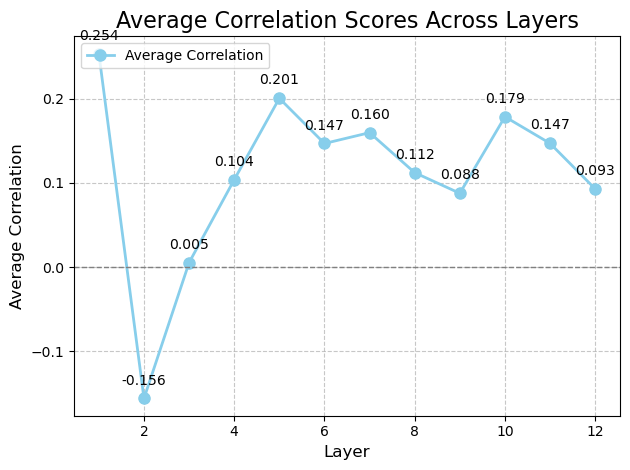

In [9]:
import os    
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True' # fix for kernel keeps dying when importing matplot

import matplotlib.pyplot as plt

# Plot with a smooth line and markers
plt.plot(range(1, 13), averages, marker='o', linestyle='-', color='skyblue', linewidth=2, markersize=8, label='Average Correlation')
plt.scatter(range(1, 13), averages, color='orange', s=50)

# Title and labels
plt.title('Average Correlation Scores Across Layers', fontsize=16)
plt.xlabel('Layer', fontsize=12)
plt.ylabel('Average Correlation', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(loc='upper left', fontsize=10)
plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)

for i, txt in enumerate(averages):
    plt.annotate(f'{txt:.3f}', (i + 1, txt), textcoords="offset points", xytext=(0,10), ha='center')
    
plt.tight_layout()
plt.show()

In [10]:
def attention_heatmap(
    subwords: List[str],
    att_scores: torch.Tensor,  # shape seq len x seq len
    agg: str = "avg",
    title: str = 'self-attention scores'
):
    subwords = [subword for subword in subwords if subword != '[PAD]']
    ticks_axes = subwords
    n_ticks = len(subwords)

    # Apply square root transformation to the attention scores to give smaller numbers more weight
    if agg == "avg":
        att_scores_transformed = np.sqrt(att_scores[:len(ticks_axes), :len(ticks_axes)].T.cpu().detach().numpy())
        
    elif agg == "sum":
        att_scores_transformed = att_scores[:len(ticks_axes), :len(ticks_axes)].T.cpu().detach().numpy()
    
    else:
        raise NotImplementedError("Choose between 'avg' or 'sum'")
    
    fig, ax = plt.subplots(figsize=(n_ticks / 2, n_ticks / 2))
    cax = ax.imshow(att_scores_transformed,
                    cmap='Blues', vmin=0., vmax=1.)  # Use 'Blues' colormap
    cbar = fig.colorbar(cax, ticks=[0, 0.5, 1])
    cbar.ax.set_yticklabels(['0', '0.5', '1'])
    cbar.ax.get_yaxis().labelpad = 15
    cbar.ax.set_ylabel('Transformed Attention scores', rotation=270)
    plt.yticks([j for j in range(len(ticks_axes))], ticks_axes)
    plt.xticks([j for j in range(len(ticks_axes))], [j for j in range(len(ticks_axes))])
    ax_t = ax.secondary_xaxis('top')
    ax_t.set_xticks([j for j in range(len(ticks_axes))], [j for j in range(len(ticks_axes))])
    ax_t.set_xticks([j for j in range(len(ticks_axes))])
    ax_t.set_xticklabels(ticks_axes, rotation=90)
    plt.ylabel('Query')
    plt.xlabel('Key')
    plt.title(title)
    plt.show()
    plt.close()
    

In [11]:
#!pip install bertviz #uncomment if you need to install
from bertviz import head_view

In [12]:
attentions1 = [layer[0] for layer in medium_sentence[1][0]]
attentions1 = [layer.unsqueeze(0) for layer in attentions1]
tokens1 = medium_sentence[0]

In [13]:
head_view(attentions1, tokens1[0])

<IPython.core.display.Javascript object>

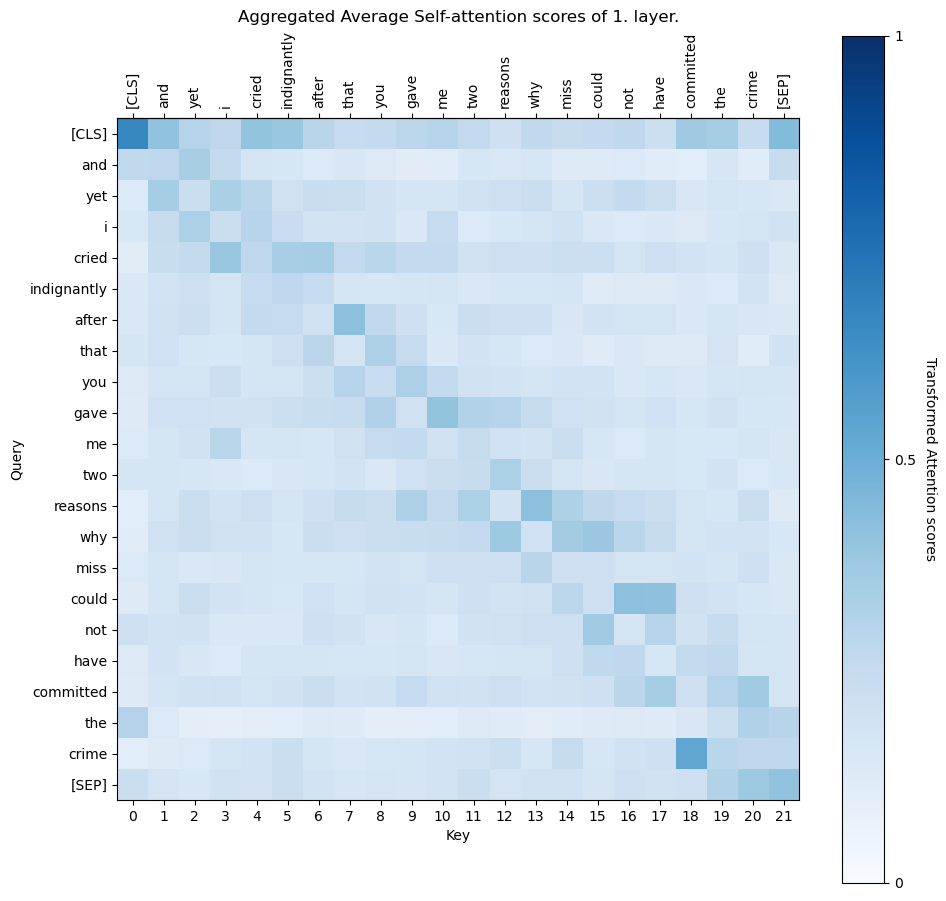

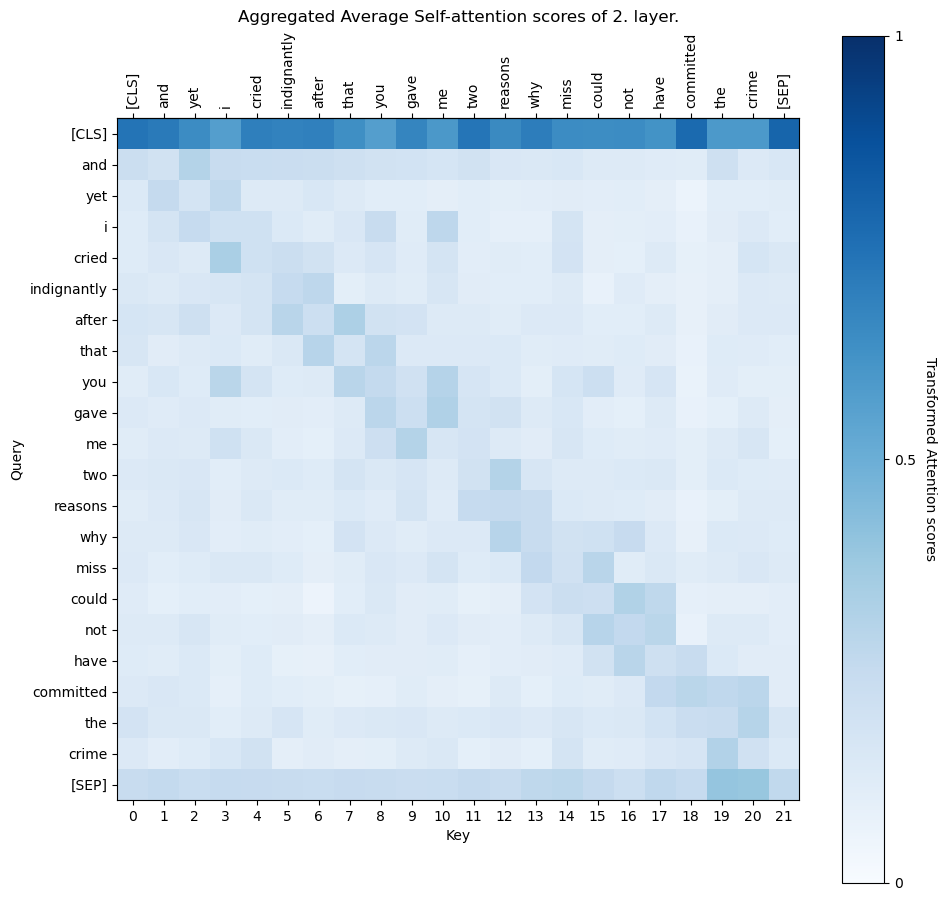

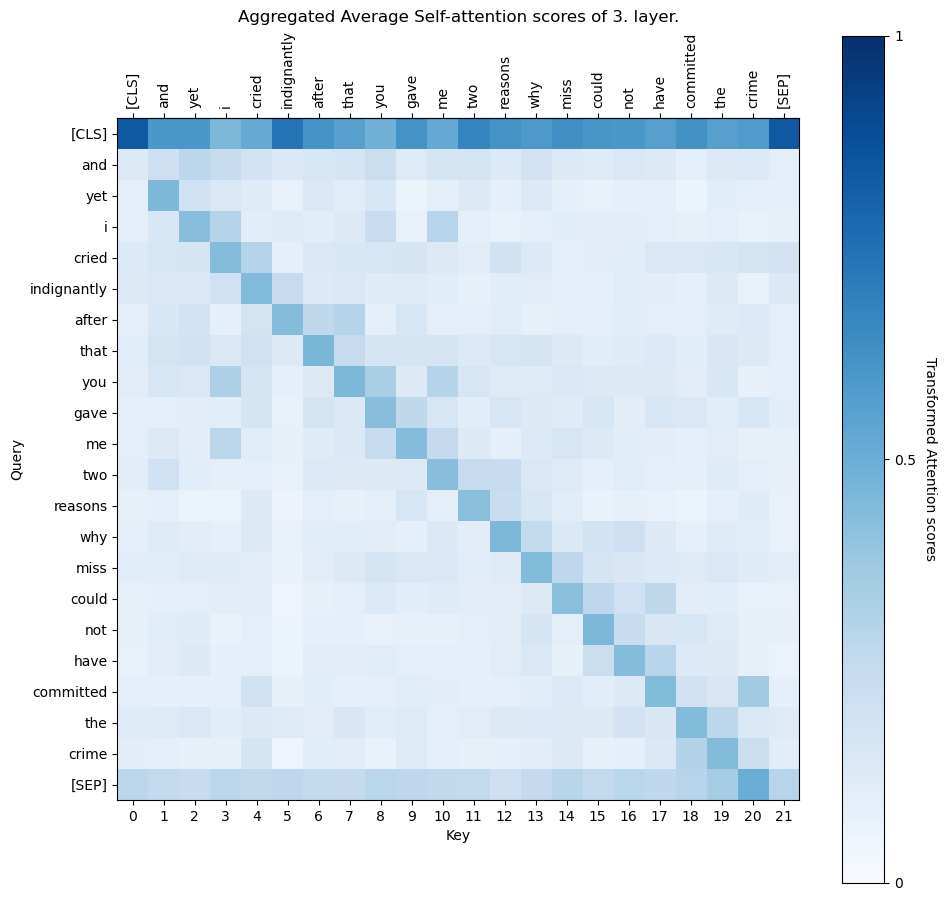

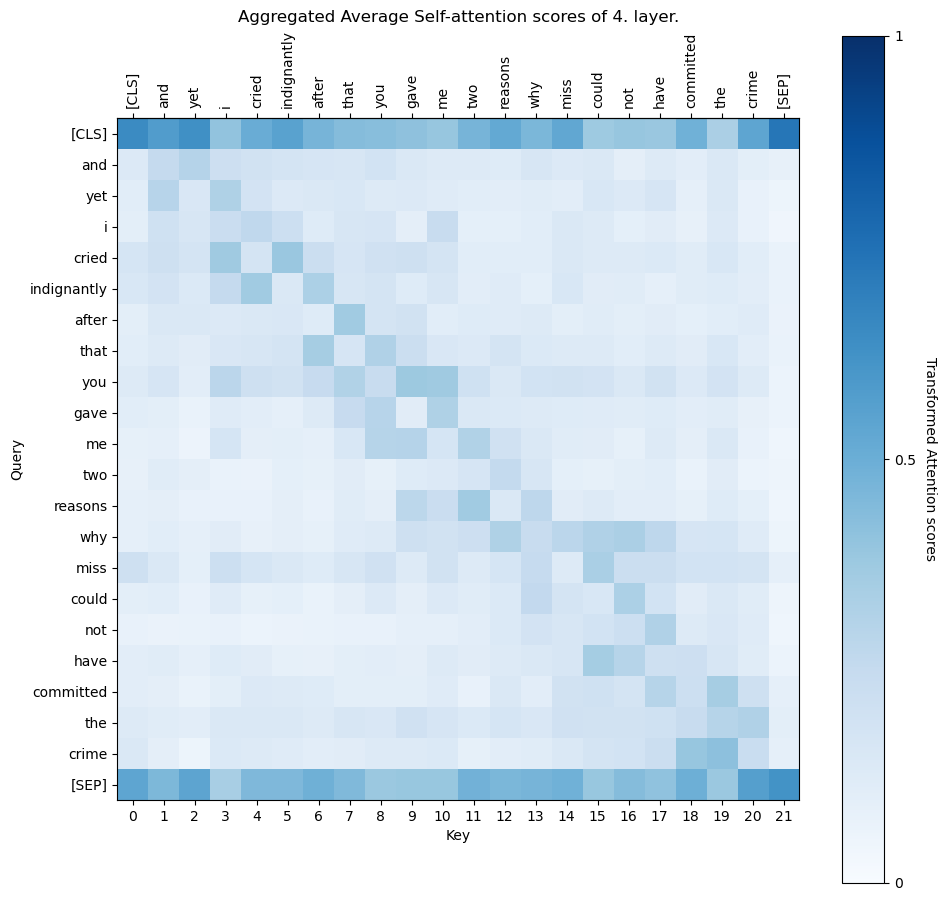

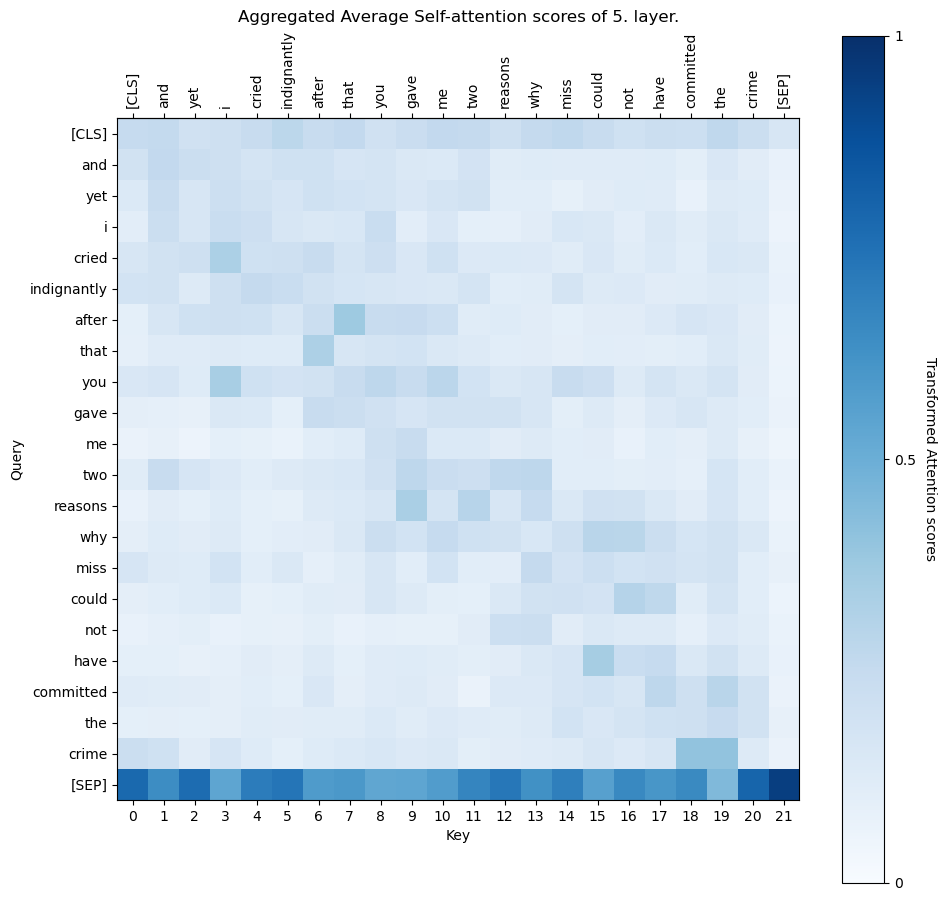

...

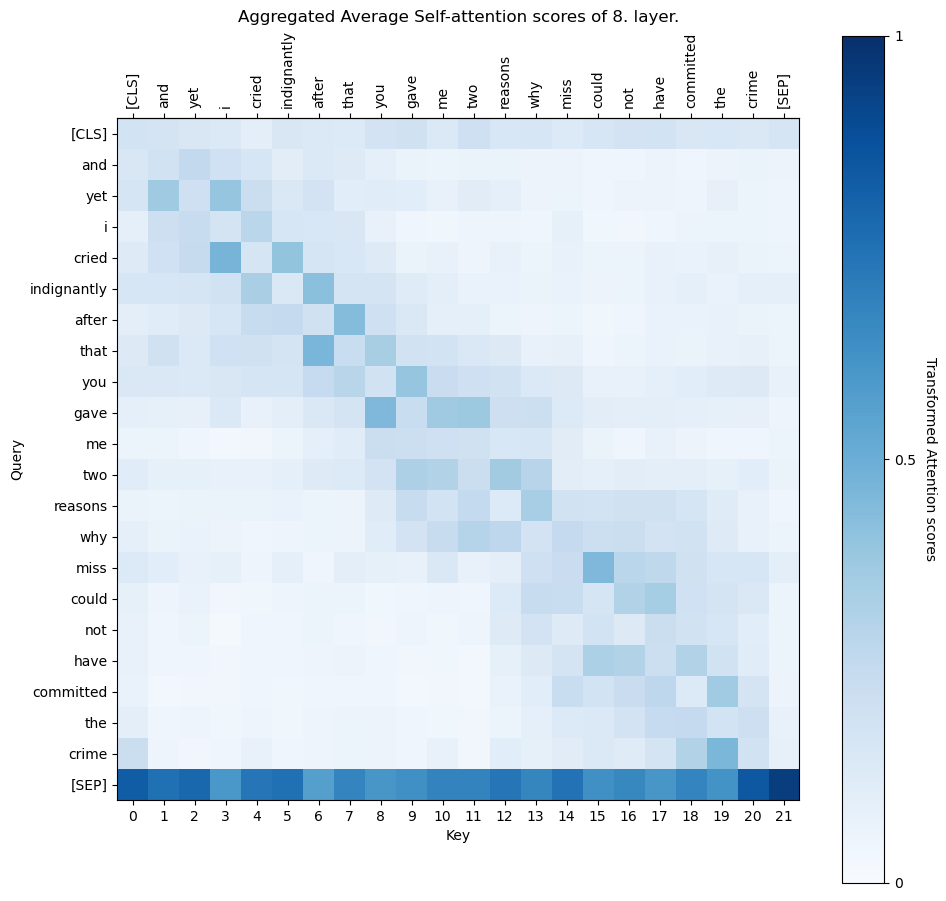

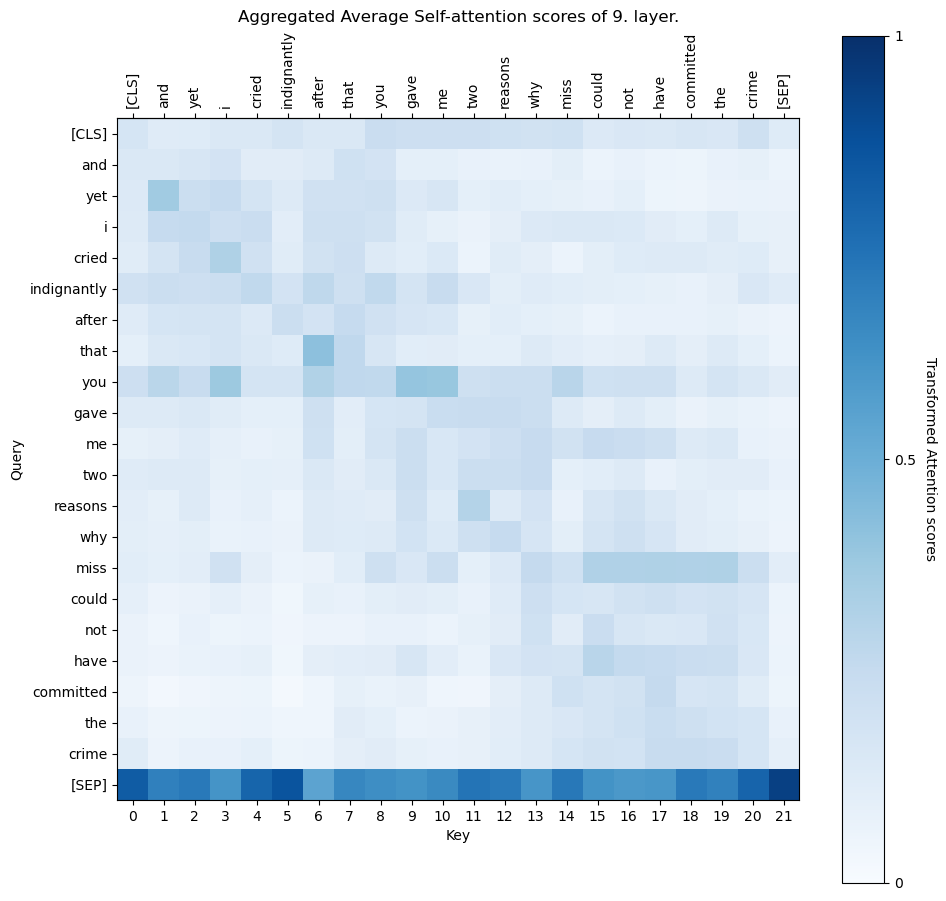

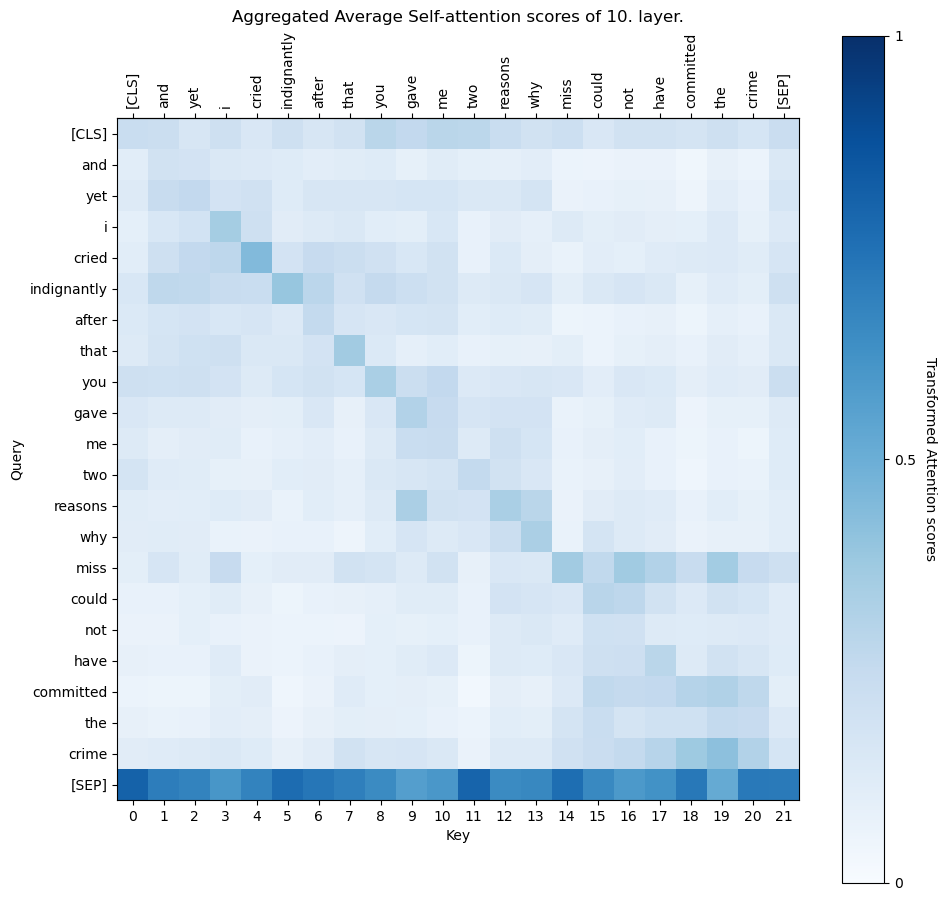

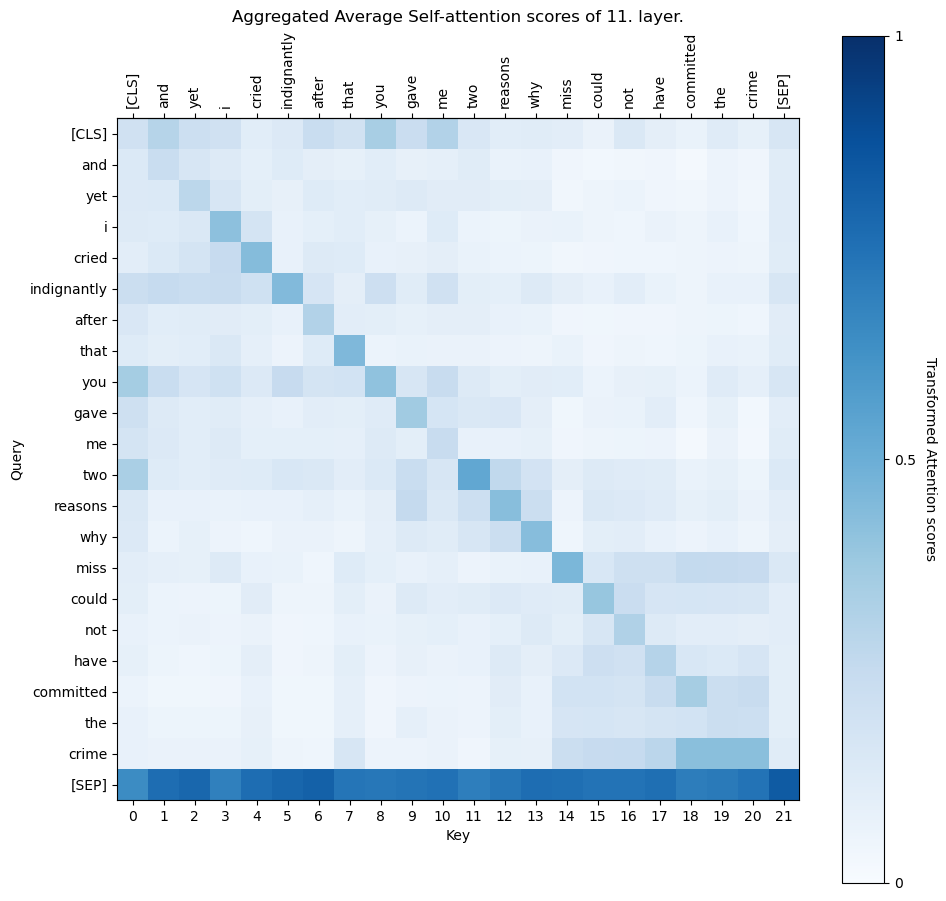

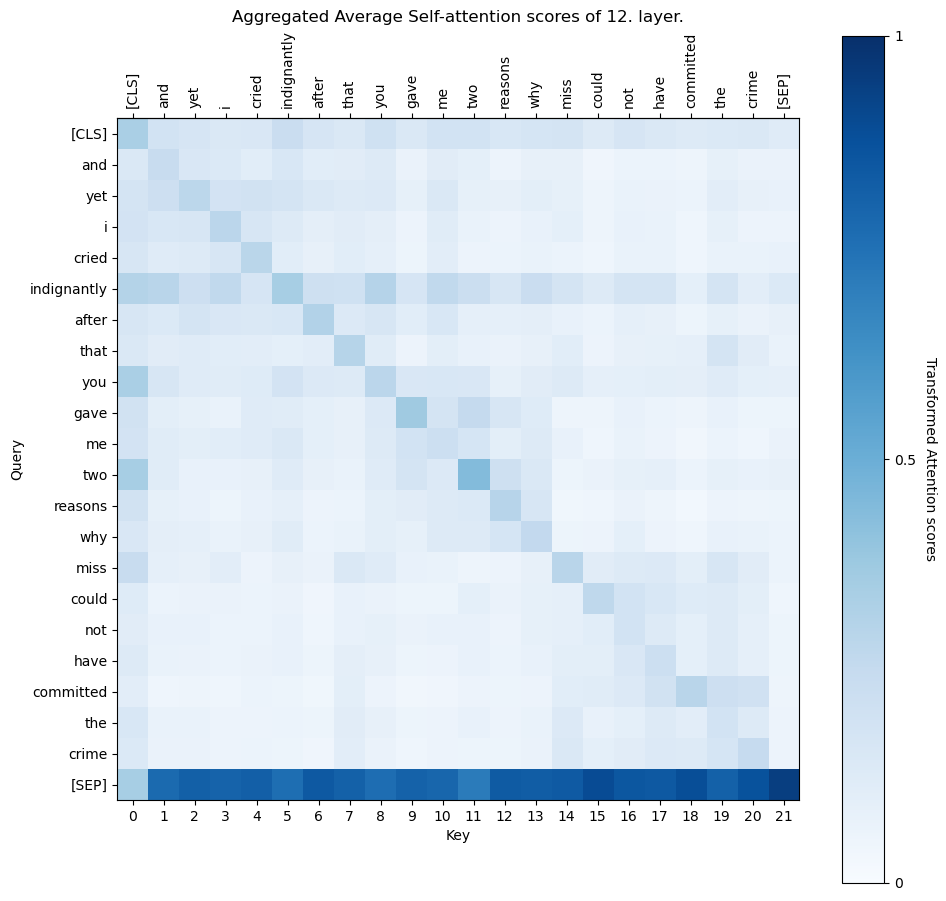

In [14]:
for j in range(12):
    attention_avg = torch.mean(attentions1[j][0], dim=0)
    attention_heatmap(subwords=tokens1[0], att_scores=attention_avg, title=f'Aggregated Average Self-attention scores of {j+1}. layer.')

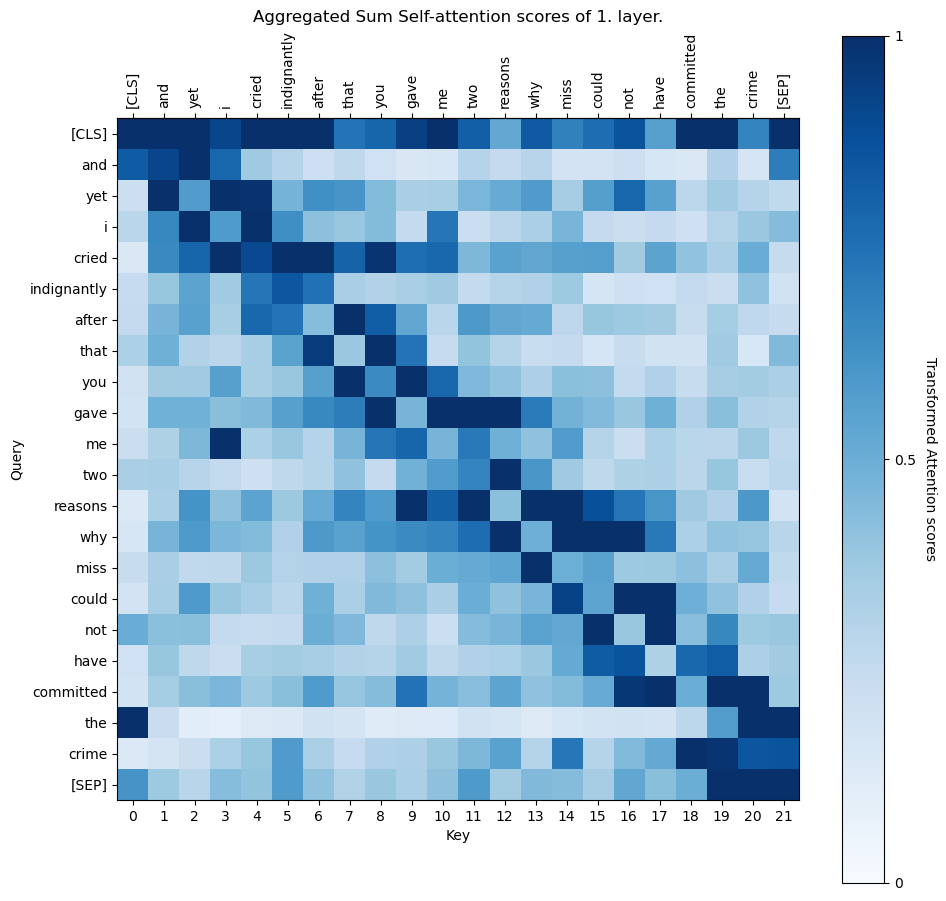

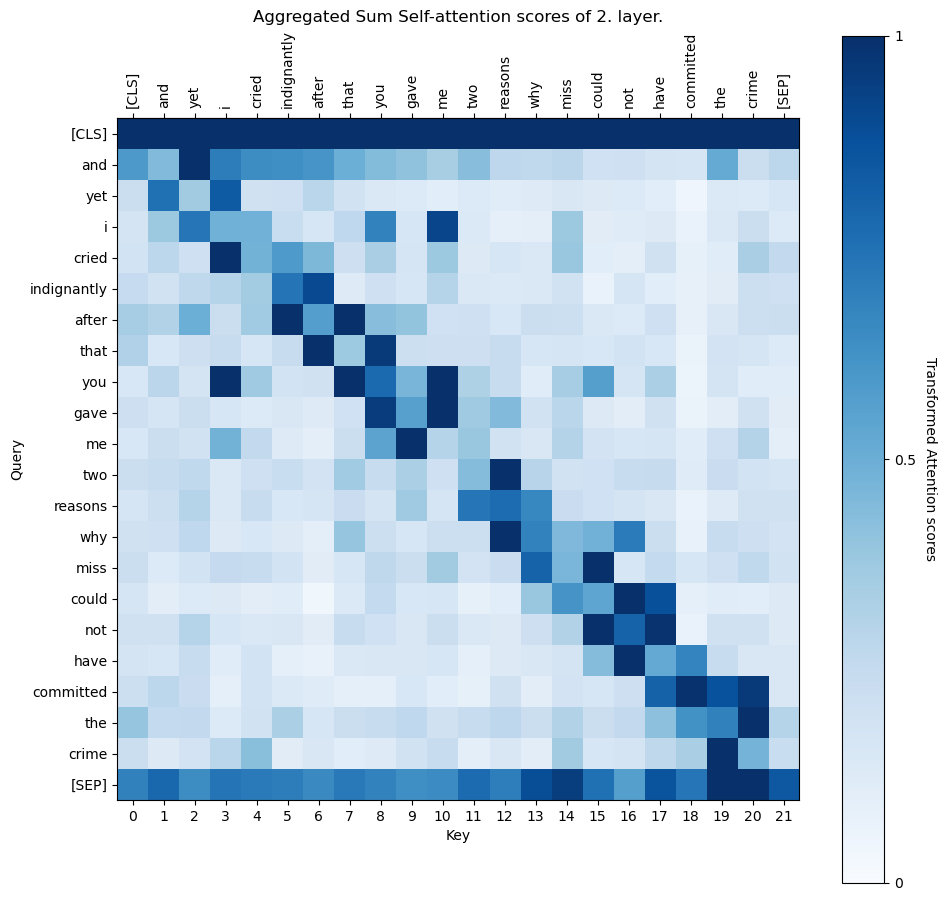

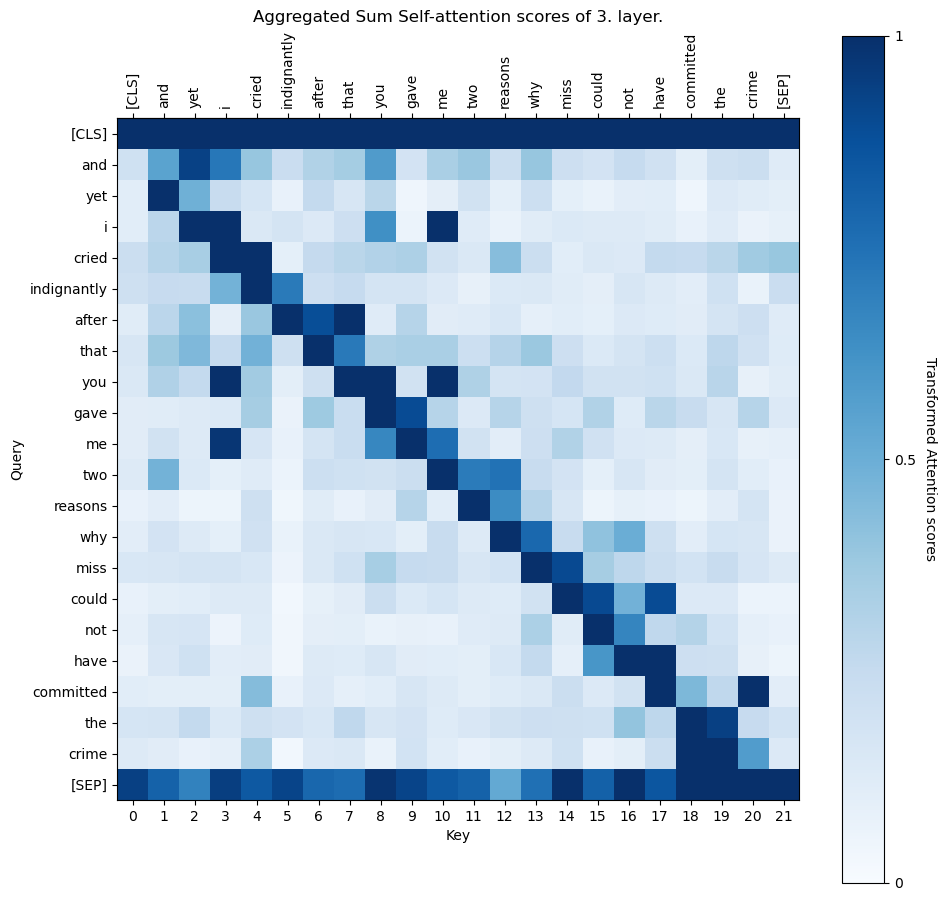

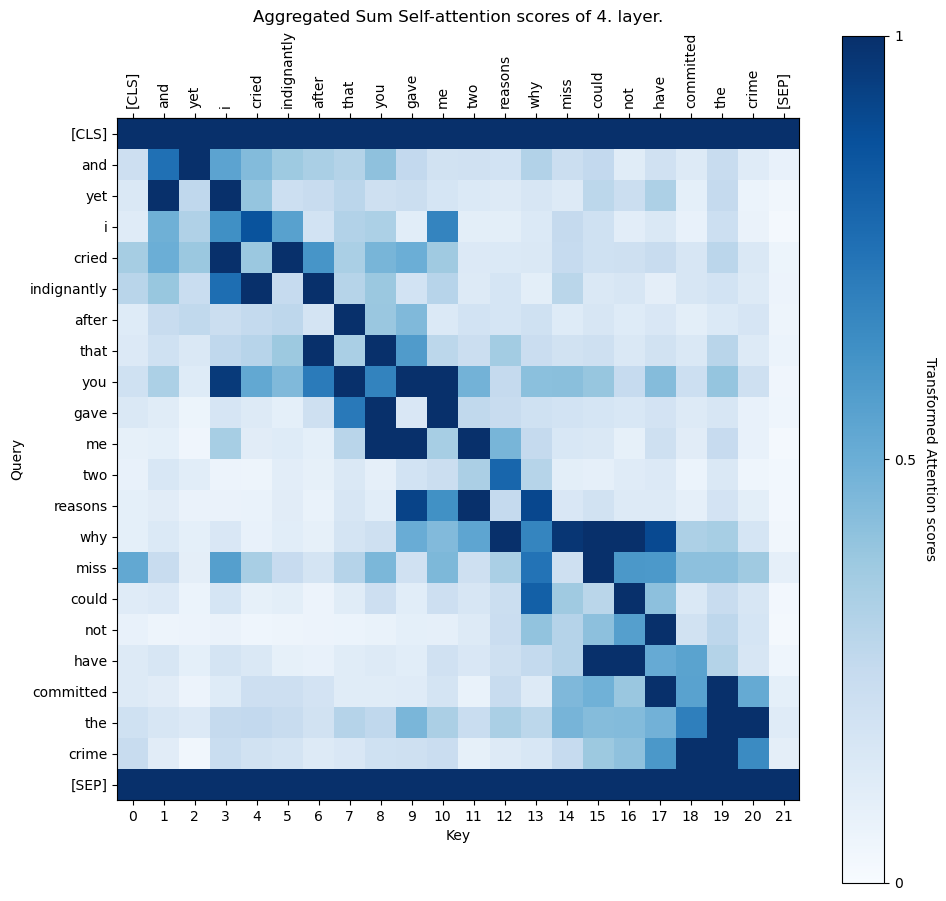

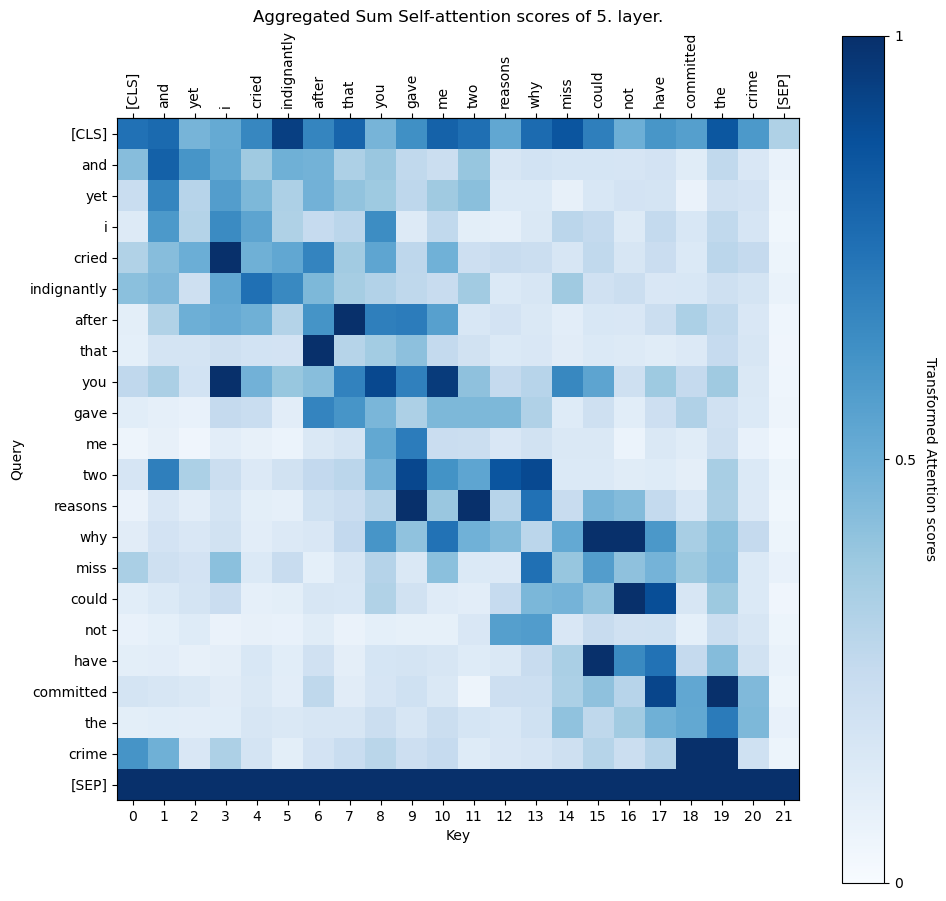

...

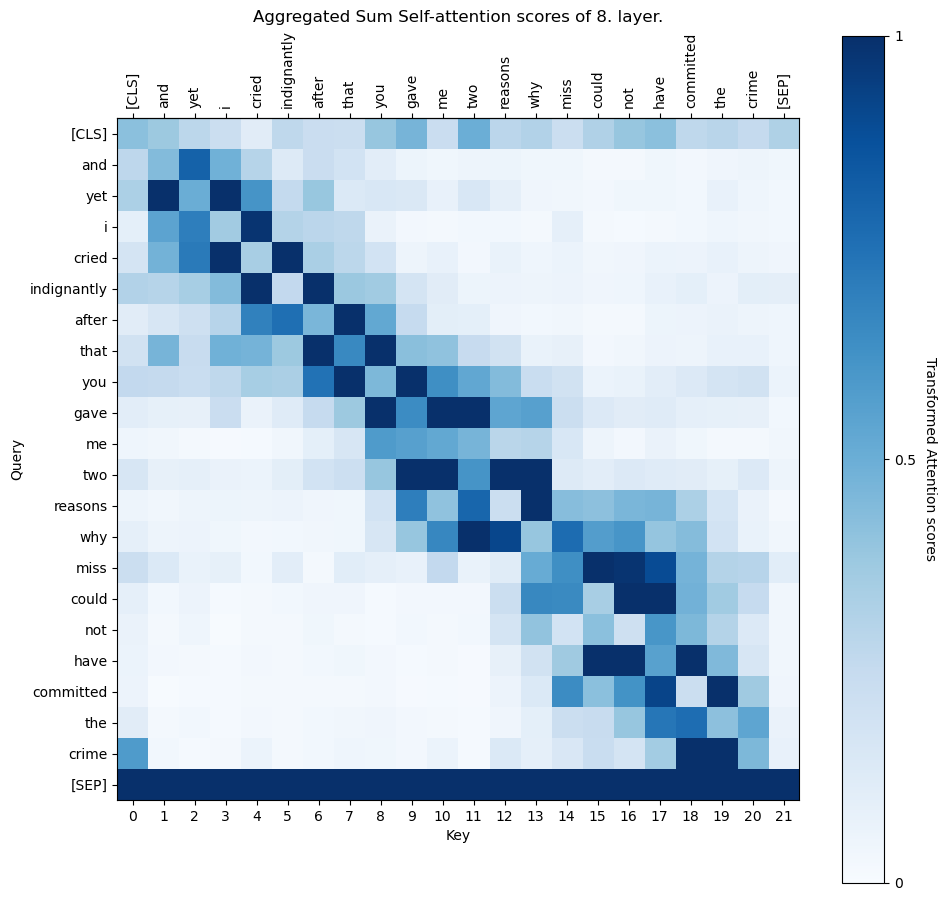

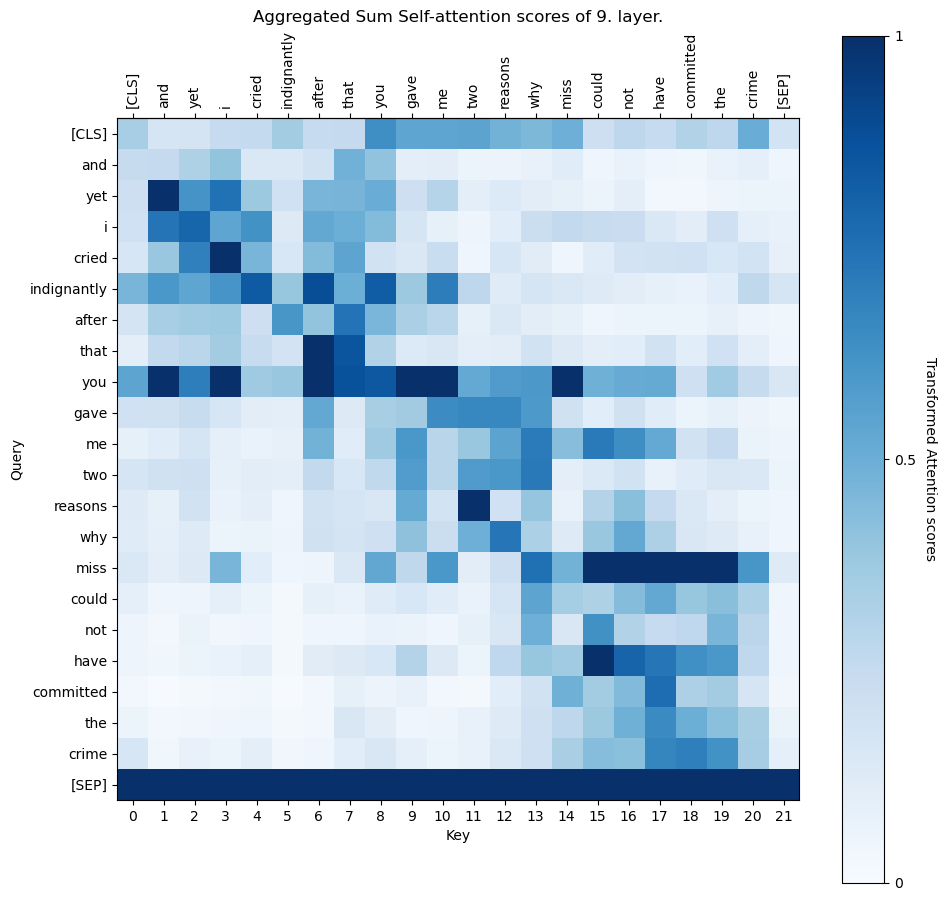

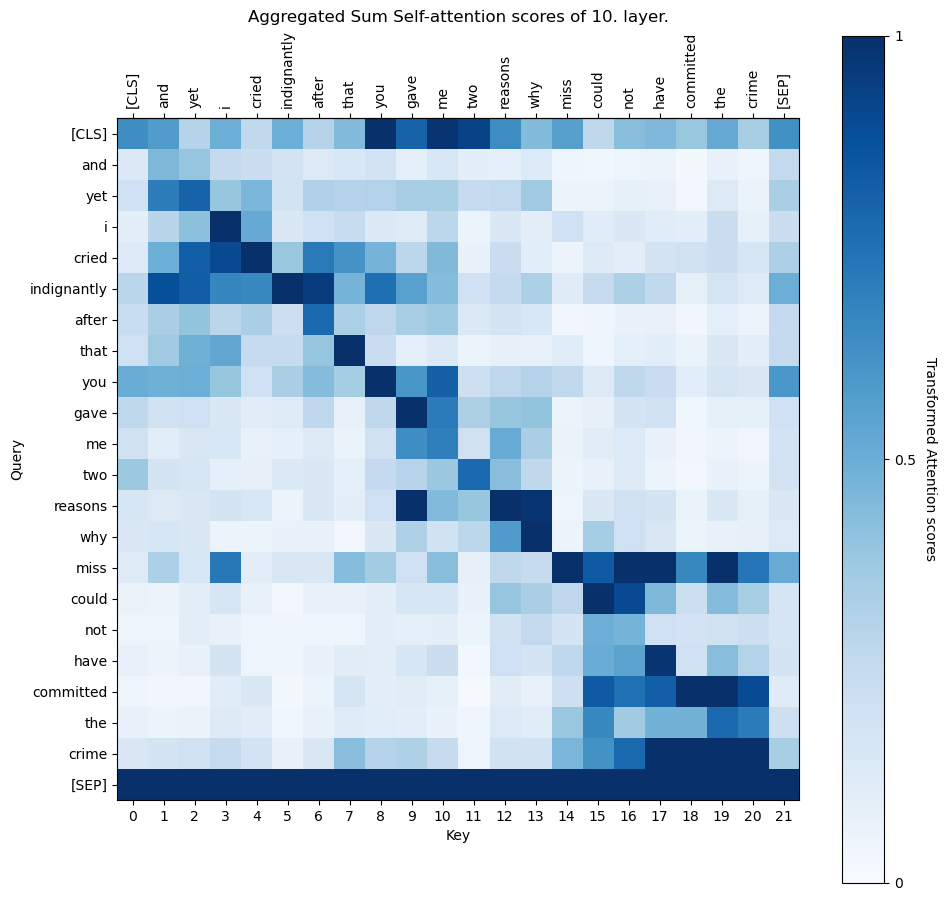

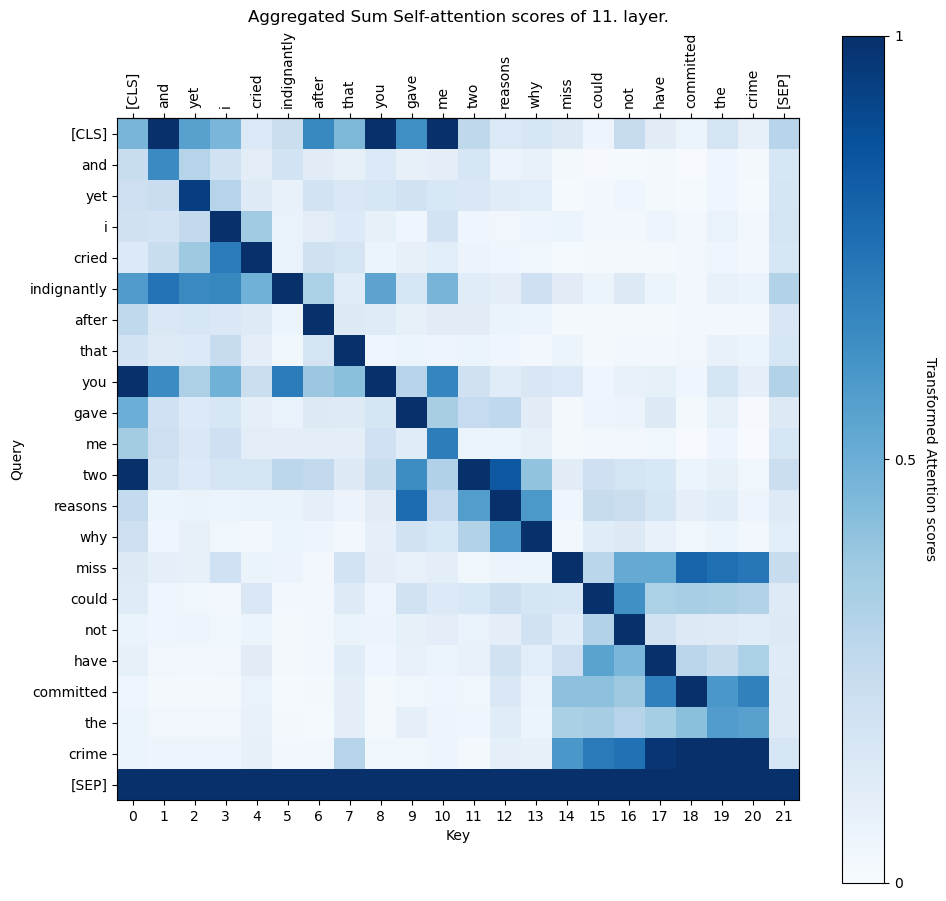

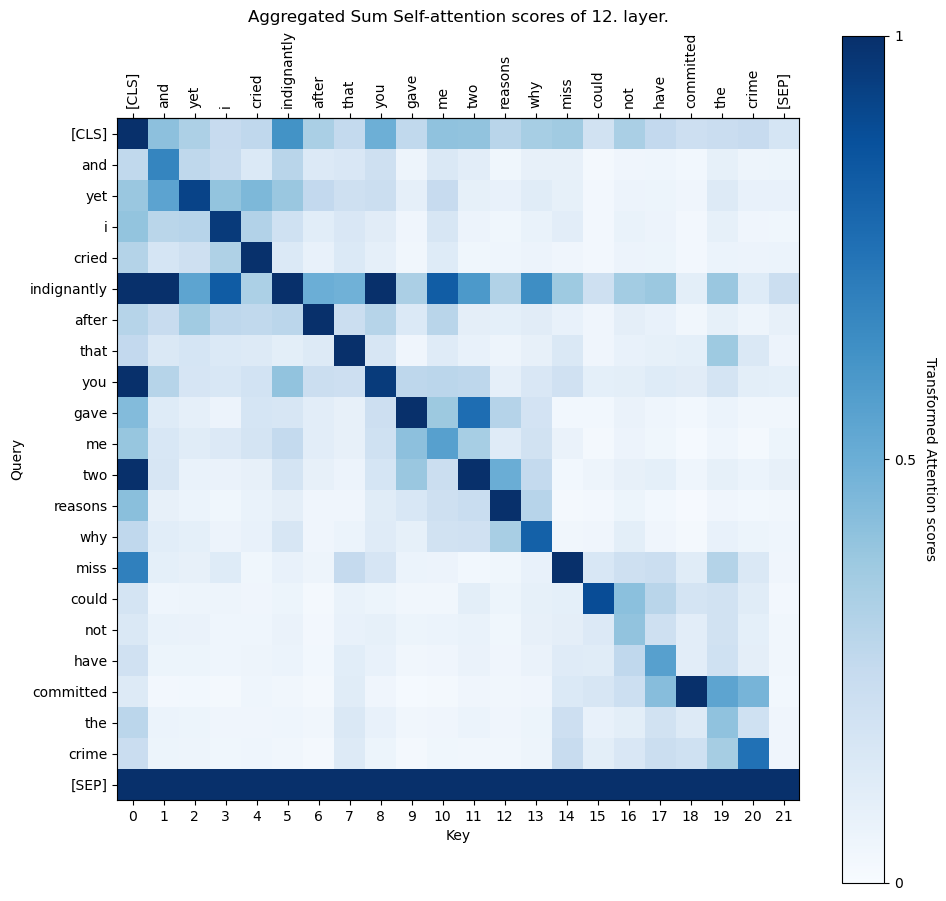

In [15]:
for j in range(12):
    attention_sum = torch.sum(attentions1[j][0], dim=0)
    attention_heatmap(subwords=tokens1[0], att_scores=attention_sum, agg="sum", title=f'Aggregated Sum Self-attention scores of {j+1}. layer.')

In [16]:
attentions2 = [layer[0] for layer in longest_sentence[1][0]]
attentions2 = [layer.unsqueeze(0) for layer in attentions2]
tokens2 = longest_sentence[0]

#head_view(attentions2, tokens2[0])

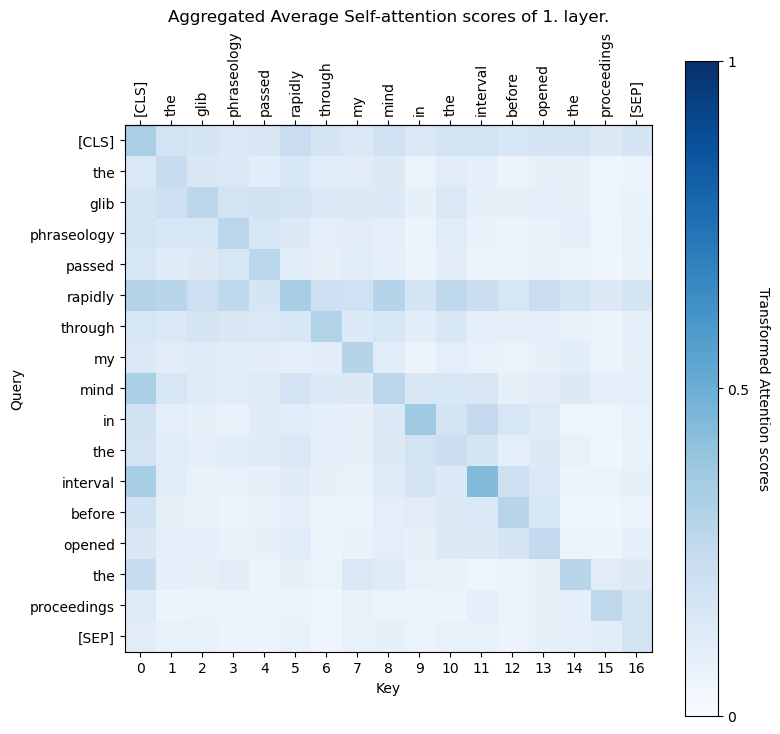

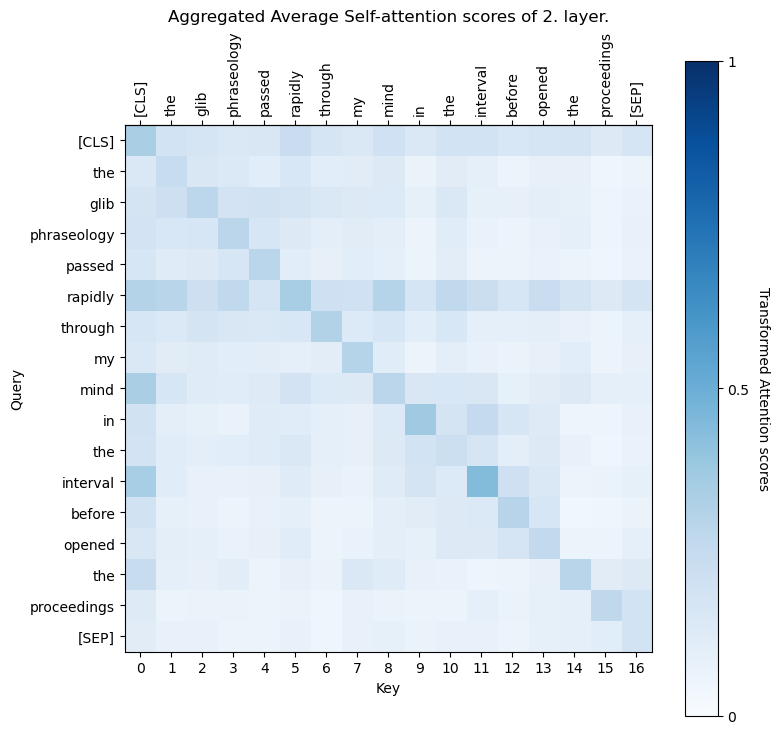

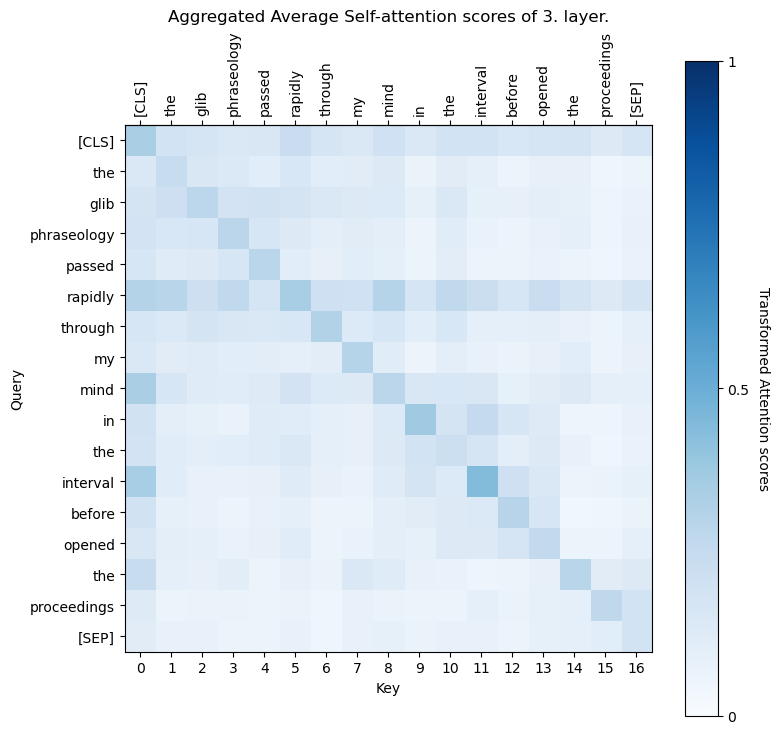

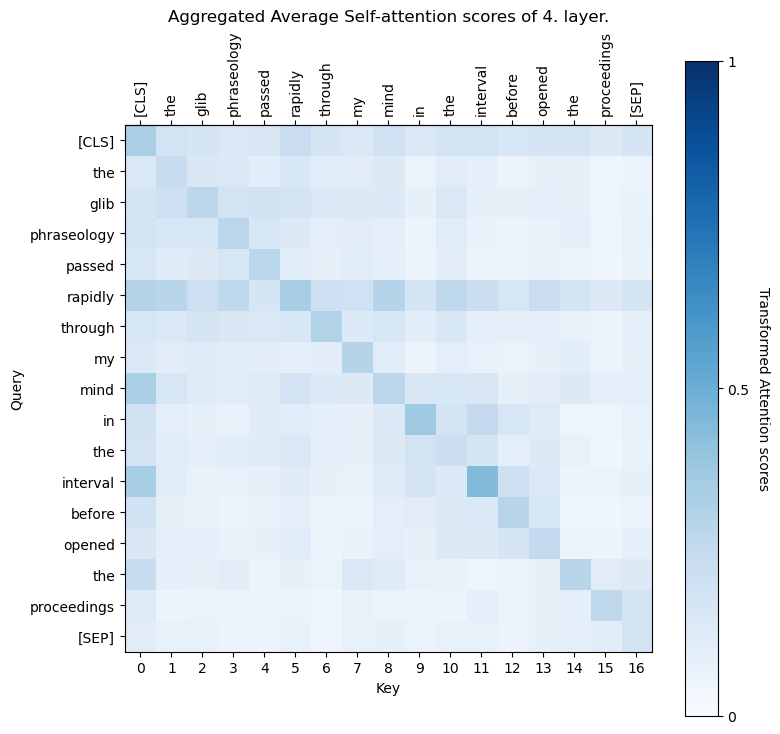

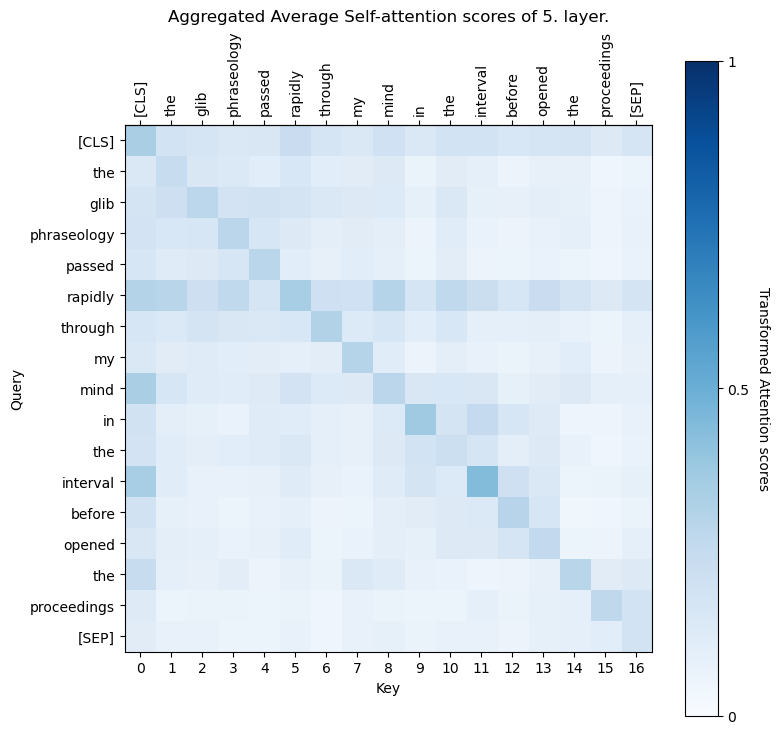

...

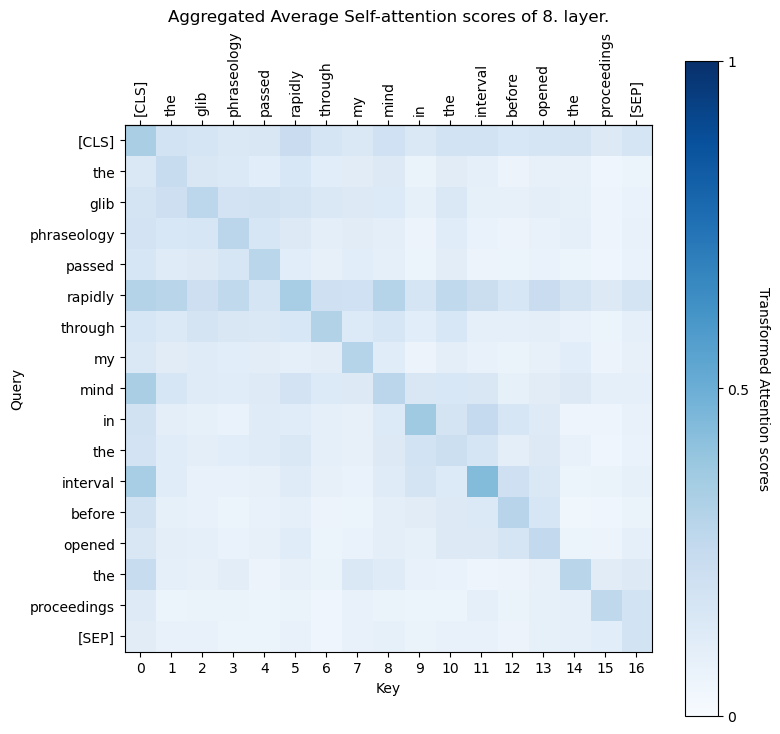

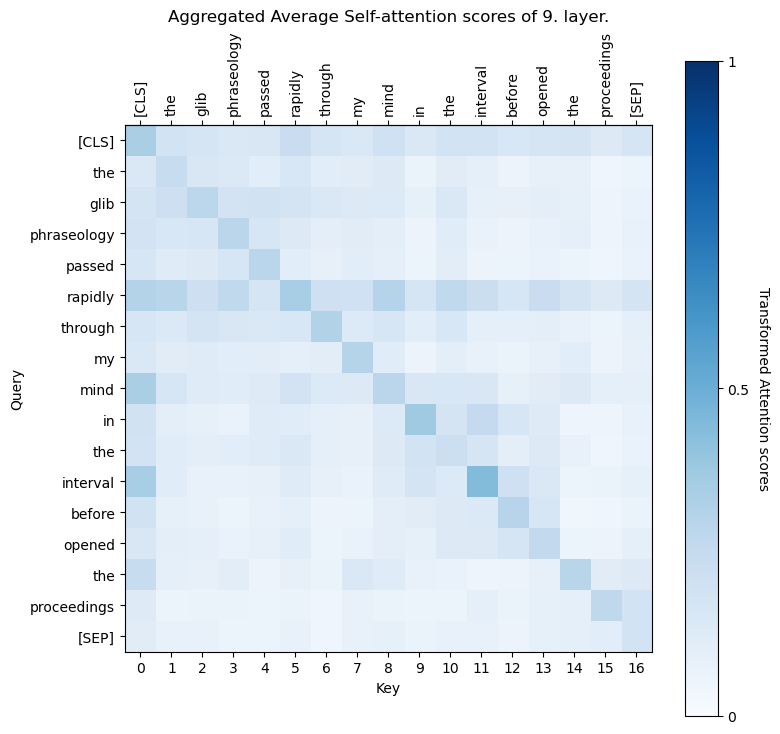

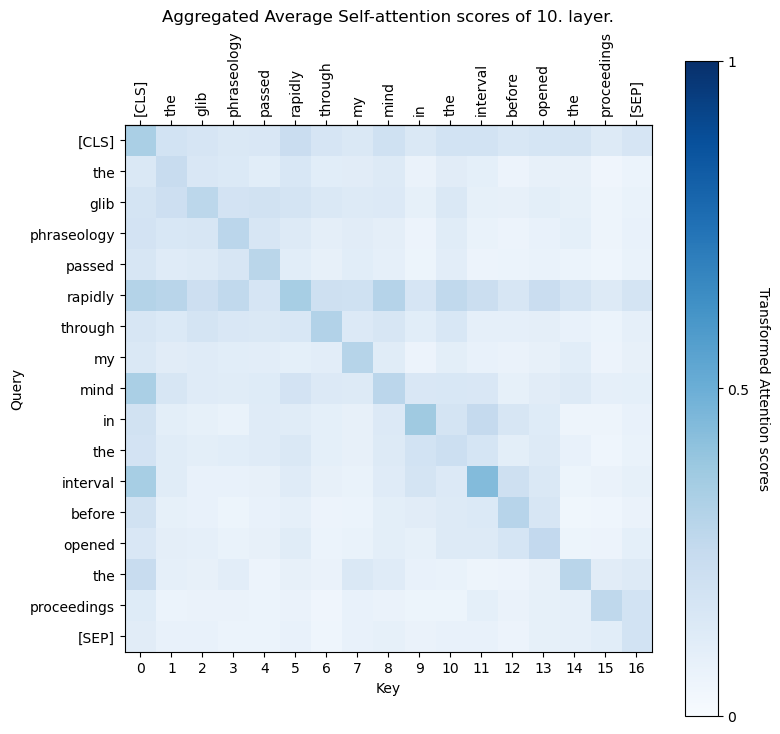

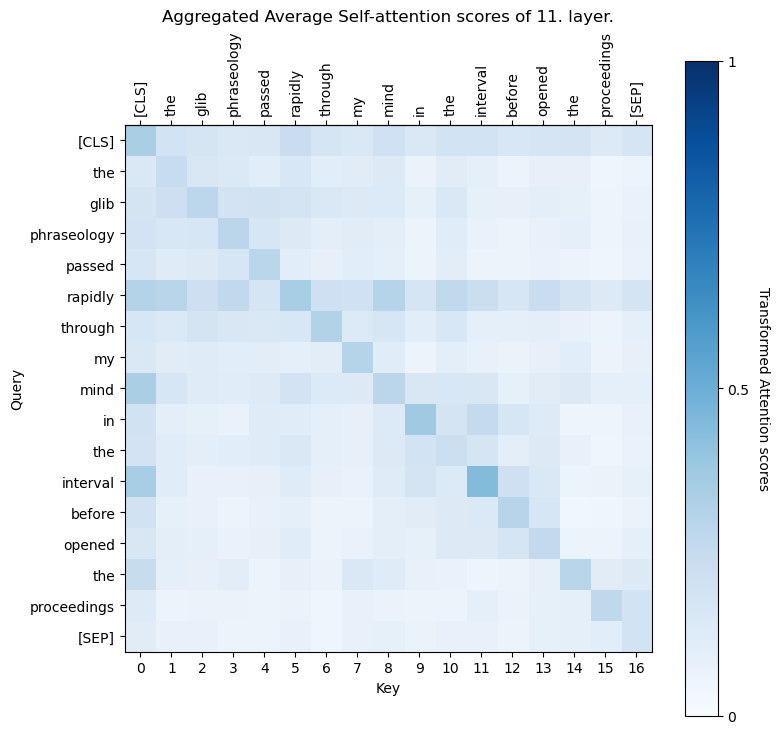

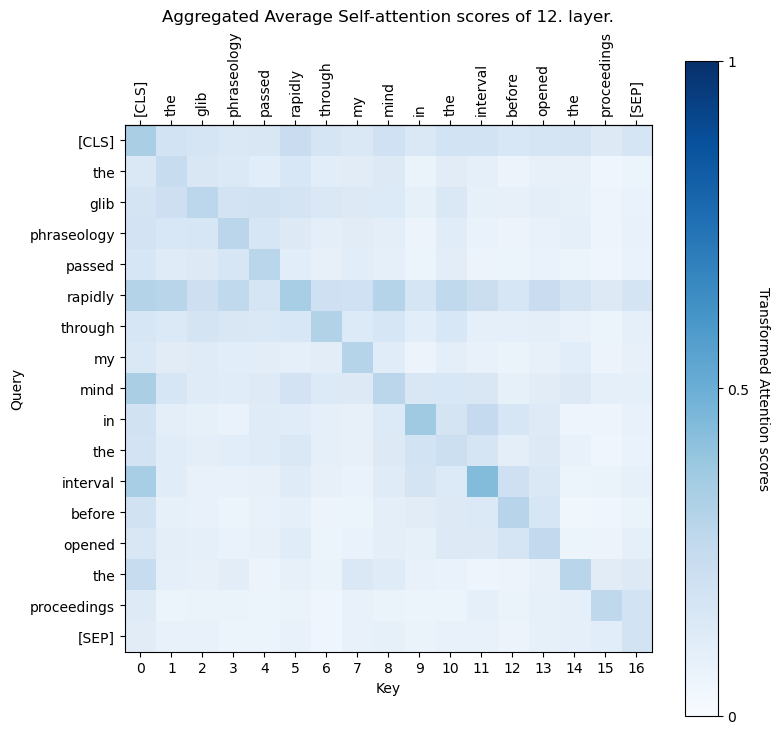

In [17]:
attentions3 = [layer[0] for layer in rare_sentence[1][0]]
attentions3 = [layer.unsqueeze(0) for layer in attentions3]
tokens3 = rare_sentence[0]

for j in range(12):
    attention_sum = torch.sum(attentions3[j][0], dim=0)
    attention_heatmap(subwords=tokens3[0], att_scores=attention_avg, title=f'Aggregated Average Self-attention scores of {j+1}. layer.')

In [18]:
head_view(attentions3, tokens3[0])

<IPython.core.display.Javascript object>